# TFT:

## Getting it working

In [1]:
!pip install pytorch_forecasting
!pip install torch
!pip install pytorch_lightning
!pip install ta

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.9/260.9 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 821.1/821.1 kB 47.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 55.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 39.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 58.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.


Validation time_idx range: 6076 to 6207


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 16.5 K | train
------------------------------------------------------------
16.5 K    Trainable params
0         Non-trainable params
16.5 K    Total params
0.066     Total estimated model params size (MB)
191       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.010


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.009


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.008


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 5 records. Best score: 0.008. Signaling Trainer to stop.


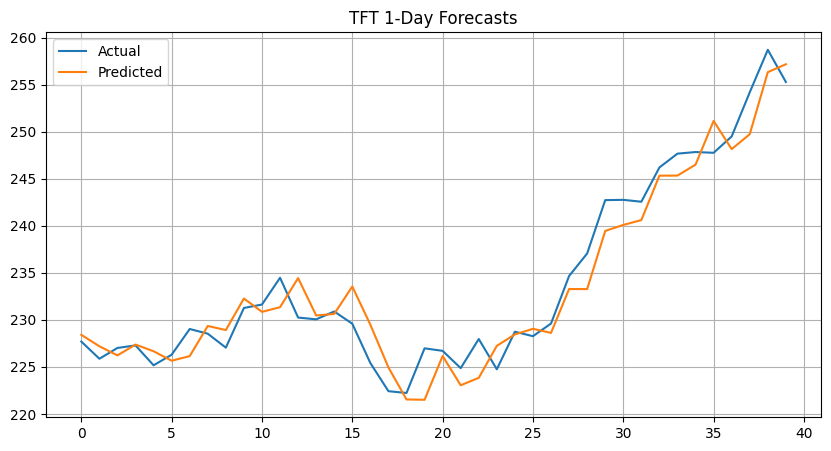

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import NaNLabelEncoder, TorchNormalizer # Import TorchNormalizer
from pytorch_forecasting.metrics import SMAPE, QuantileLoss
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import warnings

warnings.filterwarnings("ignore")

# Load CSV
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]

# Create time_idx and group
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'  # Required for grouping
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

max_encoder_length = 30   # Past 30 days
max_prediction_length = 1 # Forecast next day

training_cutoff = df["time_idx"].max() - max_prediction_length

training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Validation set created from training config
# Calculate how much past context is needed
encoder_plus_decoder = max_encoder_length + max_prediction_length + 100

# Get the validation portion with enough history
df_val = df[df.time_idx > (training_cutoff - encoder_plus_decoder)]
print("Validation time_idx range:", df_val["time_idx"].min(), "to", df_val["time_idx"].max())

# Now build the validation set
validation = TimeSeriesDataSet.from_dataset(
    training,
    df_val,
    stop_randomization=True
)

batch_size = 64

train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.03,
    hidden_size=16,
    attention_head_size=1,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)

class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        # Eğitim adımını gerçekleştir
        x, y = batch
        # `model` içindeki `loss` hesaplamasını doğru şekilde ayarla
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        # Doğrulama adımını gerçekleştir
        x, y = batch
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        # Adam optimizasyon algoritmasını kullanarak optimizer ayarla
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)
        return optimizer

tft_module = TFTLightningModule(tft)
# https://github.com/egemenozen1/pytorch-forecasting-tft/blob/master/notebooks/analysis.ipynb

early_stop = EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[early_stop],
    limit_train_batches=30,  # Faster for testing
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(
    tft_module,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader
)

# Predict on validation
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = tft.predict(val_dataloader)

# Plot a few samples
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(actuals[:100], label='Actual')
plt.plot(predictions[:100], label='Predicted')
plt.title("TFT 1-Day Forecasts")
plt.legend()
plt.grid()
plt.show()



Code now works.

From Hu TFT Paper:
Learning Rate 0.01
Hidden Node Size 128       
Attention Head Size 2
Dropout Rate 0.1
Stopping Delta 1.00E-04
Loss: SMAPE
Scaling MinMax
Close and volume

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Validation time_idx range: 6076 to 6207


INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.010


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.009


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.008


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.007


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 5 records. Best score: 0.007. Signaling Trainer to stop.


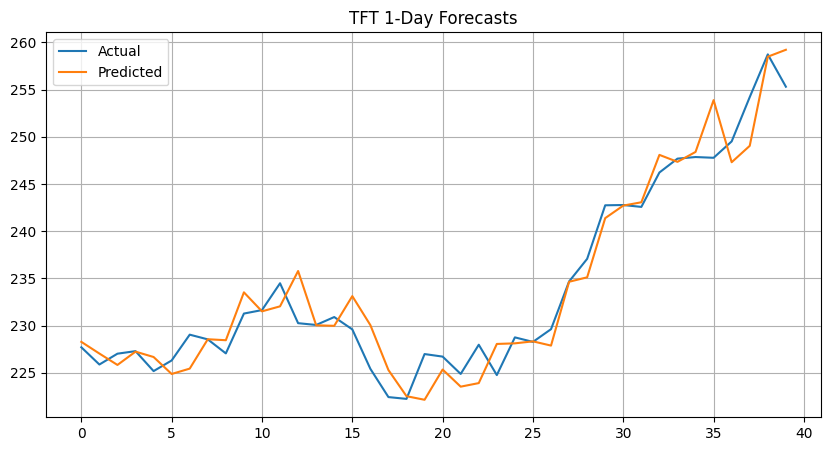

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import NaNLabelEncoder, TorchNormalizer # Import TorchNormalizer
from pytorch_forecasting.metrics import SMAPE, QuantileLoss
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import warnings

warnings.filterwarnings("ignore")

# Load CSV
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]

# Create time_idx and group
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'  # Required for grouping
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

max_encoder_length = 30   # Past 30 days
max_prediction_length = 1 # Forecast next day

training_cutoff = df["time_idx"].max() - max_prediction_length

training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Validation set created from training config
# Calculate how much past context is needed
encoder_plus_decoder = max_encoder_length + max_prediction_length + 100

# Get the validation portion with enough history
df_val = df[df.time_idx > (training_cutoff - encoder_plus_decoder)]
print("Validation time_idx range:", df_val["time_idx"].min(), "to", df_val["time_idx"].max())

# Now build the validation set
validation = TimeSeriesDataSet.from_dataset(
    training,
    df_val,
    stop_randomization=True
)

batch_size = 64

train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)

class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        # Eğitim adımını gerçekleştir
        x, y = batch
        # `model` içindeki `loss` hesaplamasını doğru şekilde ayarla
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        # Doğrulama adımını gerçekleştir
        x, y = batch
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        # Adam optimizasyon algoritmasını kullanarak optimizer ayarla
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)
        return optimizer

tft_module = TFTLightningModule(tft)
# https://github.com/egemenozen1/pytorch-forecasting-tft/blob/master/notebooks/analysis.ipynb

early_stop = EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[early_stop],
    limit_train_batches=30,  # Faster for testing
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(
    tft_module,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader
)

# Predict on validation
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = tft.predict(val_dataloader)

# Plot a few samples
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(actuals[:100], label='Actual')
plt.plot(predictions[:100], label='Predicted')
plt.title("TFT 1-Day Forecasts")
plt.legend()
plt.grid()
plt.show()



around 10s per epoch using colab cpu.

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import TorchNormalizer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import warnings
warnings.filterwarnings("ignore")

# Load CSV
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]

# Create time_idx and group
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

# Define lengths
max_encoder_length = 60
max_prediction_length = 252

# Create training set
training_cutoff = df["time_idx"].max() - max_prediction_length
training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Build validation set for 2024
start_date = pd.to_datetime("2024-01-01")
end_date = pd.to_datetime("2024-12-31")
context_days = pd.Timedelta(days=max_encoder_length)

df_val = df[(df["Date"] >= (start_date - context_days)) & (df["Date"] <= end_date)]
validation = TimeSeriesDataSet.from_dataset(
    training,
    df_val,
    predict=True,
    stop_randomization=True
)

# Dataloaders
batch_size = 64
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

# Model
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)

# Lightning wrapper
from pytorch_lightning import LightningModule

class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

tft_module = TFTLightningModule(tft)

early_stop = EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")
trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[early_stop],
    logger=TensorBoardLogger("lightning_logs")
)

# Train
trainer.fit(tft_module, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

# Predict
raw_preds = tft.predict(val_dataloader, return_x=True)
y_pred = raw_preds[0].detach().cpu().numpy().flatten()
x = raw_preds[1]
y_true = x['decoder_target'].detach().cpu().numpy().flatten()

# Dates for plotting
dates = x["decoder_time_idx"].detach().cpu().numpy().flatten()
date_mapping = df.set_index("time_idx")["Date"].to_dict()
date_labels = pd.to_datetime([date_mapping.get(idx, pd.NaT) for idx in dates])

# Metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")
print(f"MAPE: {mape:.2f}%")

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(date_labels, y_true, label="Actual")
plt.plot(date_labels, y_pred, label="Predicted")
plt.title("TFT Forecast for AAPL - 2024")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu! (when checking argument for argument tensors in method wrapper_CUDA_cat)

3 mins per epoch colab cpu. so switch to gpu.

mins per epoch t4 gpu.

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.177


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 5 records. Best score: 0.177. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


RMSE: 44.9509
MAE: 41.3527
R²: -3.9829
MAPE: 18.25%


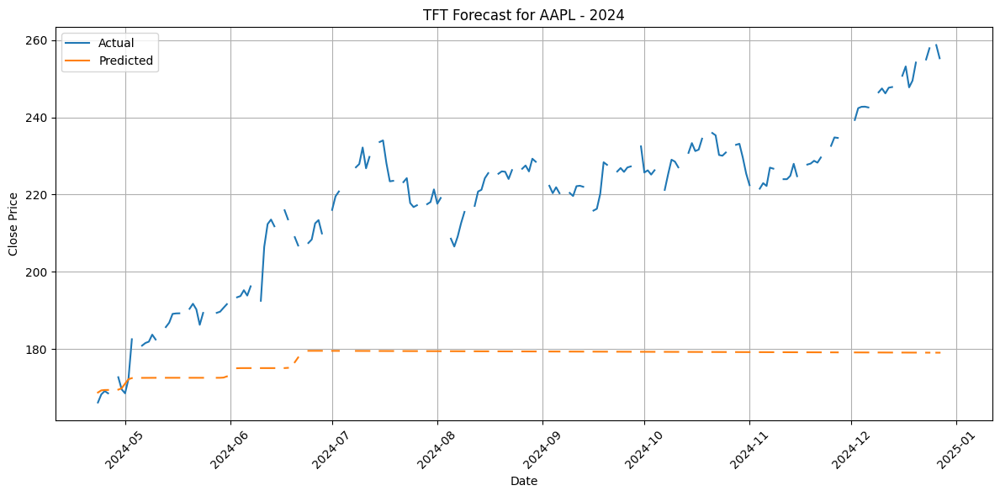

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import TorchNormalizer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import warnings
warnings.filterwarnings("ignore")

# Load CSV
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]

# Create time_idx and group
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

# Define lengths
max_encoder_length = 60
max_prediction_length = 252

# Create training set
training_cutoff = df["time_idx"].max() - max_prediction_length
training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Build validation set for 2024
start_date = pd.to_datetime("2024-01-01")
end_date = pd.to_datetime("2024-12-31")
context_days = pd.Timedelta(days=max_encoder_length)

df_val = df[(df["Date"] >= (start_date - context_days)) & (df["Date"] <= end_date)]
validation = TimeSeriesDataSet.from_dataset(
    training,
    df_val,
    predict=True,
    stop_randomization=True
)

# Dataloaders
batch_size = 64
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

# Model
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)

# Explicitly move the model to the GPU
tft.to('cuda')


# Lightning wrapper
from pytorch_lightning import LightningModule

class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        # Ensure input data is on the same device as the model
        x = {key: value.to(self.device) if isinstance(value, torch.Tensor) else value for key, value in x.items()}
        return self.model(x)

    def training_step(self, batch, batch_idx):
        # Ensure input data is on the same device as the model
        x, y = batch
        x = {key: value.to(self.device) if isinstance(value, torch.Tensor) else value for key, value in x.items()}
        y = y[0].to(self.device)
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        # Ensure input data is on the same device as the model
        x, y = batch
        x = {key: value.to(self.device) if isinstance(value, torch.Tensor) else value for key, value in x.items()}
        y = y[0].to(self.device)
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss


    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

tft_module = TFTLightningModule(tft)

early_stop = EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")
trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[early_stop],
    logger=TensorBoardLogger("lightning_logs"),
    accelerator="gpu",  # <--- Ensure GPU is used
    devices=1
)

# Train
trainer.fit(tft_module, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

# Predict
raw_preds = tft.predict(val_dataloader, return_x=True)
y_pred = raw_preds[0].detach().cpu().numpy().flatten()
x = raw_preds[1]
y_true = x['decoder_target'].detach().cpu().numpy().flatten()

# Dates for plotting
dates = x["decoder_time_idx"].detach().cpu().numpy().flatten()
date_mapping = df.set_index("time_idx")["Date"].to_dict()
date_labels = pd.to_datetime([date_mapping.get(idx, pd.NaT) for idx in dates])

# Metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")
print(f"MAPE: {mape:.2f}%")

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(date_labels, y_true, label="Actual")
plt.plot(date_labels, y_pred, label="Predicted")
plt.title("TFT Forecast for AAPL - 2024")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import TorchNormalizer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import warnings
warnings.filterwarnings("ignore")

# Load CSV
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]

# Create time_idx and group
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

# Define lengths
max_encoder_length = 60
max_prediction_length = 252

# Create training set
training_cutoff = df["time_idx"].max() - max_prediction_length
training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Build validation set for 2024
start_date = pd.to_datetime("2024-01-01")
end_date = pd.to_datetime("2024-12-31")
context_days = pd.Timedelta(days=max_encoder_length)

df_val = df[(df["Date"] >= (start_date - context_days)) & (df["Date"] <= end_date)]

# Create validation dataset directly from df_val
validation = TimeSeriesDataSet(
    df_val,
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True,
    target_normalizer=training.target_normalizer # Use normalizer from training set
)


# Dataloaders
batch_size = 64
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

# Model
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)

import types

def patched_get_attention_mask(self, encoder_lengths, decoder_lengths):
    """
    Generates attention mask to prevent from attending to future data

    This function is modified to produce a mask of shape
    [batch_size, 1, max_prediction_length, max_encoder_length + max_prediction_length]
    for the decoder's attention to both encoder and decoder parts.
    """
    device = encoder_lengths.device
    batch_size = encoder_lengths.size(0)

    max_encoder_length = encoder_lengths.max().item()
    max_decoder_length = decoder_lengths.max().item()
    total_length = max_encoder_length + max_decoder_length

    # Create a base mask for the full sequence (encoder + decoder)
    # This mask will be True for positions that should be masked (prevent attention)
    # and False for positions that should be attended to.
    full_sequence_mask = torch.zeros((total_length, total_length), dtype=torch.bool, device=device)

    # Mask out future positions in the decoder-to-decoder attention
    # For a decoder query at position `i` (relative to the start of the decoder sequence),
    # it can attend to key positions up to `i` in the decoder sequence.
    # Key positions in the full sequence are offset by max_encoder_length.
    for i in range(max_decoder_length):
        # Mask out positions beyond the current decoder step (inclusive of current step itself, then invert)
        # The keys are from 0 to total_length-1
        # The queries for decoder are from max_encoder_length to total_length-1
        # A decoder query at index `q_idx` (0 to max_decoder_length-1) corresponds to a full sequence index of `max_encoder_length + q_idx`
        # This query can attend to full sequence key indices from 0 up to `max_encoder_length + q_idx`
        query_global_idx = max_encoder_length + i
        full_sequence_mask[query_global_idx, query_global_idx + 1:] = True


    # The attention in TFT's decoder is from decoder to (encoder + decoder).
    # The query sequence length is max_prediction_length.
    # The key/value sequence length is max_encoder_length + max_prediction_length.
    # We need a mask of shape [batch_size, num_heads, max_prediction_length, max_encoder_length + max_prediction_length].
    # The masking applies to the key dimension.
    # For decoder query i (0 to max_prediction_length-1), it attends to keys from 0 to max_encoder_length + i.
    # Keys beyond max_encoder_length + i should be masked.

    decoder_key_indices_in_full_seq = torch.arange(max_decoder_length, device=device) + max_encoder_length
    full_key_indices = torch.arange(total_length, device=device) # 0 to total_length - 1

    mask = torch.zeros((max_decoder_length, total_length), dtype=torch.bool, device=device)

    for i in range(max_decoder_length):
        # Query at decoder step i (full sequence index max_encoder_length + i)
        # Can attend to keys up to full sequence index max_encoder_length + i
        mask[i, max_encoder_length + i + 1:] = True


    # Expand mask for batch size and attention heads (num_heads is handled by broadcasting implicitly)
    # Shape becomes [batch_size, 1, max_prediction_length, max_encoder_length + max_prediction_length]
    attention_mask = mask.unsqueeze(0).unsqueeze(0).expand(batch_size, -1, -1, -1)


    # Need to also handle padding based on encoder_lengths and decoder_lengths if necessary,
    # but the original TFT implementation might handle this within the attention call itself
    # or rely on the TimeSeriesDataSet padding. Let's assume the primary issue is the
    # causal masking shape first.

    # Let's create a mask based on actual lengths
    # Shape: [batch_size, 1, max_prediction_length, total_length]
    length_mask = torch.zeros((batch_size, 1, max_prediction_length, total_length), dtype=torch.bool, device=device)

    for b in range(batch_size):
        current_total_length = encoder_lengths[b] + decoder_lengths[b]
        # Decoder queries (max_encoder_length to total_length - 1) cannot attend to padded keys
        # Padded keys are from current_total_length to total_length - 1
        length_mask[b, :, :, current_total_length:] = True

        # Additionally, apply causal mask within the decoder part
        # This is already handled by the 'mask' calculated above, but we need to combine them.
        # The 'mask' calculated above is a general causal mask for max lengths.
        # We need to combine it with the length_mask which is batch-specific padding mask.

        # Combine causal mask and padding mask
        # Causal mask shape: [1, 1, max_prediction_length, total_length]
        causal_mask = mask.unsqueeze(0).unsqueeze(0)

        # Combined mask for batch b
        # Causal mask is broadcast over batch
        combined_mask_b = causal_mask[0, 0].expand(max_prediction_length, total_length) | length_mask[b, 0, :, :]
        length_mask[b, 0, :, :] = combined_mask_b


    final_attention_mask = length_mask # This now includes both padding and causal masking

    # Access attention_head_size from self.hparams
    num_heads = self.hparams.attention_head_size

    return final_attention_mask.expand(-1, num_heads, -1, -1) # Expand for number of heads


# Patch it
tft.get_attention_mask = types.MethodType(patched_get_attention_mask, tft)


# Lightning wrapper
from pytorch_lightning import LightningModule

class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        # Ensure input data is on the same device as the model
        x = {key: value.to(self.device) if isinstance(value, torch.Tensor) else value for key, value in x.items()}
        return self.model(x)

    def training_step(self, batch, batch_idx):
        # Ensure input data is on the same device as the model
        x, y = batch
        x = {key: value.to(self.device) if isinstance(value, torch.Tensor) else value for key, value in x.items()}
        y = y[0].to(self.device)
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        # Ensure input data is on the same device as the model
        x, y = batch
        x = {key: value.to(self.device) if isinstance(value, torch.Tensor) else value for key, value in x.items()}
        y = y[0].to(self.device)
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss


    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

tft_module = TFTLightningModule(tft)

early_stop = EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")
trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[early_stop],
    logger=TensorBoardLogger("lightning_logs"),
    accelerator="gpu",  # <--- Ensure GPU is used
    devices=1
)

# Train
trainer.fit(tft_module, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

# Predict
raw_preds = tft.predict(val_dataloader, return_x=True)
y_pred = raw_preds[0].detach().cpu().numpy().flatten()
x = raw_preds[1]
y_true = x['decoder_target'].detach().cpu().numpy().flatten()

# Dates for plotting
dates = x["decoder_time_idx"].detach().cpu().numpy().flatten()
date_mapping = df.set_index("time_idx")["Date"].to_dict()
date_labels = pd.to_datetime([date_mapping.get(idx, pd.NaT) for idx in dates])

# Metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")
print(f"MAPE: {mape:.2f}%")

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.plot(date_labels, y_true, label="Actual")
plt.plot(date_labels, y_pred, label="Predicted")
plt.title("TFT Forecast for AAPL - 2024")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

RuntimeError: The size of tensor a (2) must match the size of tensor b (44) at non-singleton dimension 1

# Working on GPU (Use tft.to('cuda') after tft def)

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Validation time_idx range: 6076 to 6207


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.009


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.008


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.008


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.008


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.008


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 5 records. Best score: 0.008. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


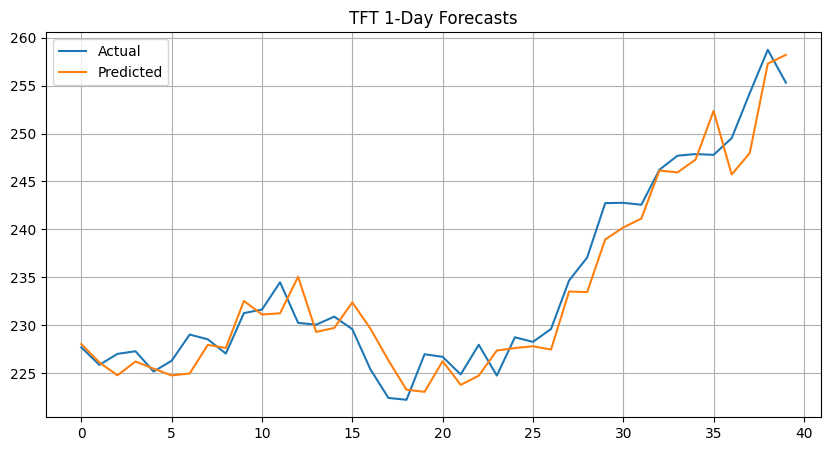

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import NaNLabelEncoder, TorchNormalizer # Import TorchNormalizer
from pytorch_forecasting.metrics import SMAPE, QuantileLoss
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import warnings

warnings.filterwarnings("ignore")

# Load CSV
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]

# Create time_idx and group
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'  # Required for grouping
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

max_encoder_length = 30   # Past 30 days
max_prediction_length = 1 # Forecast next day

training_cutoff = df["time_idx"].max() - max_prediction_length

training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Validation set created from training config
# Calculate how much past context is needed
encoder_plus_decoder = max_encoder_length + max_prediction_length + 100

# Get the validation portion with enough history
df_val = df[df.time_idx > (training_cutoff - encoder_plus_decoder)]
print("Validation time_idx range:", df_val["time_idx"].min(), "to", df_val["time_idx"].max())

# Now build the validation set
validation = TimeSeriesDataSet.from_dataset(
    training,
    df_val,
    stop_randomization=True
)

batch_size = 64

train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)

tft.to('cuda')

# Lightning wrapper

class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        # Eğitim adımını gerçekleştir
        x, y = batch
        # `model` içindeki `loss` hesaplamasını doğru şekilde ayarla
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        # Doğrulama adımını gerçekleştir
        x, y = batch
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        # Adam optimizasyon algoritmasını kullanarak optimizer ayarla
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)
        return optimizer

tft_module = TFTLightningModule(tft)
# https://github.com/egemenozen1/pytorch-forecasting-tft/blob/master/notebooks/analysis.ipynb

early_stop = EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[early_stop],
    limit_train_batches=30,  # Faster for testing
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(
    tft_module,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader
)

# Predict on validation
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)]).cpu() # Move to CPU
predictions = tft.predict(val_dataloader).cpu() # Move to CPU

# Plot a few samples
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(actuals[:100], label='Actual')
plt.plot(predictions[:100], label='Predicted')
plt.title("TFT 1-Day Forecasts")
plt.legend()
plt.grid()
plt.show()

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Validation time_idx range: 6076 to 6207


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.009


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.008


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.008


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 5 records. Best score: 0.008. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


RMSE: 2.4482
MAE: 1.9146
R²: 0.9388
MAPE: 0.82%


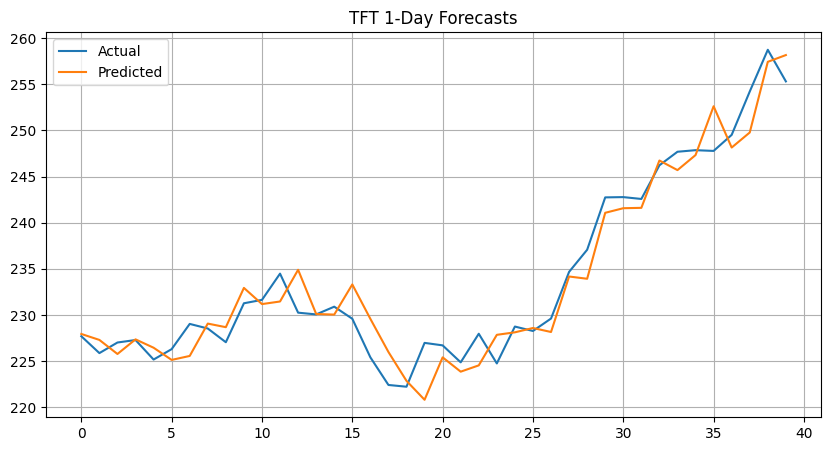

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import NaNLabelEncoder, TorchNormalizer # Import TorchNormalizer
from pytorch_forecasting.metrics import SMAPE, QuantileLoss
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import warnings

warnings.filterwarnings("ignore")

# Load CSV
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]

# Create time_idx and group
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'  # Required for grouping
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

max_encoder_length = 30   # Past 30 days
max_prediction_length = 1 # Forecast next day

training_cutoff = df["time_idx"].max() - max_prediction_length

training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Validation set created from training config
# Calculate how much past context is needed
encoder_plus_decoder = max_encoder_length + max_prediction_length + 100

# Get the validation portion with enough history
df_val = df[df.time_idx > (training_cutoff - encoder_plus_decoder)]
print("Validation time_idx range:", df_val["time_idx"].min(), "to", df_val["time_idx"].max())

# Now build the validation set
validation = TimeSeriesDataSet.from_dataset(
    training,
    df_val,
    stop_randomization=True
)

batch_size = 64

train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)

tft.to('cuda')

# Lightning wrapper

class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        # Eğitim adımını gerçekleştir
        x, y = batch
        # `model` içindeki `loss` hesaplamasını doğru şekilde ayarla
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        # Doğrulama adımını gerçekleştir
        x, y = batch
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        # Adam optimizasyon algoritmasını kullanarak optimizer ayarla
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)
        return optimizer

tft_module = TFTLightningModule(tft)
# https://github.com/egemenozen1/pytorch-forecasting-tft/blob/master/notebooks/analysis.ipynb

early_stop = EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[early_stop],
    limit_train_batches=30,  # Faster for testing
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(
    tft_module,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader
)

# Predict on validation
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)]).cpu() # Move to CPU
predictions = tft.predict(val_dataloader).cpu() # Move to CPU

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Convert tensors to numpy arrays
y_true = actuals.numpy().flatten()
y_pred = predictions.numpy().flatten()

# Compute metrics
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Print results
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")
print(f"MAPE: {mape:.2f}%")


# Plot a few samples
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(actuals[:100], label='Actual')
plt.plot(predictions[:100], label='Predicted')
plt.title("TFT 1-Day Forecasts")
plt.legend()
plt.grid()
plt.show()

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Validation time_idx range: 5976 to 6207


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.028


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.027


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.015


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.014


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.013


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.013


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.010


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 5 records. Best score: 0.010. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


RMSE: 3.5562
MAE: 2.6903
R²: 0.8898
MAPE: 1.19%


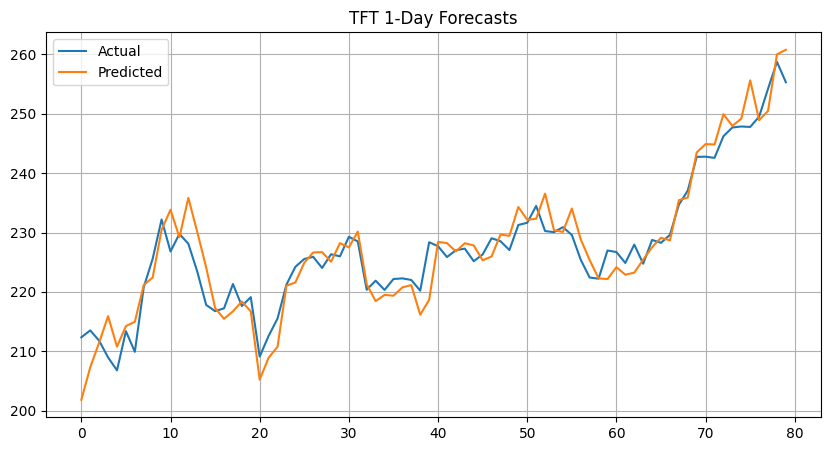

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import NaNLabelEncoder, TorchNormalizer # Import TorchNormalizer
from pytorch_forecasting.metrics import SMAPE, QuantileLoss
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import warnings

warnings.filterwarnings("ignore")

# Load CSV
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]

# Create time_idx and group
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'  # Required for grouping
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

max_encoder_length = 30   # Past 30 days
max_prediction_length = 1 # Forecast next day

training_cutoff = df["time_idx"].max() - max_prediction_length

training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Validation set created from training config
# Calculate how much past context is needed
encoder_plus_decoder = max_encoder_length + max_prediction_length +200

# Get the validation portion with enough history
df_val = df[df.time_idx > (training_cutoff - encoder_plus_decoder)]
print("Validation time_idx range:", df_val["time_idx"].min(), "to", df_val["time_idx"].max())

# Now build the validation set
validation = TimeSeriesDataSet.from_dataset(
    training,
    df_val,
    stop_randomization=True
)

batch_size = 64

train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)

tft.to('cuda')

# Lightning wrapper

class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        # Eğitim adımını gerçekleştir
        x, y = batch
        # `model` içindeki `loss` hesaplamasını doğru şekilde ayarla
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        # Doğrulama adımını gerçekleştir
        x, y = batch
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        # Adam optimizasyon algoritmasını kullanarak optimizer ayarla
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)
        return optimizer

tft_module = TFTLightningModule(tft)
# https://github.com/egemenozen1/pytorch-forecasting-tft/blob/master/notebooks/analysis.ipynb

early_stop = EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[early_stop],
    limit_train_batches=30,  # Faster for testing
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(
    tft_module,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader
)

# Predict on validation
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)]).cpu() # Move to CPU
predictions = tft.predict(val_dataloader).cpu() # Move to CPU

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Convert tensors to numpy arrays
y_true = actuals.numpy().flatten()
y_pred = predictions.numpy().flatten()

# Compute metrics
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Print results
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")
print(f"MAPE: {mape:.2f}%")


# Plot a few samples
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(actuals[:300], label='Actual')
plt.plot(predictions[:300], label='Predicted')
plt.title("TFT 1-Day Forecasts")
plt.legend()
plt.grid()
plt.show()

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Validation time_idx range: 5956 to 6207


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.013


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.013


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.012


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.010


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


RMSE: 3.3244
MAE: 2.4424
R²: 0.9474
MAPE: 1.10%


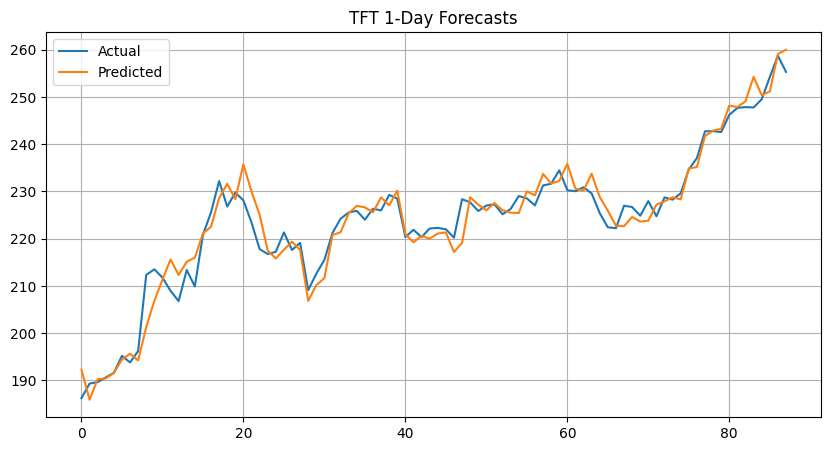

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import NaNLabelEncoder, TorchNormalizer # Import TorchNormalizer
from pytorch_forecasting.metrics import SMAPE, QuantileLoss
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import warnings

warnings.filterwarnings("ignore")

# Load CSV
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]

# Create time_idx and group
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'  # Required for grouping
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

max_encoder_length = 30   # Past 30 days
max_prediction_length = 1 # Forecast next day

training_cutoff = df["time_idx"].max() - 252

training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Validation set created from training config
# Calculate how much past context is needed
encoder_plus_decoder = max_encoder_length + max_prediction_length +200

# Get the validation portion with enough history
df_val = df[df.time_idx > df["time_idx"].max() - 252]
print("Validation time_idx range:", df_val["time_idx"].min(), "to", df_val["time_idx"].max())

# Now build the validation set
validation = TimeSeriesDataSet.from_dataset(
    training,
    df_val,
    stop_randomization=True
)

batch_size = 64

train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)

tft.to('cuda')

# Lightning wrapper

class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        # Eğitim adımını gerçekleştir
        x, y = batch
        # `model` içindeki `loss` hesaplamasını doğru şekilde ayarla
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        # Doğrulama adımını gerçekleştir
        x, y = batch
        out = self.model(x)
        y_pred = out[0]  # Modelin çıktısı tuple, `y_pred` ilk elemandır
        loss = self.model.loss(y_pred, y)
        # `batch_size` parametresini ekleyerek kaydedin
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        # Adam optimizasyon algoritmasını kullanarak optimizer ayarla
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)
        return optimizer

tft_module = TFTLightningModule(tft)
# https://github.com/egemenozen1/pytorch-forecasting-tft/blob/master/notebooks/analysis.ipynb

early_stop = EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[early_stop],
    limit_train_batches=30,  # Faster for testing
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(
    tft_module,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader
)

# Predict on validation
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)]).cpu() # Move to CPU
predictions = tft.predict(val_dataloader).cpu() # Move to CPU

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Convert tensors to numpy arrays
y_true = actuals.numpy().flatten()
y_pred = predictions.numpy().flatten()

# Compute metrics
rmse = np.sqrt(mean_squared_error(y_true, y_pred))
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Print results
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")
print(f"MAPE: {mape:.2f}%")


# Plot a few samples
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
plt.plot(actuals[:300], label='Actual')
plt.plot(predictions[:300], label='Predicted')
plt.title("TFT 1-Day Forecasts")
plt.legend()
plt.grid()
plt.show()

In [ ]:
actuals.shape

torch.Size([88, 1])

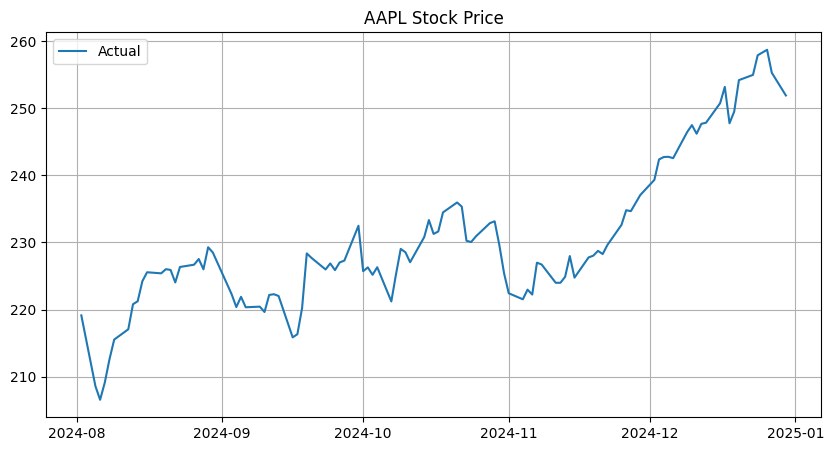

In [ ]:
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2024-08-01') & (df['Date'] < '2024-12-31')]
df = df.set_index(['Date'])
plt.figure(figsize=(10,5))
plt.plot(df['Close'], label='Actual')
plt.title("AAPL Stock Price")
plt.legend()
plt.grid()
plt.show()

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.013


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.012


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 5 records. Best score: 0.011. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 0: pred=168.36, actual=166.12
Offset 1: pred=167.01, actual=168.23


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 2: pred=173.98, actual=169.09
Offset 3: pred=168.24, actual=168.50


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 4: pred=168.24, actual=168.50
Offset 5: pred=168.24, actual=168.50


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 6: pred=168.24, actual=172.68


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 7: pred=168.24, actual=169.53


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 8: pred=166.84, actual=168.50


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 9: pred=166.01, actual=172.22


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 10: pred=165.58, actual=182.52


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 11: pred=165.58, actual=182.52


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 12: pred=165.58, actual=182.52


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 13: pred=165.58, actual=180.86


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 14: pred=165.58, actual=181.54


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 15: pred=167.90, actual=181.88


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 16: pred=168.76, actual=183.70
Offset 17: pred=169.54, actual=182.44


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 18: pred=169.54, actual=182.44
Offset 19: pred=169.54, actual=182.44


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 20: pred=169.54, actual=185.66
Offset 21: pred=168.41, actual=186.80


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 22: pred=171.91, actual=189.08
Offset 23: pred=182.11, actual=189.20


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 24: pred=182.11, actual=189.23
Offset 25: pred=182.11, actual=189.23


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 26: pred=182.11, actual=189.23
Offset 27: pred=182.11, actual=190.40


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 28: pred=182.10, actual=191.71
Offset 29: pred=184.24, actual=190.26


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 30: pred=186.97, actual=186.25
Offset 31: pred=186.97, actual=189.34


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 32: pred=186.97, actual=189.34
Offset 33: pred=186.97, actual=189.34


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 34: pred=186.97, actual=189.34
Offset 35: pred=186.97, actual=189.35


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 36: pred=189.89, actual=189.65
Offset 37: pred=189.46, actual=190.65


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 38: pred=191.60, actual=191.61
Offset 39: pred=191.60, actual=191.61


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 40: pred=191.60, actual=191.61
Offset 41: pred=191.60, actual=193.38


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 42: pred=191.60, actual=193.70
Offset 43: pred=190.82, actual=195.21


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 44: pred=187.16, actual=193.83
Offset 45: pred=189.37, actual=196.23


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 46: pred=189.37, actual=196.23
Offset 47: pred=189.37, actual=196.23


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 48: pred=189.37, actual=192.47
Offset 49: pred=189.37, actual=206.46


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 50: pred=189.65, actual=212.36
Offset 51: pred=190.40, actual=213.52


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 52: pred=193.83, actual=211.78
Offset 53: pred=193.83, actual=211.78


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 54: pred=193.83, actual=211.78
Offset 55: pred=193.83, actual=215.94


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 56: pred=193.83, actual=213.57
Offset 57: pred=193.83, actual=213.57


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 58: pred=195.77, actual=208.98
Offset 59: pred=193.81, actual=206.79


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 60: pred=193.81, actual=206.79
Offset 61: pred=193.81, actual=206.79


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 62: pred=201.25, actual=207.44
Offset 63: pred=201.25, actual=208.37


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 64: pred=201.25, actual=212.54
Offset 65: pred=206.59, actual=213.38


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 66: pred=210.51, actual=209.91
Offset 67: pred=210.51, actual=209.91


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 68: pred=210.51, actual=209.91
Offset 69: pred=213.75, actual=216.02


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 70: pred=213.75, actual=219.53


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 71: pred=213.75, actual=220.81


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 72: pred=213.75, actual=220.81


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 73: pred=213.75, actual=225.58


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 74: pred=213.75, actual=225.58


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 75: pred=213.75, actual=225.58


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 76: pred=208.45, actual=227.06


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 77: pred=212.60, actual=227.91


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 78: pred=212.60, actual=232.20


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 79: pred=212.60, actual=226.81


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 80: pred=213.52, actual=229.77
Offset 81: pred=213.52, actual=229.77


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 82: pred=213.52, actual=229.77
Offset 83: pred=219.77, actual=233.61


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 84: pred=219.77, actual=234.03
Offset 85: pred=219.77, actual=228.11


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 86: pred=221.16, actual=223.43
Offset 87: pred=221.16, actual=223.56


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 88: pred=221.16, actual=223.56
Offset 89: pred=221.16, actual=223.56


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 90: pred=228.59, actual=223.21
Offset 91: pred=228.59, actual=224.26


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 92: pred=228.59, actual=217.81
Offset 93: pred=232.08, actual=216.76


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 94: pred=227.33, actual=217.23
Offset 95: pred=227.33, actual=217.23


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 96: pred=227.33, actual=217.23
Offset 97: pred=234.31, actual=217.51


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 98: pred=234.31, actual=218.07


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 99: pred=234.31, actual=221.34
Offset 100: pred=227.73, actual=217.63


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 101: pred=224.64, actual=219.12


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 102: pred=224.64, actual=219.12
Offset 103: pred=224.64, actual=219.12


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 104: pred=224.64, actual=208.57
Offset 105: pred=224.64, actual=206.54


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 106: pred=216.34, actual=209.12
Offset 107: pred=215.46, actual=212.60


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 108: pred=217.18, actual=215.52
Offset 109: pred=217.18, actual=215.52


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 110: pred=217.18, actual=215.52
Offset 111: pred=217.18, actual=217.05


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 112: pred=217.18, actual=220.78
Offset 113: pred=219.31, actual=221.23


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 114: pred=217.07, actual=224.23
Offset 115: pred=208.77, actual=225.55


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 116: pred=208.77, actual=225.55
Offset 117: pred=208.77, actual=225.55


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 118: pred=208.77, actual=225.39
Offset 119: pred=209.18, actual=226.01


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 120: pred=210.57, actual=225.90
Offset 121: pred=221.16, actual=224.04


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 122: pred=221.16, actual=226.34
Offset 123: pred=221.16, actual=226.34


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 124: pred=221.16, actual=226.34
Offset 125: pred=221.16, actual=226.68


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 126: pred=221.60, actual=227.53
Offset 127: pred=224.36, actual=225.99


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 128: pred=225.97, actual=229.29
Offset 129: pred=225.97, actual=228.50


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 130: pred=225.97, actual=228.50
Offset 131: pred=225.97, actual=228.50


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 132: pred=225.97, actual=228.50


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 133: pred=225.97, actual=222.28


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 134: pred=225.86, actual=220.37


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 135: pred=223.67, actual=221.89


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 136: pred=227.77, actual=220.34


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 137: pred=227.77, actual=220.34


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 138: pred=227.77, actual=220.34


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 139: pred=227.77, actual=220.42


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 140: pred=227.77, actual=219.63


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 141: pred=225.84, actual=222.17
Offset 142: pred=229.18, actual=222.28


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 143: pred=222.25, actual=222.01
Offset 144: pred=222.25, actual=222.01


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 145: pred=222.25, actual=222.01
Offset 146: pred=222.25, actual=215.84


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 147: pred=222.25, actual=216.31
Offset 148: pred=220.20, actual=220.21


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 149: pred=221.71, actual=228.37
Offset 150: pred=219.20, actual=227.70


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 151: pred=219.20, actual=227.70
Offset 152: pred=219.20, actual=227.70


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 153: pred=219.20, actual=225.97
Offset 154: pred=219.20, actual=226.87


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 155: pred=221.09, actual=225.87
Offset 156: pred=221.36, actual=227.02


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 157: pred=216.91, actual=227.29
Offset 158: pred=216.91, actual=227.29


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 159: pred=216.91, actual=227.29
Offset 160: pred=216.91, actual=232.49


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 161: pred=216.91, actual=225.71
Offset 162: pred=218.91, actual=226.28


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 163: pred=228.03, actual=225.17
Offset 164: pred=226.84, actual=226.30


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 165: pred=226.84, actual=226.30
Offset 166: pred=226.84, actual=226.30


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 167: pred=226.84, actual=221.20
Offset 168: pred=226.84, actual=225.27


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 169: pred=226.42, actual=229.04
Offset 170: pred=226.87, actual=228.54


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 171: pred=226.43, actual=227.05
Offset 172: pred=226.43, actual=227.05


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 173: pred=226.43, actual=227.05
Offset 174: pred=226.43, actual=230.79


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 175: pred=226.43, actual=233.34
Offset 176: pred=225.16, actual=231.27


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 177: pred=225.70, actual=231.64
Offset 178: pred=225.70, actual=234.48


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 179: pred=225.70, actual=234.48


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 180: pred=225.70, actual=234.48
Offset 181: pred=225.70, actual=235.96


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 182: pred=228.87, actual=235.34
Offset 183: pred=228.37, actual=230.25


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 184: pred=234.16, actual=230.06
Offset 185: pred=234.16, actual=230.90


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 186: pred=234.16, actual=230.90
Offset 187: pred=234.16, actual=230.90


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 188: pred=234.16, actual=232.89
Offset 189: pred=231.26, actual=233.16


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 190: pred=231.73, actual=229.59
Offset 191: pred=235.86, actual=225.41


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 192: pred=235.86, actual=222.42
Offset 193: pred=235.86, actual=222.42


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 194: pred=235.86, actual=222.42
Offset 195: pred=235.86, actual=221.52


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 196: pred=229.57, actual=222.96


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 197: pred=230.16, actual=222.23


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 198: pred=233.00, actual=226.98


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 199: pred=233.00, actual=226.71


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 200: pred=233.00, actual=226.71


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 201: pred=233.00, actual=226.71


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 202: pred=233.00, actual=223.98


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 203: pred=229.47, actual=223.98


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 204: pred=225.32, actual=224.87


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 205: pred=221.94, actual=227.97


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 206: pred=221.94, actual=224.75
Offset 207: pred=221.94, actual=224.75


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 208: pred=221.94, actual=224.75
Offset 209: pred=221.94, actual=227.77


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 210: pred=221.84, actual=228.03
Offset 211: pred=224.85, actual=228.75


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 212: pred=223.33, actual=228.27
Offset 213: pred=223.33, actual=229.62


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 214: pred=223.33, actual=229.62
Offset 215: pred=223.33, actual=229.62


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 216: pred=223.33, actual=232.61
Offset 217: pred=223.69, actual=234.80


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 218: pred=227.65, actual=234.67
Offset 219: pred=227.65, actual=234.67


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 220: pred=228.20, actual=237.07
Offset 221: pred=228.20, actual=237.07


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 222: pred=228.20, actual=237.07
Offset 223: pred=228.20, actual=239.33


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 224: pred=228.20, actual=242.38
Offset 225: pred=229.00, actual=242.74


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 226: pred=228.43, actual=242.77
Offset 227: pred=235.10, actual=242.57


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 228: pred=235.10, actual=242.57
Offset 229: pred=235.10, actual=242.57


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 230: pred=235.10, actual=246.48
Offset 231: pred=235.10, actual=247.50


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 232: pred=235.47, actual=246.22
Offset 233: pred=235.47, actual=247.69


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 234: pred=242.12, actual=247.86
Offset 235: pred=242.12, actual=247.86


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 236: pred=242.12, actual=247.86
Offset 237: pred=242.12, actual=250.76


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 238: pred=242.12, actual=253.20
Offset 239: pred=243.49, actual=247.78


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 240: pred=243.75, actual=249.52
Offset 241: pred=248.50, actual=254.21


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 242: pred=248.50, actual=254.21
Offset 243: pred=248.50, actual=254.21


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 244: pred=248.50, actual=254.99
Offset 245: pred=248.50, actual=257.92


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 246: pred=248.50, actual=257.92
Offset 247: pred=246.17, actual=258.74


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 248: pred=247.90, actual=255.31
Offset 249: pred=247.90, actual=255.31


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Offset 250: pred=247.90, actual=255.31
Offset 251: pred=254.31, actual=251.92
RMSE: 9.4098
MAE: 7.6959
R²: 0.7816


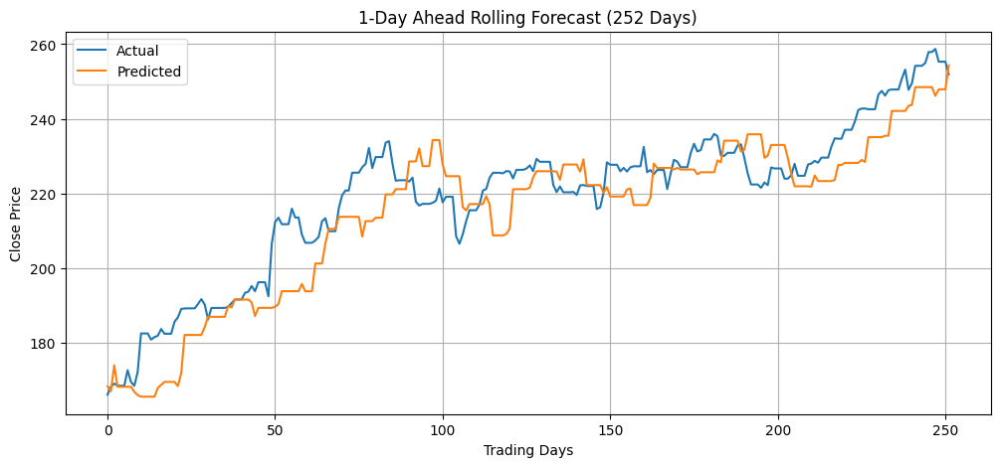

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import logging
# Suppress overly verbose CUDA device logging from PyTorch Lightning
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data ===
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = df["time_idx"].max() - 252  # leave last 252 days for rolling forecast

# === Create training dataset ===
training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Add this just before training the model
val_df = df[(df.time_idx > (training_cutoff - max_encoder_length)) & (df.time_idx <= df.time_idx.max())]

validation = TimeSeriesDataSet.from_dataset(
    training,
    val_df,
    stop_randomization=True
)

# === Dataloaders ===
train_dataloader = training.to_dataloader(train=True, batch_size=64, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)
# === Model ===
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)
tft.to("cuda")

# === LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train model ===
tft_module = TFTLightningModule(tft)
trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)
trainer.fit(tft_module, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

# === Rolling 1-day ahead forecast for 252 days ===
forecast_days = 252
rolling_predictions = []
rolling_actuals = []

for offset in range(forecast_days):
    encoder_end = training_cutoff + offset
    # Get the exact 31 most recent rows ending at decoder_end
    decoder_end_time = training_cutoff + offset + max_prediction_length
    data_slice = df[df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    # Ensure we actually got the full context + prediction window
    if len(data_slice) < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(training, data_slice, stop_randomization=True)
    predict_dataloader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_dataloader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]  # last row is the decoder target

    rolling_predictions.append(prediction)
    rolling_actuals.append(actual)

# === Evaluate ===
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = np.sqrt(mean_squared_error(rolling_actuals, rolling_predictions))
mae = mean_absolute_error(rolling_actuals, rolling_predictions)
r2 = r2_score(rolling_actuals, rolling_predictions)

print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")

# === Plot ===
plt.figure(figsize=(12, 5))
plt.plot(rolling_actuals, label="Actual")
plt.plot(rolling_predictions, label="Predicted")
plt.title("1-Day Ahead Rolling Forecast (252 Days)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


In [ ]:
predict_dataset

NameError: name 'predict_dataset' is not defined

In [ ]:
rolling_predictions

[np.float32(254.57133)]

In [ ]:
rolling_actuals

[np.float64(251.9230194091797)]

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.014


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.014


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.012


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 5 records. Best score: 0.011. Signaling Trainer to stop.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:li

RMSE: 120065412.3597
MAE: 96747465.6701
R²: 0.7917


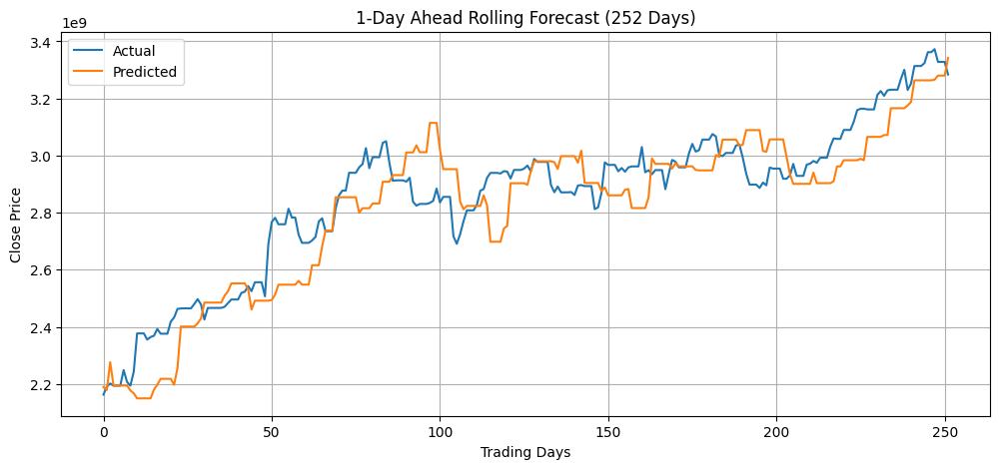

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import MinMaxScaler


# === Load and preprocess data ===
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

# === Apply MinMaxScaler ===
scaler = MinMaxScaler()
df["Close_scaled"] = scaler.fit_transform(df[["Close"]])
df["Volume"] = scaler.fit_transform(df[["Volume"]])

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = df["time_idx"].max() - 252  # leave last 252 days for rolling forecast

# === Create training dataset ===
training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close_scaled",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close_scaled", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Add this just before training the model
val_df = df[(df.time_idx > (training_cutoff - max_encoder_length)) & (df.time_idx <= df.time_idx.max())]

validation = TimeSeriesDataSet.from_dataset(
    training,
    val_df,
    stop_randomization=True
)

# === Dataloaders ===
train_dataloader = training.to_dataloader(train=True, batch_size=64, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)
# === Model ===
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)
tft.to("cuda")

# === LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train model ===
tft_module = TFTLightningModule(tft)
trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)
trainer.fit(tft_module, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

# === Rolling 1-day ahead forecast for 252 days ===
forecast_days = 252
rolling_predictions = []
rolling_actuals = []

for offset in range(forecast_days):
    encoder_end = training_cutoff + offset
    # Get the exact 31 most recent rows ending at decoder_end
    decoder_end_time = training_cutoff + offset + max_prediction_length
    data_slice = df[df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    # Ensure we actually got the full context + prediction window
    if len(data_slice) < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(training, data_slice, stop_randomization=True)
    predict_dataloader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_dataloader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close_scaled"]  # last row is the decoder target

    rolling_predictions.append(prediction)
    rolling_actuals.append(actual)


# Convert to numpy arrays and reshape for inverse_transform
rolling_predictions = scaler.inverse_transform(np.array(rolling_predictions).reshape(-1, 1)).flatten()
rolling_actuals = scaler.inverse_transform(np.array(rolling_actuals).reshape(-1, 1)).flatten()

# === Evaluate ===
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = np.sqrt(mean_squared_error(rolling_actuals, rolling_predictions))
mae = mean_absolute_error(rolling_actuals, rolling_predictions)
r2 = r2_score(rolling_actuals, rolling_predictions)

print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")

# === Plot ===
plt.figure(figsize=(12, 5))
plt.plot(rolling_actuals, label="Actual")
plt.plot(rolling_predictions, label="Predicted")
plt.title("1-Day Ahead Rolling Forecast (252 Days)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


# Scaling worsens performance (slightly). can be justified as tft normalises by itself.

Higher LR: worse.

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.021


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.017


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.013


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.012


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 5 records. Best score: 0.011. Signaling Trainer to stop.


RMSE: 9.5268
MAE: 7.7495
R²: 0.7762


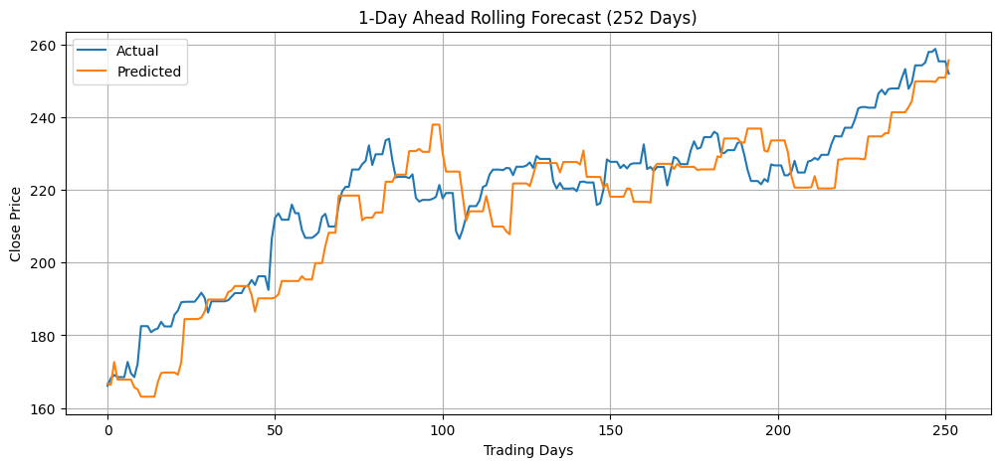

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import logging
# Suppress overly verbose CUDA device logging from PyTorch Lightning
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data ===
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = df["time_idx"].max() - 252  # leave last 252 days for rolling forecast

# === Create training dataset ===
training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Add this just before training the model
val_df = df[(df.time_idx > (training_cutoff - max_encoder_length)) & (df.time_idx <= df.time_idx.max())]

validation = TimeSeriesDataSet.from_dataset(
    training,
    val_df,
    stop_randomization=True
)

# === Dataloaders ===
train_dataloader = training.to_dataloader(train=True, batch_size=64, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)
# === Model ===
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.03,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)
tft.to("cuda")

# === LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train model ===
tft_module = TFTLightningModule(tft)
trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)
trainer.fit(tft_module, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

# === Rolling 1-day ahead forecast for 252 days ===
forecast_days = 252
rolling_predictions = []
rolling_actuals = []

for offset in range(forecast_days):
    encoder_end = training_cutoff + offset
    # Get the exact 31 most recent rows ending at decoder_end
    decoder_end_time = training_cutoff + offset + max_prediction_length
    data_slice = df[df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    # Ensure we actually got the full context + prediction window
    if len(data_slice) < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(training, data_slice, stop_randomization=True)
    predict_dataloader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_dataloader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]  # last row is the decoder target

    rolling_predictions.append(prediction)
    rolling_actuals.append(actual)

# === Evaluate ===
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = np.sqrt(mean_squared_error(rolling_actuals, rolling_predictions))
mae = mean_absolute_error(rolling_actuals, rolling_predictions)
r2 = r2_score(rolling_actuals, rolling_predictions)

print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")

# === Plot ===
plt.figure(figsize=(12, 5))
plt.plot(rolling_actuals, label="Actual")
plt.plot(rolling_predictions, label="Predicted")
plt.title("1-Day Ahead Rolling Forecast (252 Days)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


retraining:

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.019


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.015


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.012


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.011


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.
INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



🔁 Retraining for Quarter 1


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs



🔁 Retraining for Quarter 2


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



🔁 Retraining for Quarter 3


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



🔁 Retraining for Quarter 4


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

RMSE: 9.4766
MAE: 7.7537
R²: 0.7785


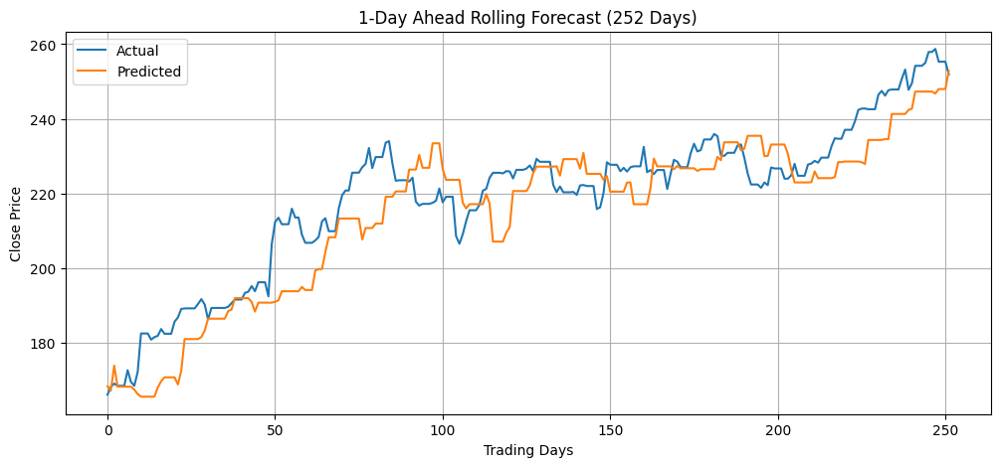

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import logging
# Suppress overly verbose CUDA device logging from PyTorch Lightning
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data ===
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['group'] = 'AAPL'
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume']].dropna()

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = df["time_idx"].max() - 252  # leave last 252 days for rolling forecast

# === Create training dataset ===
training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Add this just before training the model
val_df = df[(df.time_idx > (training_cutoff - max_encoder_length)) & (df.time_idx <= df.time_idx.max())]

validation = TimeSeriesDataSet.from_dataset(
    training,
    val_df,
    stop_randomization=True
)

# === Dataloaders ===
train_dataloader = training.to_dataloader(train=True, batch_size=64, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)
# === Model ===
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.03,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)
tft.to("cuda")

# === LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train model ===
tft_module = TFTLightningModule(tft)
trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)
trainer.fit(tft_module, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

quarter_length = 63  # approx. 1 quarter (63 trading days)
num_quarters = 252 // quarter_length  # 4 quarters in a year
max_prediction_length = 1  # Still predicting 1 day ahead

rolling_predictions = []
rolling_actuals = []

for q in range(num_quarters):
    print(f"\n🔁 Retraining for Quarter {q+1}")

    # Step 1: Define new training cutoff for this quarter
    retrain_cutoff = training_cutoff + q * quarter_length

    # Step 2: Prepare training data up to this point
    new_training = TimeSeriesDataSet(
        df[df.time_idx <= retrain_cutoff],
        time_idx="time_idx",
        target="Close",
        group_ids=["group"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        time_varying_known_reals=["time_idx"],
        time_varying_unknown_reals=["Close", "Volume"],
        static_categoricals=["group"],
        allow_missing_timesteps=True
    )

    # Step 3: Dataloader
    # Add this just before training the model
    val_df = df[(df.time_idx > retrain_cutoff) & (df.time_idx <= df.time_idx.max())]

    validation = TimeSeriesDataSet.from_dataset(
        training,
        val_df,
        stop_randomization=True
    )

    # === Dataloaders ===
    train_loader = training.to_dataloader(train=True, batch_size=64, num_workers=0)
    val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

    # Step 4: Create and train a fresh TFT model
    tft = TemporalFusionTransformer.from_dataset(
        new_training,
        learning_rate=0.01,
        hidden_size=128,
        attention_head_size=2,
        dropout=0.1,
        loss=SMAPE(),
        log_interval=10,
        reduce_on_plateau_patience=4,
    )
    tft.to("cuda")

    module = TFTLightningModule(tft)
    trainer = Trainer(
        max_epochs=20,
        gradient_clip_val=0.1,
        callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
        limit_train_batches=30,
        logger=False,  # You can keep it if you want logs
        enable_model_summary=False
    )
    trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_dataloader)

    # Step 5: Predict next 63 days (1-day ahead forecast for each day)
    for offset in range(quarter_length):
        day_offset = q * quarter_length + offset
        decoder_end_time = training_cutoff + day_offset + max_prediction_length
        data_slice = df[df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if len(data_slice) < (max_encoder_length + max_prediction_length):
            continue

        predict_dataset = TimeSeriesDataSet.from_dataset(new_training, data_slice, stop_randomization=True)
        predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

        prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
        actual = data_slice.iloc[-1]["Close"]

        rolling_predictions.append(prediction)
        rolling_actuals.append(actual)

# === Evaluate ===
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = np.sqrt(mean_squared_error(rolling_actuals, rolling_predictions))
mae = mean_absolute_error(rolling_actuals, rolling_predictions)
r2 = r2_score(rolling_actuals, rolling_predictions)

print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")

# === Plot ===
plt.figure(figsize=(12, 5))
plt.plot(rolling_actuals, label="Actual")
plt.plot(rolling_predictions, label="Predicted")
plt.title("1-Day Ahead Rolling Forecast (252 Days)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


# RSI and MACD

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 847 K  | train
------------------------------------------------------------
847 K     Trainable params
0         Non-trainable params
847 K     Total params
3.391     Total estimated model params size (MB)
223       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.019


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.013


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.013


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.012


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.012


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.012


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 5 records. Best score: 0.012. Signaling Trainer to stop.
INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



🔁 Retraining for Quarter 1


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



🔁 Retraining for Quarter 2


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



🔁 Retraining for Quarter 3


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



🔁 Retraining for Quarter 4


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


RMSE: 9.3161
MAE: 7.5892
R²: 0.7860


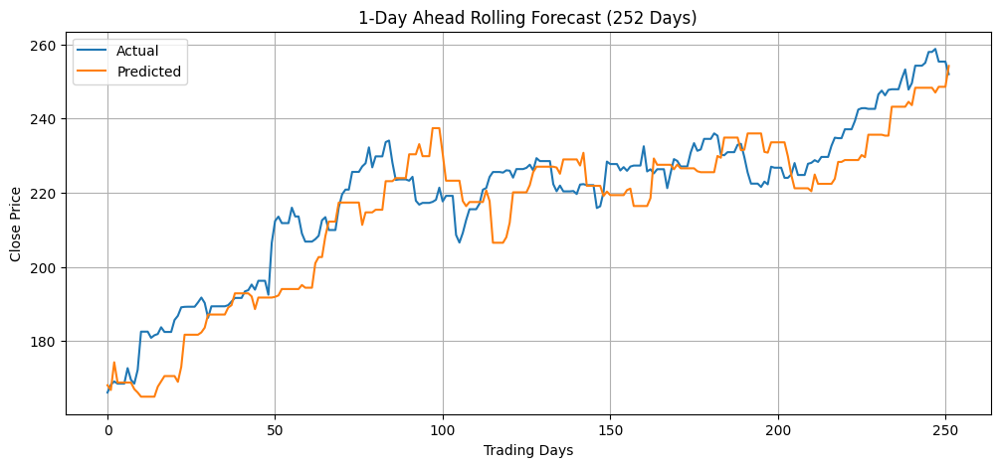

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD
# Suppress overly verbose CUDA device logging from PyTorch Lightning
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data ===
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['RSI'] = RSIIndicator(close=df['Close'], window=14).rsi()
macd = MACD(close=df['Close'])
df['MACD'] = macd.macd()
df['MACD_signal'] = macd.macd_signal()
df['group'] = 'AAPL'
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume', 'RSI', 'MACD']].dropna()

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = df["time_idx"].max() - 252  # leave last 252 days for rolling forecast

# === Create training dataset ===
training = TimeSeriesDataSet(
    df[df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume", "RSI", "MACD"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Add this just before training the model
val_df = df[(df.time_idx > (training_cutoff - max_encoder_length)) & (df.time_idx <= df.time_idx.max())]

validation = TimeSeriesDataSet.from_dataset(
    training,
    val_df,
    stop_randomization=True
)

# === Dataloaders ===
train_dataloader = training.to_dataloader(train=True, batch_size=64, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)
# === Model ===
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.03,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)
tft.to("cuda")

# === LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train model ===
tft_module = TFTLightningModule(tft)
trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, verbose=True, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)
trainer.fit(tft_module, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

quarter_length = 63  # approx. 1 quarter (63 trading days)
num_quarters = 252 // quarter_length  # 4 quarters in a year
max_prediction_length = 1  # Still predicting 1 day ahead

rolling_predictions = []
rolling_actuals = []

for q in range(num_quarters):
    print(f"\n🔁 Retraining for Quarter {q+1}")

    # Step 1: Define new training cutoff for this quarter
    retrain_cutoff = training_cutoff + q * quarter_length

    # Step 2: Prepare training data up to this point
    new_training = TimeSeriesDataSet(
        df[df.time_idx <= retrain_cutoff],
        time_idx="time_idx",
        target="Close",
        group_ids=["group"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        time_varying_known_reals=["time_idx"],
        time_varying_unknown_reals=["Close", "Volume", "RSI", "MACD"],
        static_categoricals=["group"],
        allow_missing_timesteps=True
    )

    # Step 3: Dataloader
    # Add this just before training the model
    val_df = df[(df.time_idx > retrain_cutoff) & (df.time_idx <= df.time_idx.max())]

    validation = TimeSeriesDataSet.from_dataset(
        training,
        val_df,
        stop_randomization=True
    )

    # === Dataloaders ===
    train_loader = training.to_dataloader(train=True, batch_size=64, num_workers=0)
    val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

    # Step 4: Create and train a fresh TFT model
    tft = TemporalFusionTransformer.from_dataset(
        new_training,
        learning_rate=0.01,
        hidden_size=128,
        attention_head_size=2,
        dropout=0.1,
        loss=SMAPE(),
        log_interval=10,
        reduce_on_plateau_patience=4,
    )
    tft.to("cuda")

    module = TFTLightningModule(tft)
    trainer = Trainer(
        max_epochs=20,
        gradient_clip_val=0.1,
        callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
        limit_train_batches=30,
        logger=False,  # You can keep it if you want logs
        enable_model_summary=False
    )
    trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_dataloader)

    # Step 5: Predict next 63 days (1-day ahead forecast for each day)
    for offset in range(quarter_length):
        day_offset = q * quarter_length + offset
        decoder_end_time = training_cutoff + day_offset + max_prediction_length
        data_slice = df[df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if len(data_slice) < (max_encoder_length + max_prediction_length):
            continue

        predict_dataset = TimeSeriesDataSet.from_dataset(new_training, data_slice, stop_randomization=True)
        predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

        prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
        actual = data_slice.iloc[-1]["Close"]

        rolling_predictions.append(prediction)
        rolling_actuals.append(actual)

# === Evaluate ===
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = np.sqrt(mean_squared_error(rolling_actuals, rolling_predictions))
mae = mean_absolute_error(rolling_actuals, rolling_predictions)
r2 = r2_score(rolling_actuals, rolling_predictions)

print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")

# === Plot ===
plt.figure(figsize=(12, 5))
plt.plot(rolling_actuals, label="Actual")
plt.plot(rolling_predictions, label="Predicted")
plt.title("1-Day Ahead Rolling Forecast (252 Days)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


Improves very slightly, maybe as tft can weigh inputs itself its worth just chucking them all in?


🔁 Retraining for Quarter 1


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.
INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



🔁 Retraining for Quarter 2


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


🔁 Retraining for Quarter 3


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



🔁 Retraining for Quarter 4


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

RMSE: 9.4886
MAE: 7.7992
R²: 0.7780


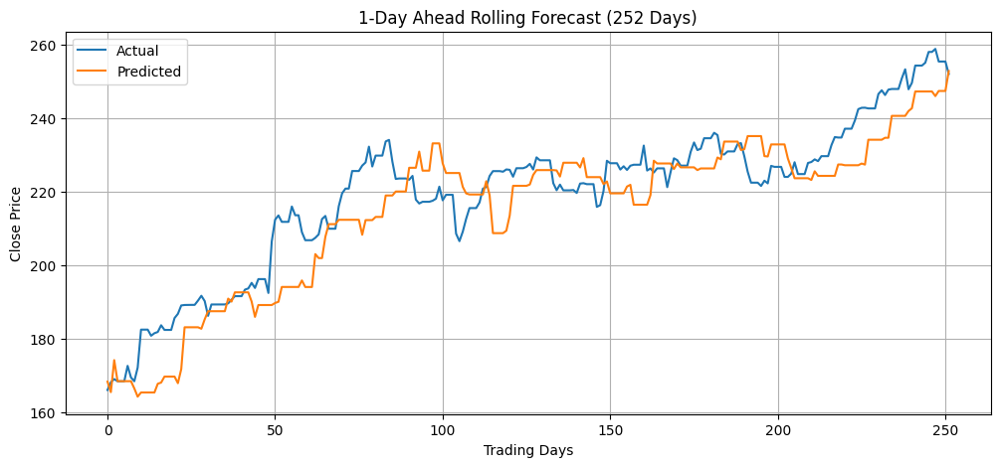

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD
# Suppress overly verbose CUDA device logging from PyTorch Lightning
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data ===
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['RSI'] = RSIIndicator(close=df['Close'], window=14).rsi()
macd = MACD(close=df['Close'])
df['MACD'] = macd.macd()
df['MACD_signal'] = macd.macd_signal()
df['ma_5'] = df['Close'].rolling(window=5).mean()
df['volatility_63'] = df['Close'].rolling(window=63).std()
df['intraday_range'] = df['High'] - df['Low']
df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
df['momentum_126'] = df['Close'] - df['Close'].shift(126)
df['group'] = 'AAPL'
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume', 'RSI', 'MACD', 'ma_5', 'volatility_63', 'intraday_range', 'upper_shadow', 'lower_shadow', 'momentum_126']].dropna()

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = df["time_idx"].max() - 252  # leave last 252 days for rolling forecast


# === LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

quarter_length = 63  # approx. 1 quarter (63 trading days)
num_quarters = 252 // quarter_length  # 4 quarters in a year
max_prediction_length = 1  # Still predicting 1 day ahead

rolling_predictions = []
rolling_actuals = []

for q in range(num_quarters):
    print(f"\n🔁 Retraining for Quarter {q+1}")

    # Step 1: Define new training cutoff for this quarter
    retrain_cutoff = training_cutoff + q * quarter_length

    # Step 2: Prepare training data up to this point
    new_training = TimeSeriesDataSet(
        df[df.time_idx <= retrain_cutoff],
        time_idx="time_idx",
        target="Close",
        group_ids=["group"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        time_varying_known_reals=["time_idx"],
        time_varying_unknown_reals=["Close", "Volume", "RSI", "MACD", 'ma_5', 'volatility_63', 'intraday_range', 'upper_shadow', 'lower_shadow', 'momentum_126'],
        static_categoricals=["group"],
        allow_missing_timesteps=True
    )

    # Step 3: Dataloader
    # Add this just before training the model
    val_df = df[(df.time_idx > retrain_cutoff) & (df.time_idx <= df.time_idx.max())]

    validation = TimeSeriesDataSet.from_dataset(
        new_training,
        val_df,
        stop_randomization=True
    )

    # === Dataloaders ===
    train_loader = new_training.to_dataloader(train=True, batch_size=64, num_workers=0)
    val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

    # Step 4: Create and train a fresh TFT model
    tft = TemporalFusionTransformer.from_dataset(
        new_training,
        learning_rate=0.01,
        hidden_size=128,
        attention_head_size=2,
        dropout=0.1,
        loss=SMAPE(),
        log_interval=10,
        reduce_on_plateau_patience=4,
    )
    tft.to("cuda")

    module = TFTLightningModule(tft)
    trainer = Trainer(
        max_epochs=20,
        gradient_clip_val=0.1,
        callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
        limit_train_batches=30,
        logger=False,  # You can keep it if you want logs
        enable_model_summary=False
    )
    trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_dataloader)

    # Step 5: Predict next 63 days (1-day ahead forecast for each day)
    for offset in range(quarter_length):
        day_offset = q * quarter_length + offset
        decoder_end_time = training_cutoff + day_offset + max_prediction_length
        data_slice = df[df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if len(data_slice) < (max_encoder_length + max_prediction_length):
            continue

        predict_dataset = TimeSeriesDataSet.from_dataset(new_training, data_slice, stop_randomization=True)
        predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

        prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
        actual = data_slice.iloc[-1]["Close"]

        rolling_predictions.append(prediction)
        rolling_actuals.append(actual)

# === Evaluate ===
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = np.sqrt(mean_squared_error(rolling_actuals, rolling_predictions))
mae = mean_absolute_error(rolling_actuals, rolling_predictions)
r2 = r2_score(rolling_actuals, rolling_predictions)

print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")

# === Plot ===
plt.figure(figsize=(12, 5))
plt.plot(rolling_actuals, label="Actual")
plt.plot(rolling_predictions, label="Predicted")
plt.title("1-Day Ahead Rolling Forecast (252 Days)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()

In [ ]:
predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

raw_predictions, x = tft.predict(
    predict_loader,
    mode="raw",
    return_x=True,
    return_interpretation=True
)

encoder_importance = raw_predictions["interpretation"]["encoder_variable_importance"]
print(encoder_importance)

TypeError: TemporalFusionTransformer.forward() got an unexpected keyword argument 'return_interpretation'

NameError: name 'predict' is not defined

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD
# Suppress overly verbose CUDA device logging from PyTorch Lightning
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data ===
df = pd.read_csv("AAPL.csv", skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df = df[(df['Date'] > '2008-01-01') & (df['Date'] < '2024-12-31')]
df['time_idx'] = (df['Date'] - df['Date'].min()).dt.days
df['RSI'] = RSIIndicator(close=df['Close'], window=14).rsi()
macd = MACD(close=df['Close'])
df['MACD'] = macd.macd()
df['MACD_signal'] = macd.macd_signal()
df['ma_5'] = df['Close'].rolling(window=5).mean()
df['volatility_63'] = df['Close'].rolling(window=63).std()
df['intraday_range'] = df['High'] - df['Low']
df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
df['momentum_126'] = df['Close'] - df['Close'].shift(126)
df['group'] = 'AAPL'
df = df[['Date', 'time_idx', 'group', 'Close', 'Volume', 'RSI', 'MACD', 'ma_5', 'volatility_63', 'intraday_range', 'upper_shadow', 'lower_shadow', 'momentum_126']].dropna()

# === Define dataset parameters ===
max_encoder_length = 20
max_prediction_length = 1
training_cutoff = df["time_idx"].max() - 252  # leave last 252 days for rolling forecast


# === LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss


    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

quarter_length = 63  # approx. 1 quarter (63 trading days)
num_quarters = 252 // quarter_length  # 4 quarters in a year
max_prediction_length = 1  # Still predicting 1 day ahead

rolling_predictions = []
rolling_actuals = []

for q in range(num_quarters):
    print(f"\n🔁 Retraining for Quarter {q+1}")

    # Step 1: Define new training cutoff for this quarter
    retrain_cutoff = training_cutoff + q * quarter_length

    # Step 2: Prepare training data up to this point
    new_training = TimeSeriesDataSet(
        df[df.time_idx <= retrain_cutoff],
        time_idx="time_idx",
        target="Close",
        group_ids=["group"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        time_varying_known_reals=["time_idx"],
        time_varying_unknown_reals=["Close", "Volume", "RSI", "MACD", 'ma_5', 'volatility_63', 'intraday_range', 'upper_shadow', 'lower_shadow', 'momentum_126'],
        static_categoricals=["group"],
        allow_missing_timesteps=True
    )

    # Step 3: Dataloader
    # Add this just before training the model
    val_df = df[(df.time_idx > retrain_cutoff) & (df.time_idx <= df.time_idx.max())]

    validation = TimeSeriesDataSet.from_dataset(
        new_training,
        val_df,
        stop_randomization=True
    )

    # === Dataloaders ===
    train_loader = new_training.to_dataloader(train=True, batch_size=64, num_workers=0)
    val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

    # Step 4: Create and train a fresh TFT model
    tft = TemporalFusionTransformer.from_dataset(
        new_training,
        learning_rate=0.01,
        hidden_size=128,
        attention_head_size=2,
        dropout=0.1,
        loss=SMAPE(),
        log_interval=10,
        reduce_on_plateau_patience=4,
    )
    tft_model = tft  # keep reference to the raw model

    tft.to("cuda")

    module = TFTLightningModule(tft)
    trainer = Trainer(
        max_epochs=20,
        gradient_clip_val=0.1,
        callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
        limit_train_batches=30,
        logger=False,  # You can keep it if you want logs
        enable_model_summary=False
    )
    trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_dataloader)

    # Step 5: Predict next 63 days (1-day ahead forecast for each day)
    for offset in range(quarter_length):
        day_offset = q * quarter_length + offset
        decoder_end_time = training_cutoff + day_offset + max_prediction_length
        data_slice = df[df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if len(data_slice) < (max_encoder_length + max_prediction_length):
            continue

        predict_dataset = TimeSeriesDataSet.from_dataset(new_training, data_slice, stop_randomization=True)
        predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

        prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
        actual = data_slice.iloc[-1]["Close"]

        rolling_predictions.append(prediction)
        rolling_actuals.append(actual)

# Create a dataset and dataloader for the last data slice specifically for interpretation
last_data_slice = df.tail(max_encoder_length + max_prediction_length)
interpret_dataset = TimeSeriesDataSet.from_dataset(new_training, last_data_slice, stop_randomization=True)
interpret_loader = interpret_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

# Get raw predictions and input data for interpretation
raw_predictions, x = next(iter(interpret_loader))
raw_predictions = tft_model(x)


# Calculate interpretation after prediction
interpretation = tft_model.interpret_output((raw_predictions,), x)
encoder_importance = interpretation["encoder_variable_importance"]
print(encoder_importance)


# === Evaluate ===
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

rmse = np.sqrt(mean_squared_error(rolling_actuals, rolling_predictions))
mae = mean_absolute_error(rolling_actuals, rolling_predictions)
r2 = r2_score(rolling_actuals, rolling_predictions)

print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")
print(f"R²: {r2:.4f}")

# === Plot ===
plt.figure(figsize=(12, 5))
plt.plot(rolling_actuals, label="Actual")
plt.plot(rolling_predictions, label="Predicted")
plt.title("1-Day Ahead Rolling Forecast (252 Days)")
plt.xlabel("Trading Days")
plt.ylabel("Close Price")
plt.legend()
plt.grid()
plt.show()


🔁 Retraining for Quarter 1


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


🔁 Retraining for Quarter 2


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


🔁 Retraining for Quarter 3


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


🔁 Retraining for Quarter 4


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

TypeError: tuple indices must be integers or slices, not str

In [ ]:
raw_predictions

Prediction(output=Output(prediction=tensor([[[252.7285]],

        [[246.9180]],

        [[249.2449]],

        [[257.5410]],

        [[258.1214]]], device='cuda:0'), encoder_attention=tensor([[[[0.0788, 0.0722, 0.0654, 0.0596, 0.0567, 0.0563, 0.0562, 0.0588,
           0.0575, 0.0609, 0.0603, 0.0479, 0.0479, 0.0479, 0.0389, 0.0159,
           0.0155, 0.0151, 0.0155, 0.0155, 0.0155, 0.0065, 0.0054, 0.0066,
           0.0051, 0.0049, 0.0049, 0.0049, 0.0020, 0.0013],
          [0.0782, 0.0746, 0.0702, 0.0666, 0.0642, 0.0638, 0.0637, 0.0637,
           0.0404, 0.0436, 0.0430, 0.0285, 0.0285, 0.0285, 0.0264, 0.0212,
           0.0209, 0.0207, 0.0210, 0.0210, 0.0209, 0.0125, 0.0111, 0.0126,
           0.0106, 0.0104, 0.0104, 0.0104, 0.0067, 0.0058]]],


        [[[0.0772, 0.0714, 0.0627, 0.0585, 0.0570, 0.0565, 0.0539, 0.0707,
           0.0737, 0.0736, 0.0487, 0.0486, 0.0486, 0.0413, 0.0181, 0.0177,
           0.0171, 0.0177, 0.0177, 0.0177, 0.0071, 0.0061, 0.0072, 0.0057,
           0.0

# All 4 stocks


 Retraining for Quarter 1


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 Retraining for Quarter 2


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 Retraining for Quarter 3


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


 Retraining for Quarter 4


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 SPY Evaluation:
  RMSE: 4.4954
  MAE : 3.4218
  R²  : 0.9862


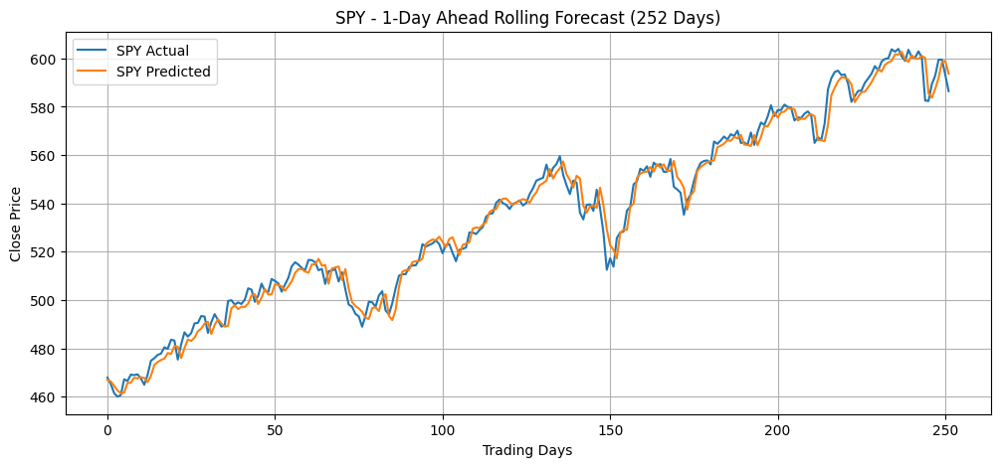

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import logging
# Suppress overly verbose CUDA device logging from PyTorch Lightning
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

combined_df = pd.concat([aapl, jpm, nvda, spy])

# Keep dates in common
min_date = combined_df['Date'].max()  # take latest start date among all
max_date = combined_df['Date'].min()  # take earliest end date among all

combined_df = combined_df[(combined_df['Date'] >= '2008-01-01') & (combined_df['Date'] < '2024-12-31')]

# Add group-specific time_idx
combined_df = combined_df.sort_values(['group', 'Date'])
combined_df['time_idx'] = combined_df.groupby('group').cumcount()

# Add technical indicators
from ta.momentum import RSIIndicator
from ta.trend import MACD

def add_features(df):
    df['RSI'] = RSIIndicator(close=df['Close'], window=14).rsi()
    macd = MACD(close=df['Close'])
    df['MACD'] = macd.macd()
    df['MACD_signal'] = macd.macd_signal()
    df['ma_5'] = df['Close'].rolling(window=5).mean()
    df['volatility_63'] = df['Close'].rolling(window=63).std()
    df['intraday_range'] = df['High'] - df['Low']
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    df['momentum_126'] = df['Close'] - df['Close'].shift(126)
    return df

combined_df = combined_df.groupby('group').apply(add_features).reset_index(drop=True)
combined_df = combined_df.dropna()

max_encoder_length = 30
max_prediction_length = 1

training_cutoff = combined_df["time_idx"].max() - 252

# === LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

quarter_length = 63  # approx. 1 quarter (63 trading days)
num_quarters = 252 // quarter_length  # 4 quarters in a year
max_prediction_length = 1  # Still predicting 1 day ahead

from collections import defaultdict
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

df = combined_df.copy()
for q in range(num_quarters):
    print(f"\n Retraining for Quarter {q+1}")

    retrain_cutoff = training_cutoff + q * quarter_length

    new_training = TimeSeriesDataSet(
        df[df.time_idx <= retrain_cutoff],
        time_idx="time_idx",
        target="Close",
        group_ids=["group"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        time_varying_known_reals=["time_idx"],
        time_varying_unknown_reals=["Close", "Volume", "RSI", "MACD", 'ma_5', 'volatility_63', 'intraday_range', 'upper_shadow', 'lower_shadow', 'momentum_126'],
        static_categoricals=["group"],
        allow_missing_timesteps=True
    )

    val_df = df[(df.time_idx > retrain_cutoff) & (df.time_idx <= df.time_idx.max())]
    validation = TimeSeriesDataSet.from_dataset(new_training, val_df, stop_randomization=True)

    train_loader = new_training.to_dataloader(train=True, batch_size=64, num_workers=0)
    val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

    tft = TemporalFusionTransformer.from_dataset(
        new_training,
        learning_rate=0.01,
        hidden_size=128,
        attention_head_size=2,
        dropout=0.1,
        loss=SMAPE(),
        log_interval=10,
        reduce_on_plateau_patience=4,
    ).to("cuda")

    module = TFTLightningModule(tft)
    trainer = Trainer(
        max_epochs=20,
        gradient_clip_val=0.1,
        callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
        limit_train_batches=30,
        logger=False,
        enable_model_summary=False
    )
    trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_dataloader)

    for offset in range(quarter_length):
        day_offset = q * quarter_length + offset
        decoder_end_time = training_cutoff + day_offset + max_prediction_length
        data_slice = df[df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if len(data_slice) < (max_encoder_length + max_prediction_length):
            continue

        predict_dataset = TimeSeriesDataSet.from_dataset(new_training, data_slice, stop_randomization=True)
        predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

        prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
        actual = data_slice.iloc[-1]["Close"]
        group = data_slice.iloc[-1]["group"]  # Get stock symbol

        preds_by_group[group].append(prediction)
        actuals_by_group[group].append(actual)

# === Evaluation & Plotting per stock ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\n Not enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (252 Days)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Retraining for Quarter 1


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Retraining for Quarter 2


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Retraining for Quarter 3


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Retraining for Quarter 4


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 SPY Evaluation:
  RMSE: 4.7239
  MAE : 3.5338
  R²  : 0.9848


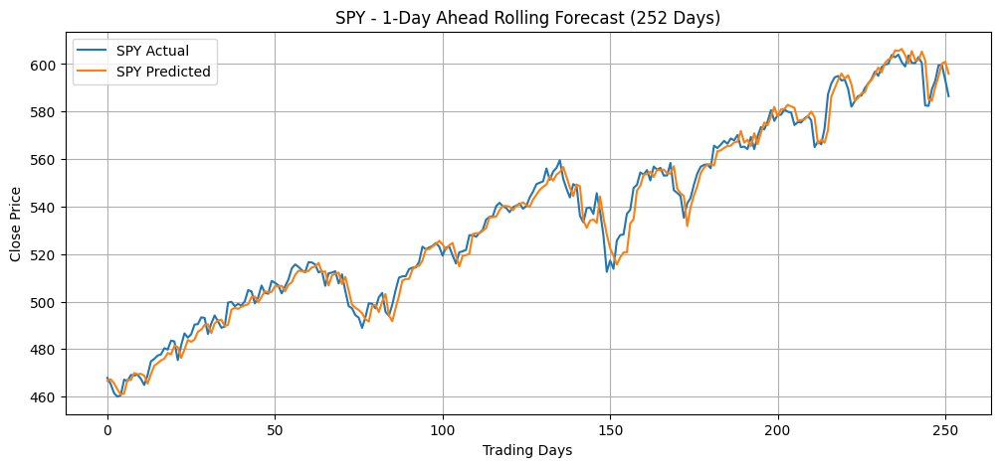

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
import warnings
from collections import defaultdict
import logging

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

combined_df = pd.concat([aapl, jpm, nvda, spy], ignore_index=True)
combined_df = combined_df[(combined_df['Date'] > '2008-01-01') & (combined_df['Date'] < '2024-12-31')]

# Sort by group and date, then assign a group-specific time index
combined_df = combined_df.sort_values(['group', 'Date'])
combined_df['time_idx'] = combined_df.groupby('group').cumcount()

# Here you could add technical indicators if desired.
# For brevity, we assume Close and Volume are used, or add additional features similarly.

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = combined_df["time_idx"].max() - 252  # leave last 252 days for rolling forecast

# === Create training dataset (using combined_df) ===
training = TimeSeriesDataSet(
    combined_df[combined_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Create a validation dataset for model training (not for rolling forecast)
val_df = combined_df[(combined_df.time_idx > (training_cutoff - max_encoder_length)) & (combined_df.time_idx <= combined_df["time_idx"].max())]
validation = TimeSeriesDataSet.from_dataset(training, val_df, stop_randomization=True)

batch_size = 64
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train the TFT model with multi-stock data ===
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)
tft.to("cuda")
tft_module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(tft_module, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

# === Rolling 1-day ahead forecast for 252 days ===
quarter_length = 63  # approx. a quarter
num_quarters = 252 // quarter_length  # 4 quarters in a year

from collections import defaultdict
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for q in range(num_quarters):
    print(f"\nRetraining for Quarter {q+1}")
    retrain_cutoff = training_cutoff + q * quarter_length

    new_training = TimeSeriesDataSet(
        combined_df[combined_df.time_idx <= retrain_cutoff],
        time_idx="time_idx",
        target="Close",
        group_ids=["group"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        time_varying_known_reals=["time_idx"],
        time_varying_unknown_reals=["Close", "Volume"],
        static_categoricals=["group"],
        allow_missing_timesteps=True
    )

    val_df = combined_df[(combined_df.time_idx > retrain_cutoff) & (combined_df.time_idx <= combined_df["time_idx"].max())]
    validation = TimeSeriesDataSet.from_dataset(new_training, val_df, stop_randomization=True)

    train_loader = new_training.to_dataloader(train=True, batch_size=64, num_workers=0)
    val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

    tft = TemporalFusionTransformer.from_dataset(
        new_training,
        learning_rate=0.01,
        hidden_size=128,
        attention_head_size=2,
        dropout=0.1,
        loss=SMAPE(),
        log_interval=10,
        reduce_on_plateau_patience=4,
    ).to("cuda")

    module = TFTLightningModule(tft)
    trainer = Trainer(
        max_epochs=20,
        gradient_clip_val=0.1,
        callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
        limit_train_batches=30,
        logger=False,
        enable_model_summary=False
    )
    trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_dataloader)

    # For each quarter, predict for quarter_length days (rolling 1-day ahead forecasts)
    for offset in range(quarter_length):
        day_offset = q * quarter_length + offset
        decoder_end_time = training_cutoff + day_offset + max_prediction_length
        # Get the last (max_encoder_length + max_prediction_length) rows up to decoder_end_time
        data_slice = combined_df[combined_df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        predict_dataset = TimeSeriesDataSet.from_dataset(new_training, data_slice, stop_randomization=True)
        predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

        prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
        actual = data_slice.iloc[-1]["Close"]
        group = data_slice.iloc[-1]["group"]

        preds_by_group[group].append(prediction)
        actuals_by_group[group].append(actual)

# === Evaluate and Plot per stock ===
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (252 Days)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


In [ ]:
immediately brilliant.

In [ ]:
df

,Date,Close,High,Low,Open,Volume,group,time_idx,RSI,MACD,MACD_signal,ma_5,volatility_63,intraday_range,upper_shadow,lower_shadow,momentum_126
126,2008-07-02,5.061141,5.340108,5.061141,5.272398,837519200,AAPL,126,42.302671,-0.080590,-0.048586,5.107787,0.372225,0.278967,0.067711,0.000000,-0.802296
127,2008-07-03,5.119523,5.181216,4.988014,5.103574,523362000,AAPL,127,44.426583,-0.082202,-0.055309,5.118982,0.363306,0.193201,0.061692,0.115560,-0.746621
128,2008-07-07,5.271194,5.330479,5.173090,5.211008,820391600,AAPL,128,49.615612,-0.070428,-0.058333,5.149496,0.355837,0.157389,0.059284,0.037918,-0.147157
129,2008-07-08,5.403306,5.407821,5.198369,5.278418,888350400,AAPL,129,53.673257,-0.049863,-0.056639,5.222383,0.345562,0.209451,0.004514,0.080049,0.057478
130,2008-07-09,5.243810,5.444233,5.240500,5.422866,895776000,AAPL,130,48.586002,-0.045905,-0.054492,5.219795,0.332812,0.203733,0.021367,0.003310,0.090281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17107,2024-12-23,592.906433,593.514589,585.897488,589.117842,57635800,SPY,4273,49.847438,0.767522,2.976924,589.536633,12.634446,7.617101,0.608156,3.220354,53.188049
17108,2024-12-24,599.496582,599.536501,593.684050,594.272307,33160100,SPY,4274,56.013034,1.147900,2.611119,589.344617,12.579967,5.852451,0.039919,0.588257,59.104553
17109,2024-12-26,599.536499,600.673034,596.286267,597.701991,41219100,SPY,4275,56.048280,1.436019,2.376099,592.739722,12.554128,4.386767,1.136535,1.415724,58.292542
17110,2024-12-27,593.225464,595.987176,588.988210,595.747844,64969300,SPY,4276,49.319624,1.141945,2.129268,594.908411,12.401028,6.998965,0.239331,4.237253,54.111328


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Retraining for Quarter 1


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Retraining for Quarter 2


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Retraining for Quarter 3


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


Retraining for Quarter 4


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 zAAPL Evaluation:
  RMSE: 3.0655
  MAE : 2.2860
  R²  : 0.9856


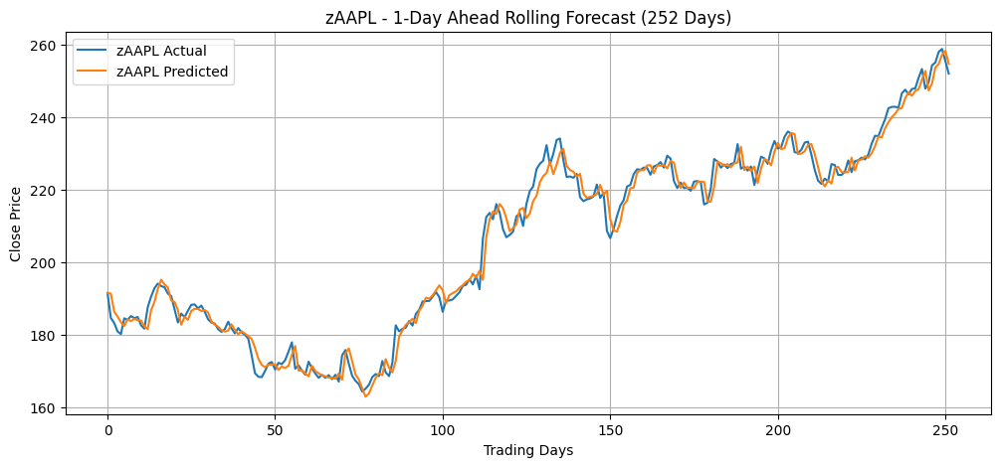

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
import warnings
from collections import defaultdict
import logging

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    return df

zaapl = load_stock("AAPL.csv", "zAAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

combined_df = pd.concat([jpm, nvda, spy, zaapl], ignore_index=True)
combined_df = combined_df[(combined_df['Date'] > '2008-01-01') & (combined_df['Date'] < '2024-12-31')]

# Sort by group and date, then assign a group-specific time index
combined_df = combined_df.sort_values(['group', 'Date'])
combined_df['time_idx'] = combined_df.groupby('group').cumcount()

# Here you could add technical indicators if desired.
# For brevity, we assume Close and Volume are used, or add additional features similarly.

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = combined_df["time_idx"].max() - 252  # leave last 252 days for rolling forecast

# === Create training dataset (using combined_df) ===
training = TimeSeriesDataSet(
    combined_df[combined_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# Create a validation dataset for model training (not for rolling forecast)
val_df = combined_df[(combined_df.time_idx > (training_cutoff - max_encoder_length)) & (combined_df.time_idx <= combined_df["time_idx"].max())]
validation = TimeSeriesDataSet.from_dataset(training, val_df, stop_randomization=True)

batch_size = 64
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train the TFT model with multi-stock data ===
tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
)
tft.to("cuda")
tft_module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(tft_module, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

# === Rolling 1-day ahead forecast for 252 days ===
quarter_length = 63  # approx. a quarter
num_quarters = 252 // quarter_length  # 4 quarters in a year

from collections import defaultdict
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for q in range(num_quarters):
    print(f"\nRetraining for Quarter {q+1}")
    retrain_cutoff = training_cutoff + q * quarter_length

    new_training = TimeSeriesDataSet(
        combined_df[combined_df.time_idx <= retrain_cutoff],
        time_idx="time_idx",
        target="Close",
        group_ids=["group"],
        max_encoder_length=max_encoder_length,
        max_prediction_length=max_prediction_length,
        time_varying_known_reals=["time_idx"],
        time_varying_unknown_reals=["Close", "Volume"],
        static_categoricals=["group"],
        allow_missing_timesteps=True
    )

    val_df = combined_df[(combined_df.time_idx > retrain_cutoff) & (combined_df.time_idx <= combined_df["time_idx"].max())]
    validation = TimeSeriesDataSet.from_dataset(new_training, val_df, stop_randomization=True)

    train_loader = new_training.to_dataloader(train=True, batch_size=64, num_workers=0)
    val_dataloader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

    tft = TemporalFusionTransformer.from_dataset(
        new_training,
        learning_rate=0.01,
        hidden_size=128,
        attention_head_size=2,
        dropout=0.1,
        loss=SMAPE(),
        log_interval=10,
        reduce_on_plateau_patience=4,
    ).to("cuda")

    module = TFTLightningModule(tft)
    trainer = Trainer(
        max_epochs=20,
        gradient_clip_val=0.1,
        callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
        limit_train_batches=30,
        logger=False,
        enable_model_summary=False
    )
    trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_dataloader)

    # For each quarter, predict for quarter_length days (rolling 1-day ahead forecasts)
    for offset in range(quarter_length):
        day_offset = q * quarter_length + offset
        decoder_end_time = training_cutoff + day_offset + max_prediction_length
        # Get the last (max_encoder_length + max_prediction_length) rows up to decoder_end_time
        data_slice = combined_df[combined_df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        predict_dataset = TimeSeriesDataSet.from_dataset(new_training, data_slice, stop_randomization=True)
        predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

        prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
        actual = data_slice.iloc[-1]["Close"]
        group = data_slice.iloc[-1]["group"]

        preds_by_group[group].append(prediction)
        actuals_by_group[group].append(actual)

# === Evaluate and Plot per stock ===
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (252 Days)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 zAAPL Evaluation:
  RMSE: 3.0943
  MAE : 2.3154
  R²  : 0.9859


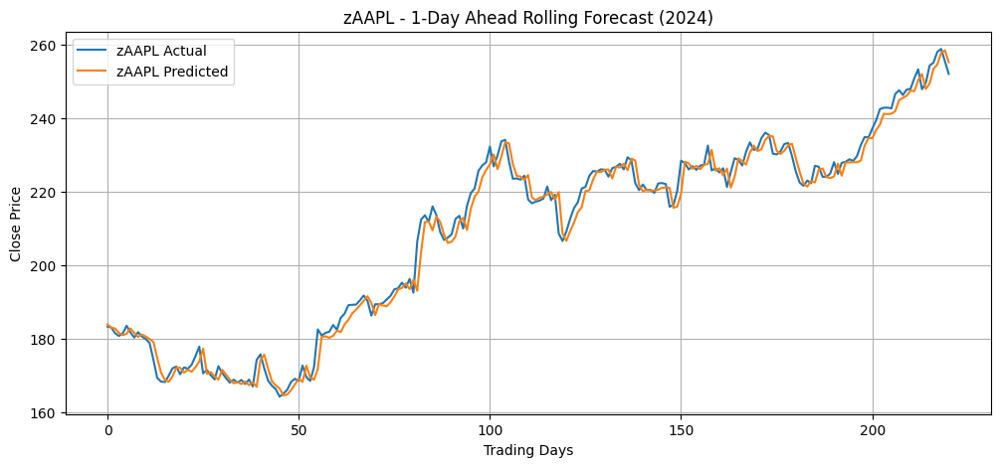

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    return df

zaapl = load_stock("AAPL.csv", "zAAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, zaapl], ignore_index=True)
df = df[(df['Date'] > '2008-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2024-01-01"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)

# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

rolling_steps = len(test_df["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(rolling_steps):
    decoder_end_time = test_df["time_idx"].min() + offset + max_encoder_length + max_prediction_length - 1
    data_slice = test_df[test_df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]
    group = data_slice.iloc[-1]["group"]

    preds_by_group[group].append(prediction)
    actuals_by_group[group].append(actual)

# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 zJPM Evaluation:
  RMSE: 4.0214
  MAE : 2.8836
  R²  : 0.9571


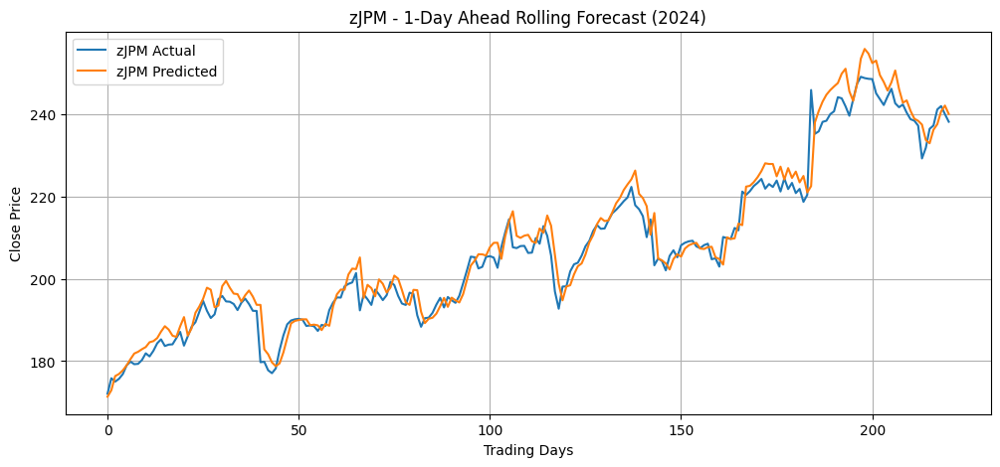

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "zJPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2008-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2024-01-01"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)

# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

rolling_steps = len(test_df["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(rolling_steps):
    decoder_end_time = test_df["time_idx"].min() + offset + max_encoder_length + max_prediction_length - 1
    data_slice = test_df[test_df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]
    group = data_slice.iloc[-1]["group"]

    preds_by_group[group].append(prediction)
    actuals_by_group[group].append(actual)

# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 zNVDA Evaluation:
  RMSE: 3.9407
  MAE : 3.0549
  R²  : 0.9667


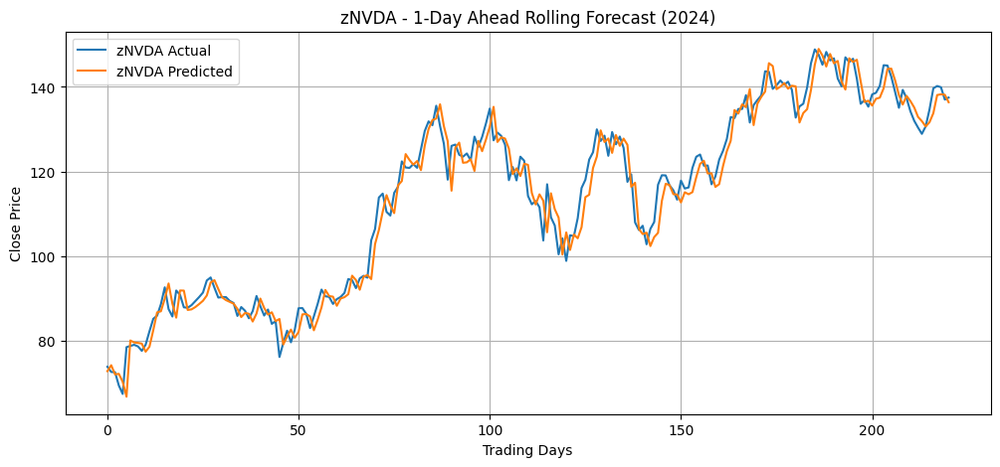

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "zNVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2008-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2024-01-01"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)

# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

rolling_steps = len(test_df["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(rolling_steps):
    decoder_end_time = test_df["time_idx"].min() + offset + max_encoder_length + max_prediction_length - 1
    data_slice = test_df[test_df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]
    group = data_slice.iloc[-1]["group"]

    preds_by_group[group].append(prediction)
    actuals_by_group[group].append(actual)

# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 SPY Evaluation:
  RMSE: 4.9350
  MAE : 3.7537
  R²  : 0.9777


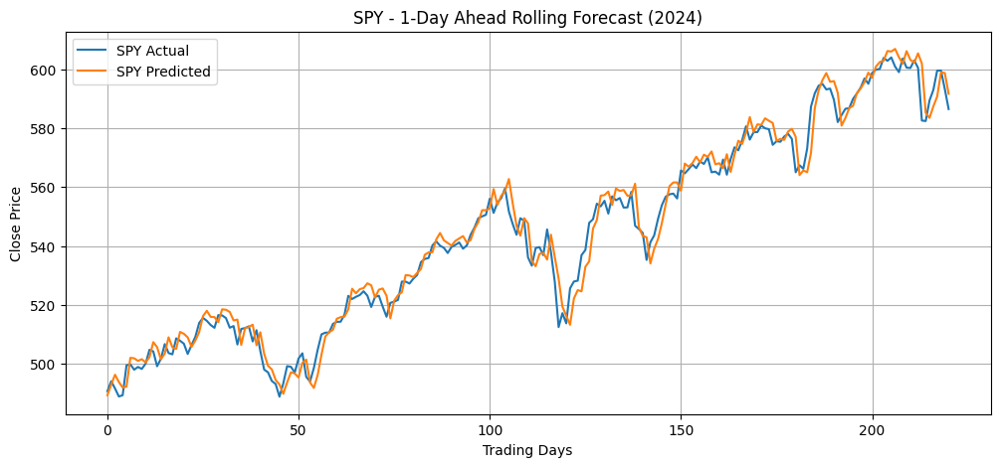

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2008-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2024-01-01"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)

# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

rolling_steps = len(test_df["time_idx"].unique()) - max_encoder_length - max_prediction_length

for offset in range(rolling_steps):
    decoder_end_time = test_df["time_idx"].min() + offset + max_encoder_length + max_prediction_length - 1
    data_slice = test_df[test_df.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

    if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
        continue

    predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
    predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

    prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
    actual = data_slice.iloc[-1]["Close"]
    group = data_slice.iloc[-1]["group"]

    preds_by_group[group].append(prediction)
    actuals_by_group[group].append(actual)

# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.1796
  MAE : 2.3308
  R²  : 0.9851


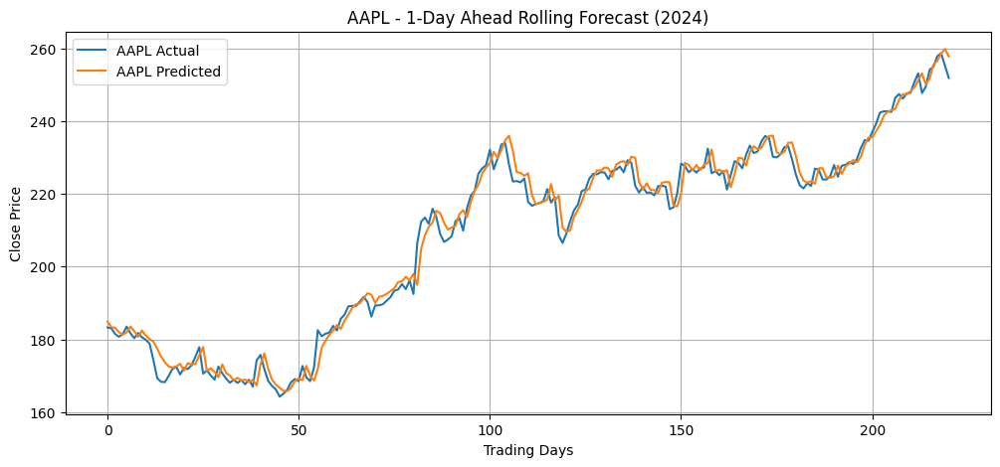


📊 JPM Evaluation:
  RMSE: 3.3472
  MAE : 2.2095
  R²  : 0.9703


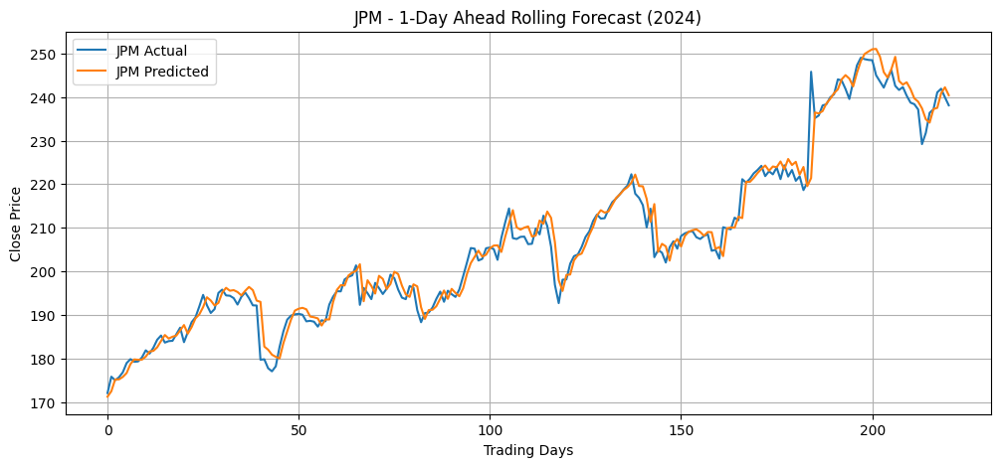


📊 NVDA Evaluation:
  RMSE: 3.9976
  MAE : 3.0626
  R²  : 0.9657


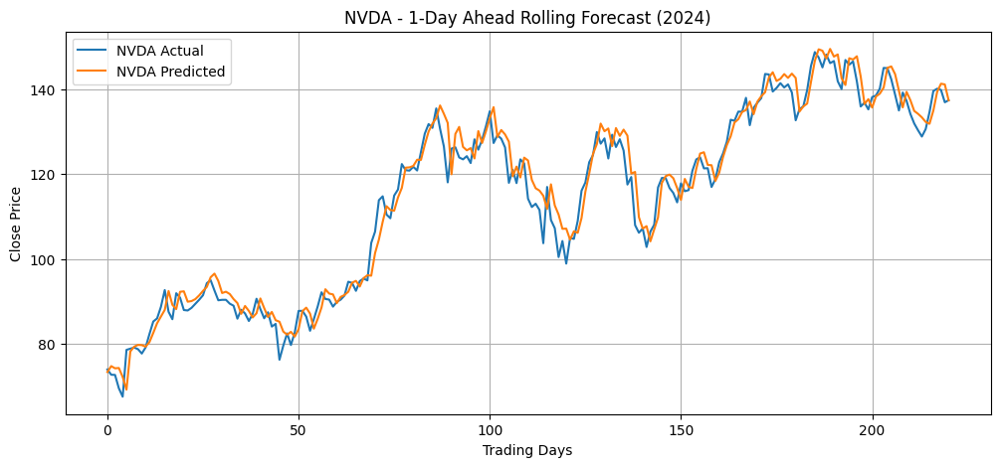


📊 SPY Evaluation:
  RMSE: 4.7812
  MAE : 3.4671
  R²  : 0.9791


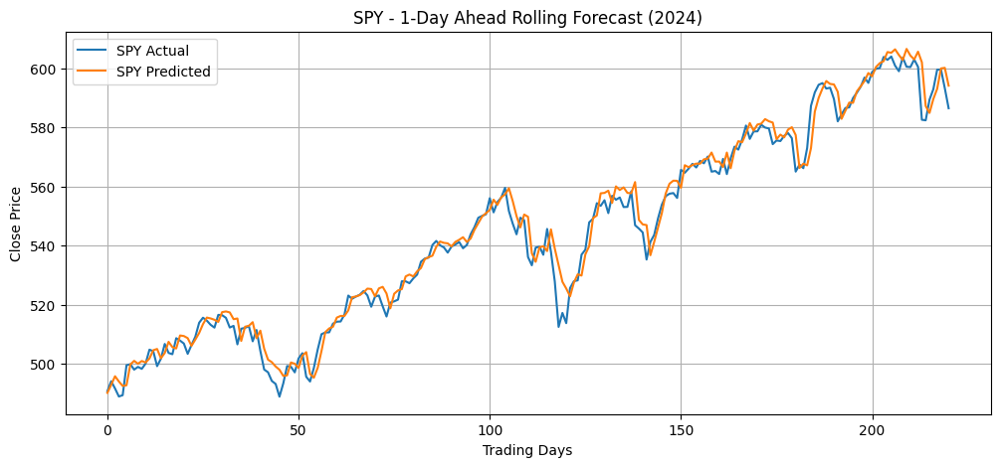

In [ ]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2008-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2024-01-01"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

In [ ]:
test_df

,Date,Close,High,Low,Open,Volume,group,time_idx
0,2024-01-02,184.532074,187.315366,182.792518,186.033057,82488700,AAPL,4027
1,2024-01-03,183.150375,184.770652,182.335262,183.120556,58414500,AAPL,4028
2,2024-01-04,180.824356,181.997307,179.800504,181.062914,71983600,AAPL,4029
3,2024-01-05,180.098694,181.669266,179.094727,180.903872,62303300,AAPL,4030
4,2024-01-08,184.452560,184.492330,180.416793,181.003268,59144500,AAPL,4031
...,...,...,...,...,...,...,...,...
1003,2024-12-24,599.496582,599.536501,593.684050,594.272307,33160100,SPY,4274
1004,2024-12-26,599.536499,600.673034,596.286267,597.701991,41219100,SPY,4275
1005,2024-12-27,593.225464,595.987176,588.988210,595.747844,64969300,SPY,4276
1006,2024-12-30,586.455811,589.965273,582.657240,586.126844,56578800,SPY,4277


INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 841 K  | train
------------------------------------------------------------
841 K     Trainable params
0         Non-trainable params
841 K     Total params
3.365     Total estimated model params size (MB)
193       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.4000
  MAE : 2.5925
  R²  : 0.9823


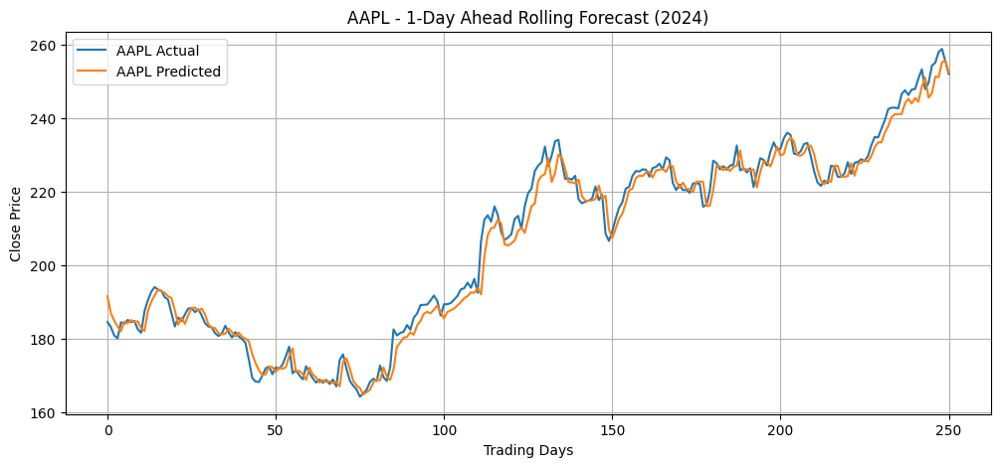


📊 JPM Evaluation:
  RMSE: 3.5659
  MAE : 2.5551
  R²  : 0.9741


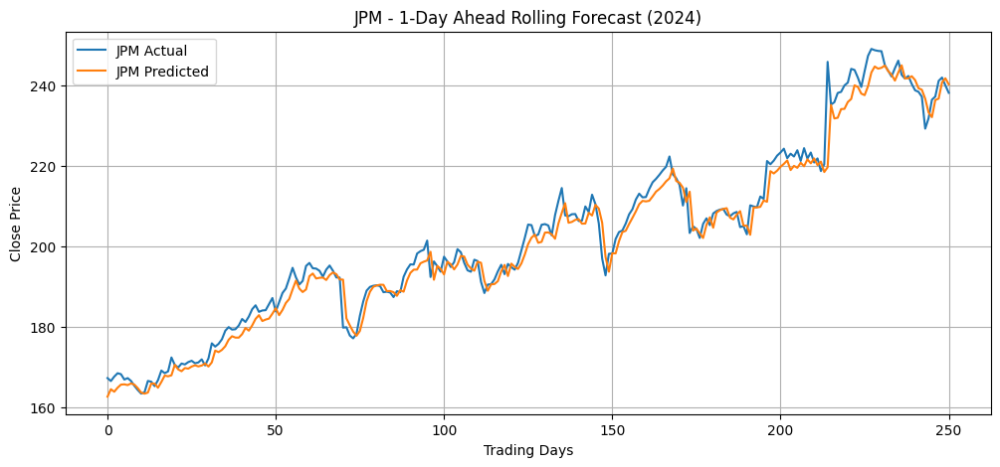


📊 NVDA Evaluation:
  RMSE: 3.8743
  MAE : 3.0081
  R²  : 0.9793


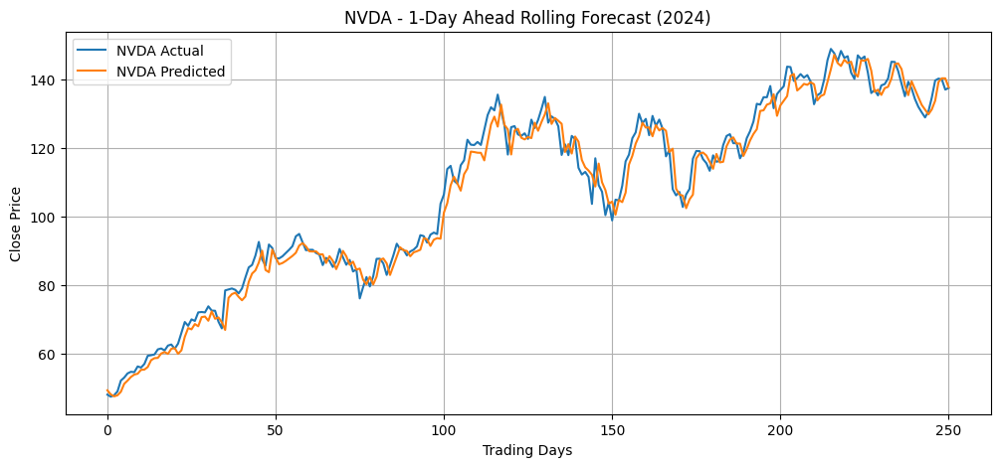


📊 SPY Evaluation:
  RMSE: 4.8695
  MAE : 3.9064
  R²  : 0.9837


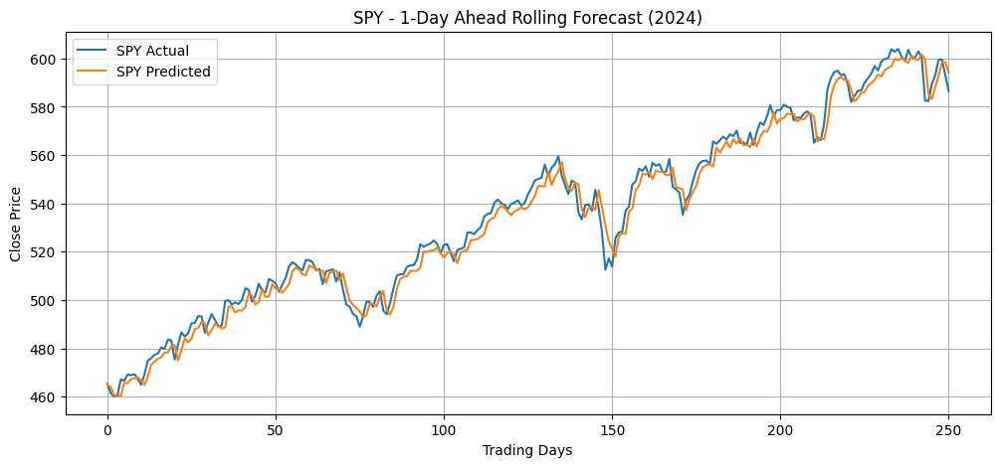

In [4]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2008-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 847 K  | train
------------------------------------------------------------
847 K     Trainable params
0         Non-trainable params
847 K     Total params
3.391     Total estimated model params size (MB)
223       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.2115
  MAE : 2.4750
  R²  : 0.9842


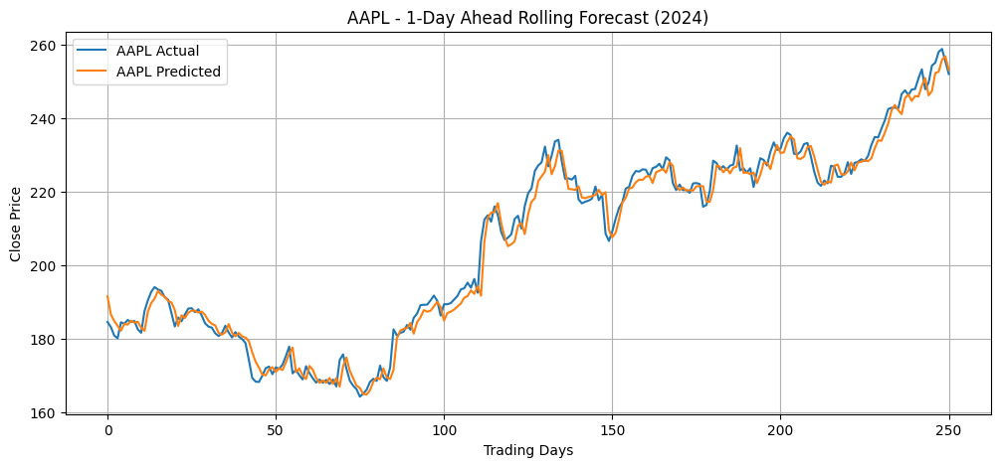


📊 JPM Evaluation:
  RMSE: 3.3636
  MAE : 2.2525
  R²  : 0.9769


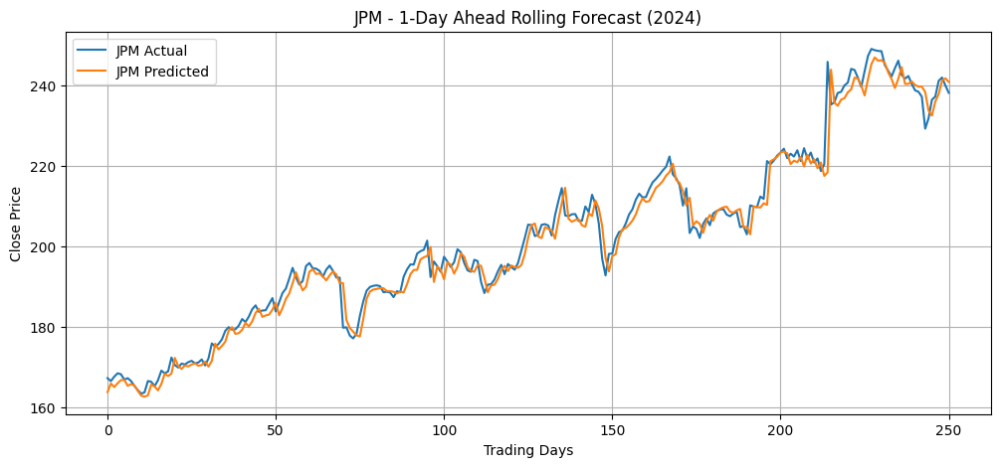


📊 NVDA Evaluation:
  RMSE: 3.8467
  MAE : 2.9860
  R²  : 0.9796


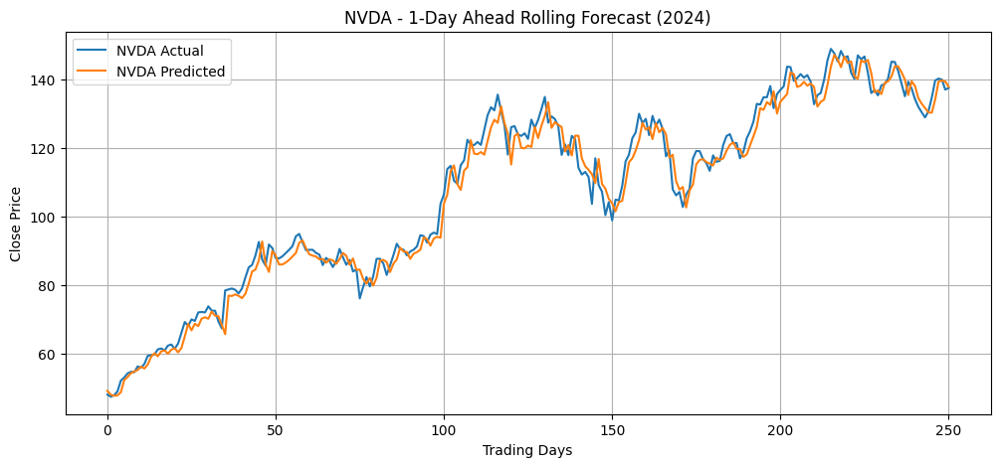


📊 SPY Evaluation:
  RMSE: 4.7786
  MAE : 3.7876
  R²  : 0.9843


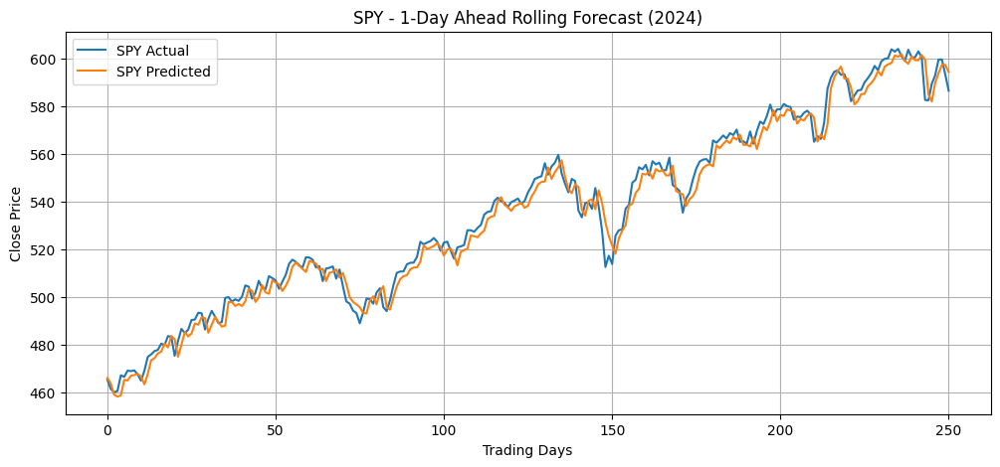

In [5]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2008-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume", "RSI", "MACD"],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

# RSI and MACD improve performance. Now try all features.

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.3618
  MAE : 2.6577
  R²  : 0.9827


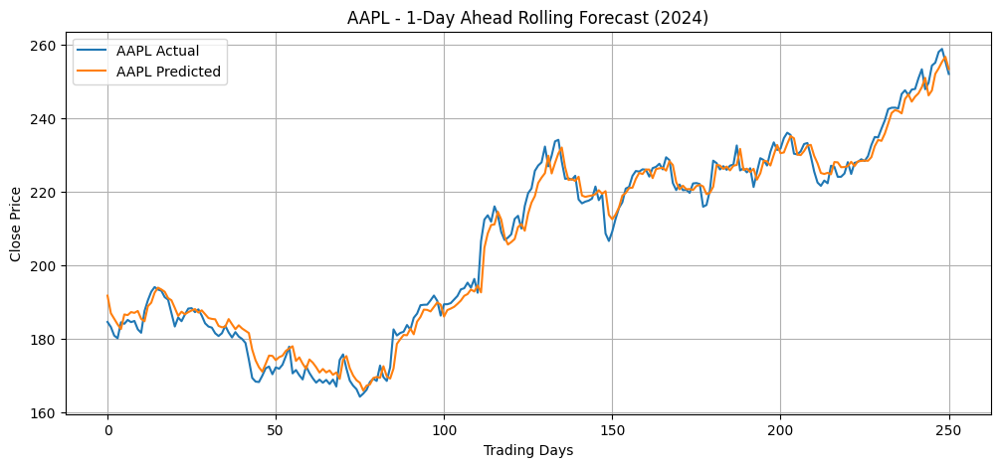


📊 JPM Evaluation:
  RMSE: 3.2857
  MAE : 2.2211
  R²  : 0.9780


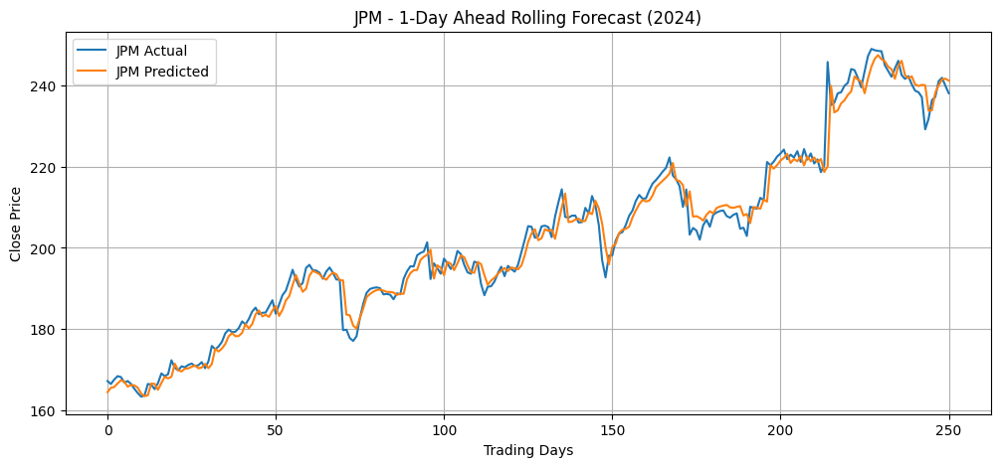


📊 NVDA Evaluation:
  RMSE: 3.9146
  MAE : 2.9337
  R²  : 0.9788


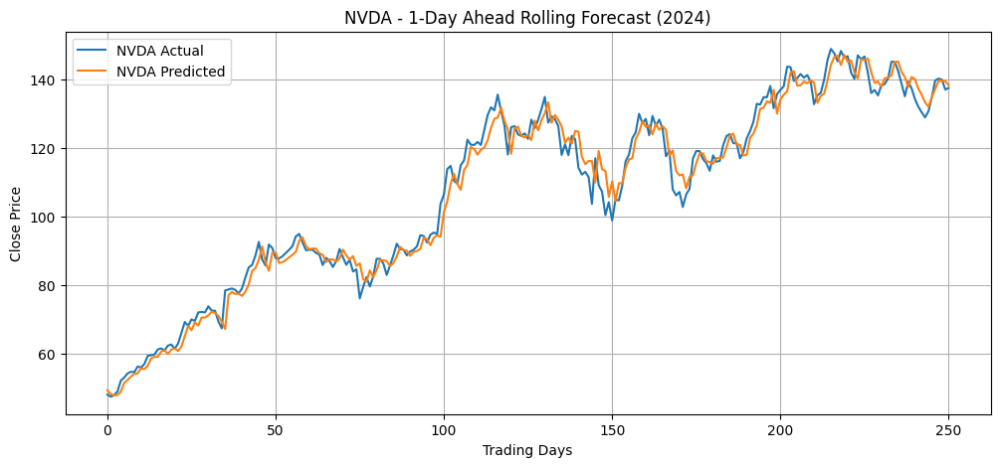


📊 SPY Evaluation:
  RMSE: 4.6309
  MAE : 3.5286
  R²  : 0.9852


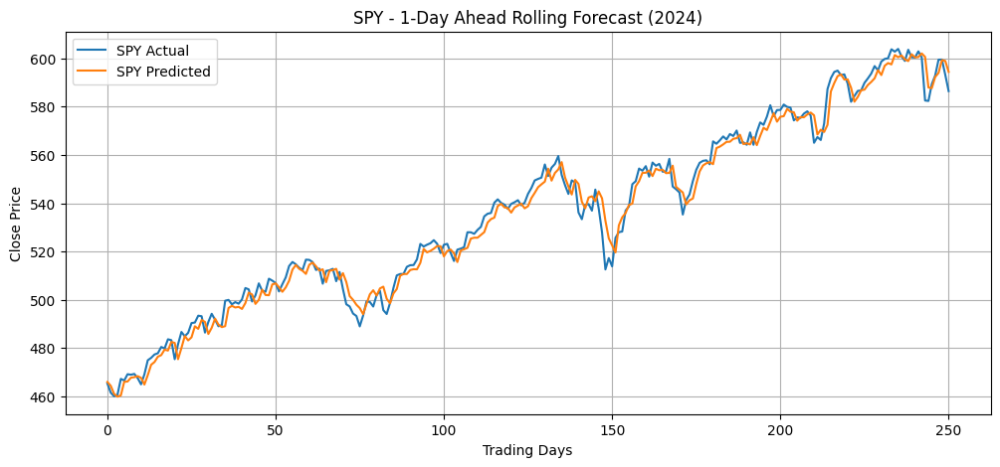

In [17]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['ma_5'] = df['Close'].rolling(window=5).mean()
    df['volatility_63'] = df['Close'].rolling(window=63).std()
    df['intraday_range'] = df['High'] - df['Low']
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    df['momentum_126'] = df['Close'] - df['Close'].shift(126)
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2008-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume", "RSI", "MACD", 'ma_5', 'volatility_63', 'intraday_range', 'upper_shadow', 'lower_shadow', 'momentum_126'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

2 are better, 2 are worse.

# Working feature importance encoder!!:

{'attention': <Figure size 640x480 with 1 Axes>,
 'static_variables': <Figure size 700x225 with 1 Axes>,
 'encoder_variables': <Figure size 700x475 with 1 Axes>,
 'decoder_variables': <Figure size 700x225 with 1 Axes>}

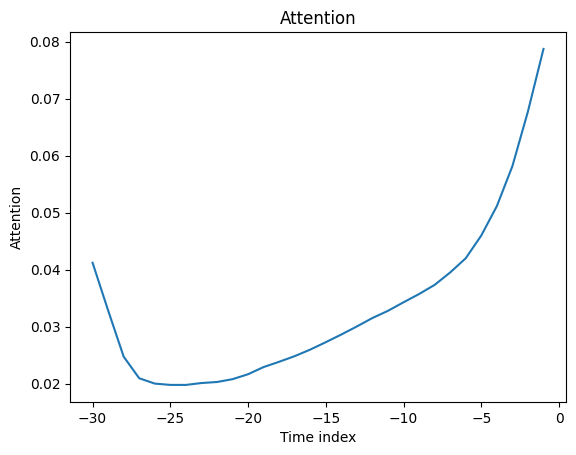

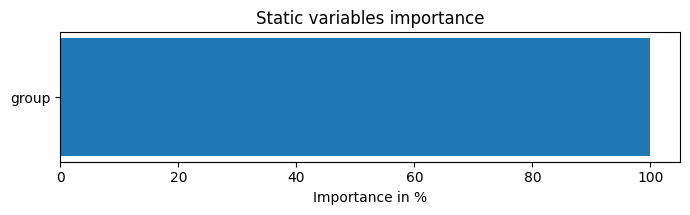

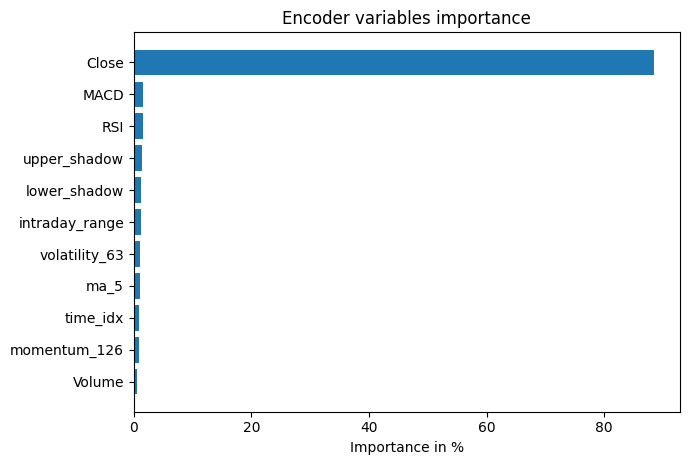

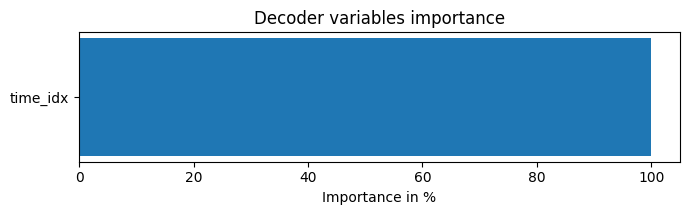

In [27]:
# Select a representative sample from validation set
interpretation_dataset = TimeSeriesDataSet.from_dataset(
    tft_dataset,
    val_df.tail(200),  # adjust size if needed
    stop_randomization=True
)

interpretation_loader = interpretation_dataset.to_dataloader(train=False, batch_size=64, num_workers=0)

# Get raw predictions and attention weights
raw_output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)

# `raw_output` is a dictionary-like object
raw_predictions = raw_output[0]
x = raw_output[1]

# Interpret attention / variable importance
interpretation = tft.interpret_output(raw_predictions, reduction="mean")

# Plot
tft.plot_interpretation(interpretation)

In [19]:
output = tft.predict(interpretation_loader, mode="raw", return_x=True, return_index=True)
print(type(output), len(output))


<class 'pytorch_forecasting.models.base._base_model.Prediction'> 5


In [29]:
raw_output[4]

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.2169
  MAE : 2.3736
  R²  : 0.9841


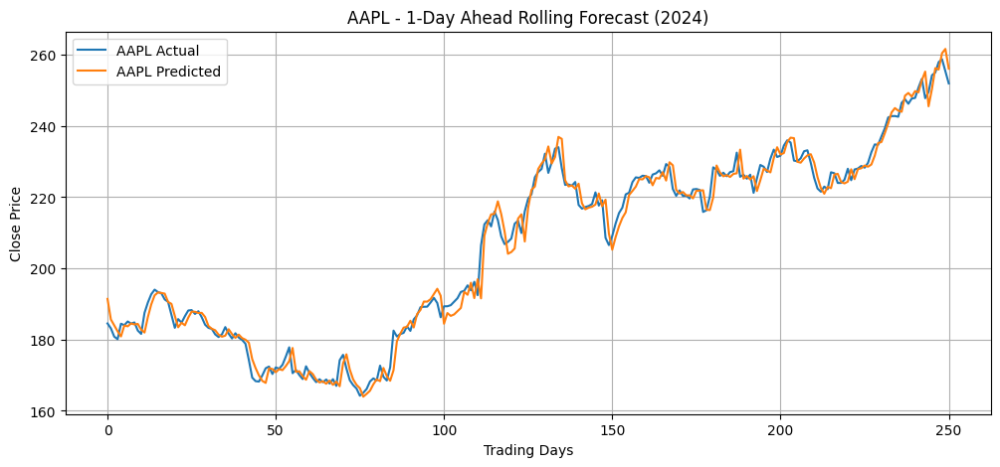


📊 JPM Evaluation:
  RMSE: 3.2939
  MAE : 2.1283
  R²  : 0.9779


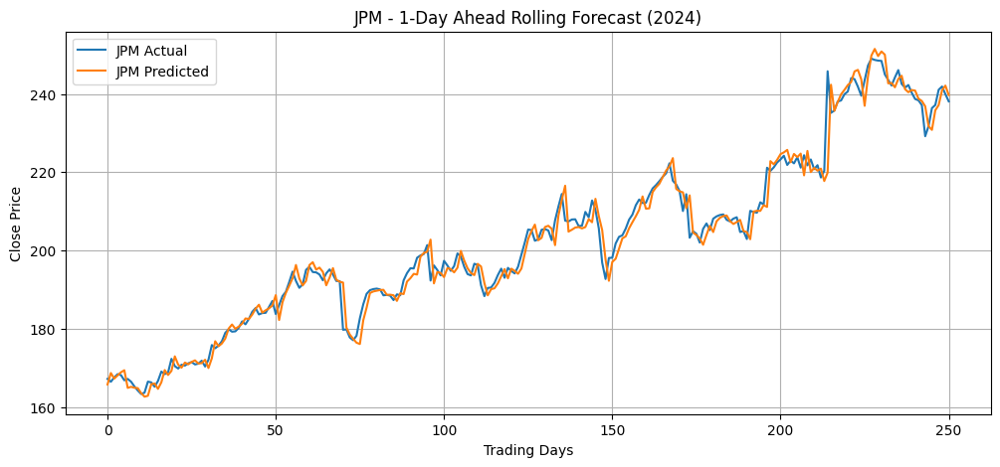


📊 NVDA Evaluation:
  RMSE: 3.6301
  MAE : 2.8245
  R²  : 0.9818


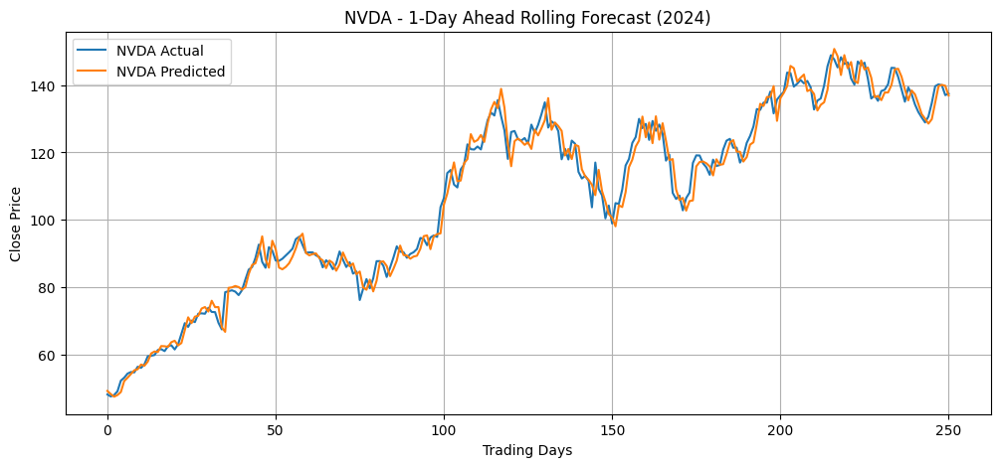


📊 SPY Evaluation:
  RMSE: 4.7280
  MAE : 3.6490
  R²  : 0.9846


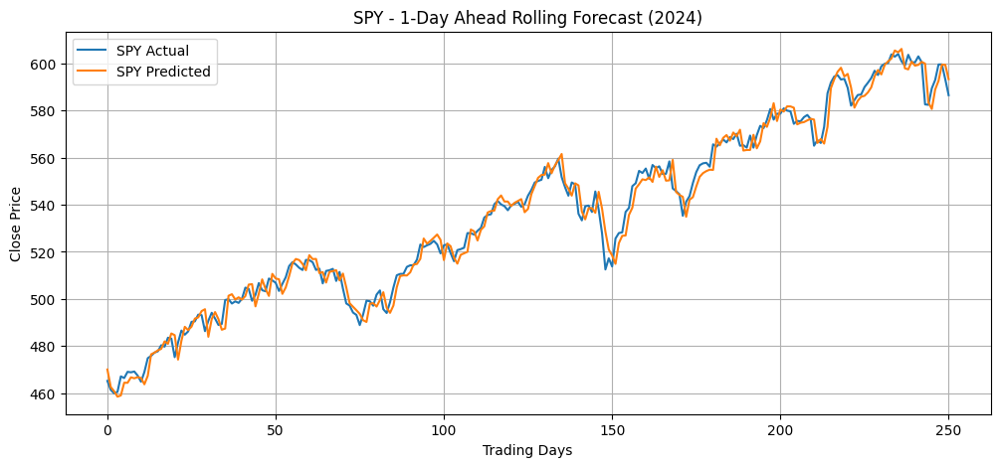

In [30]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['ma_5'] = df['Close'].rolling(window=5).mean()
    df['volatility_63'] = df['Close'].rolling(window=63).std()
    df['intraday_range'] = df['High'] - df['Low']
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    df['momentum_126'] = df['Close'] - df['Close'].shift(126)
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume", "RSI", "MACD", 'ma_5', 'volatility_63', 'intraday_range', 'upper_shadow', 'lower_shadow', 'momentum_126'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

# Hyperparam Tuning:

higher encoder length (tried lower earlier and it was bad)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 4.6140
  MAE : 3.7138
  R²  : 0.9676


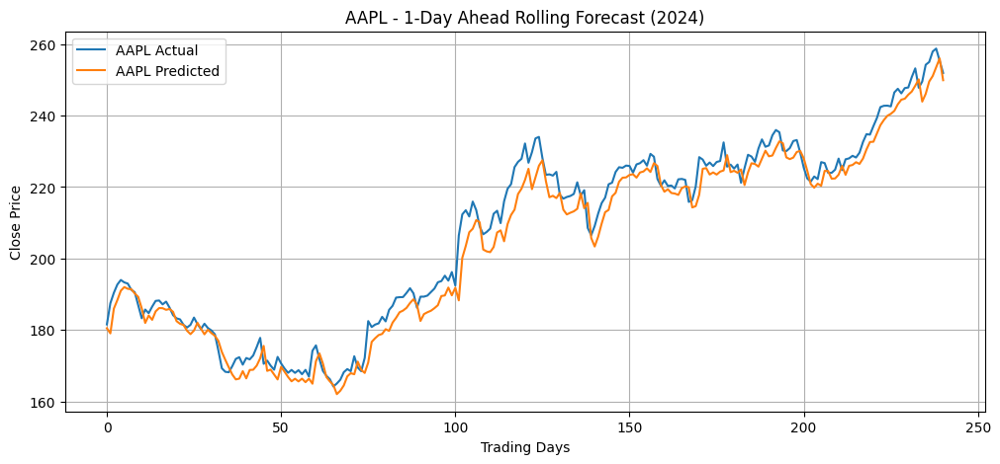


📊 JPM Evaluation:
  RMSE: 4.4599
  MAE : 3.5394
  R²  : 0.9564


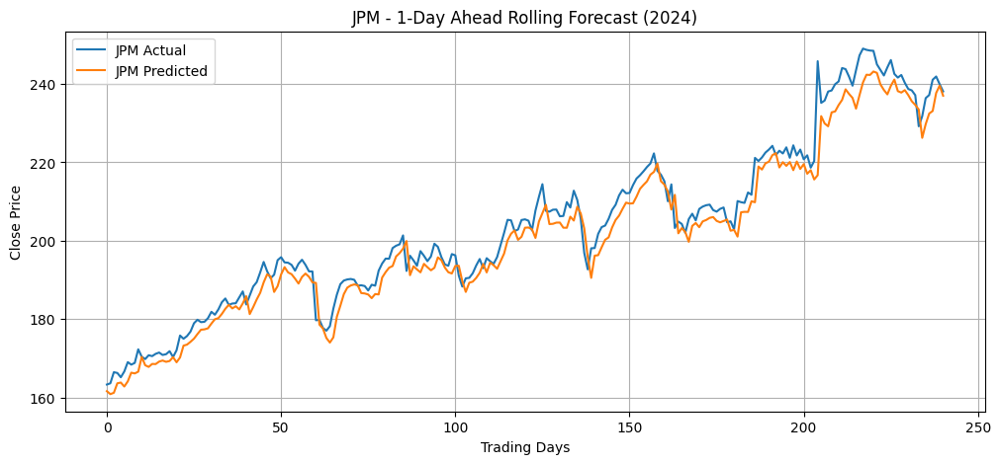


📊 NVDA Evaluation:
  RMSE: 5.0192
  MAE : 4.0475
  R²  : 0.9593


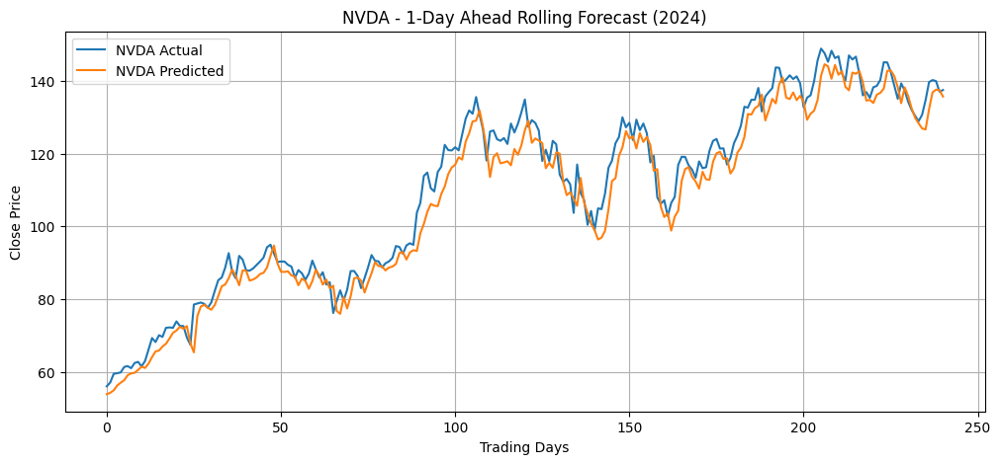


📊 SPY Evaluation:
  RMSE: 6.7566
  MAE : 5.9345
  R²  : 0.9648


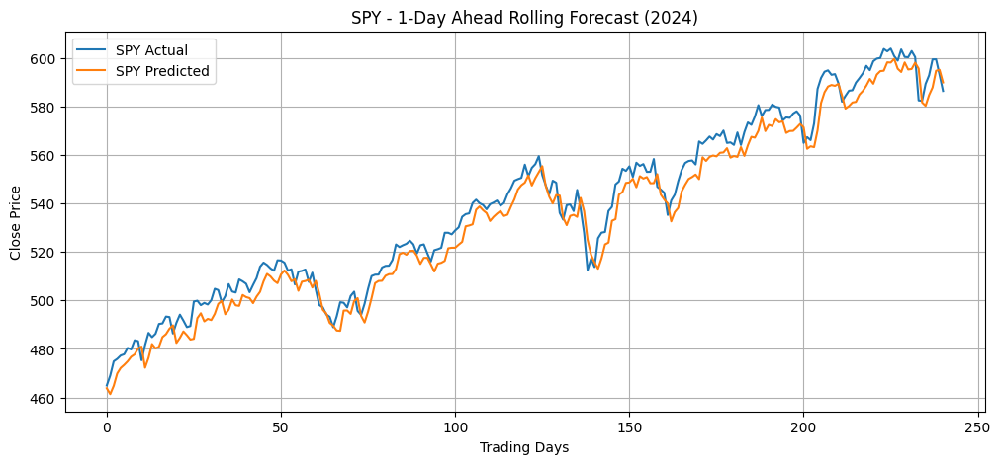

In [31]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 40
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "Volume", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

Bigger window was worse. Now try higher LR (0.01 to 0.03).

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.3609
  MAE : 2.5926
  R²  : 0.9827


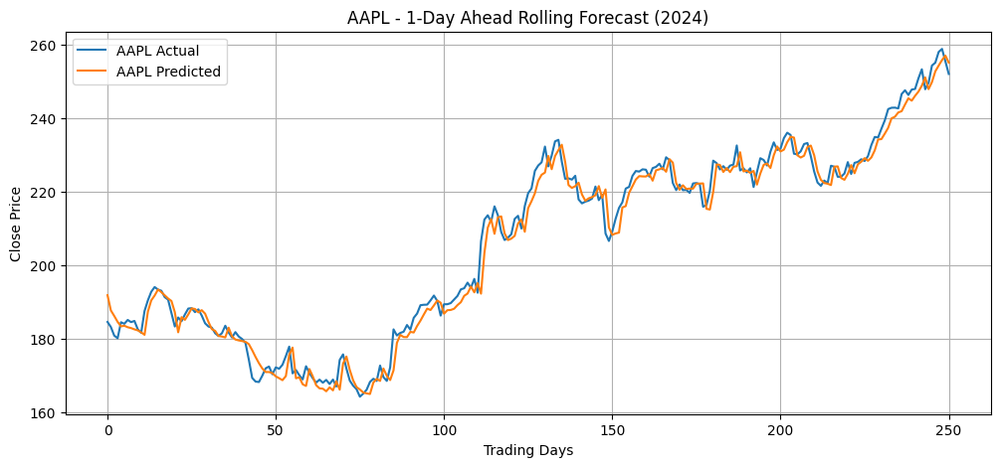


📊 JPM Evaluation:
  RMSE: 3.3070
  MAE : 2.2600
  R²  : 0.9777


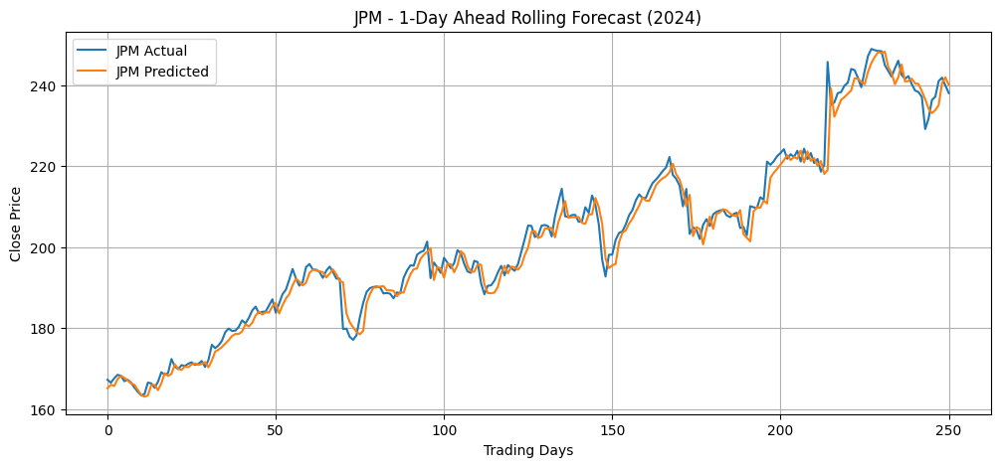


📊 NVDA Evaluation:
  RMSE: 3.8041
  MAE : 2.9954
  R²  : 0.9800


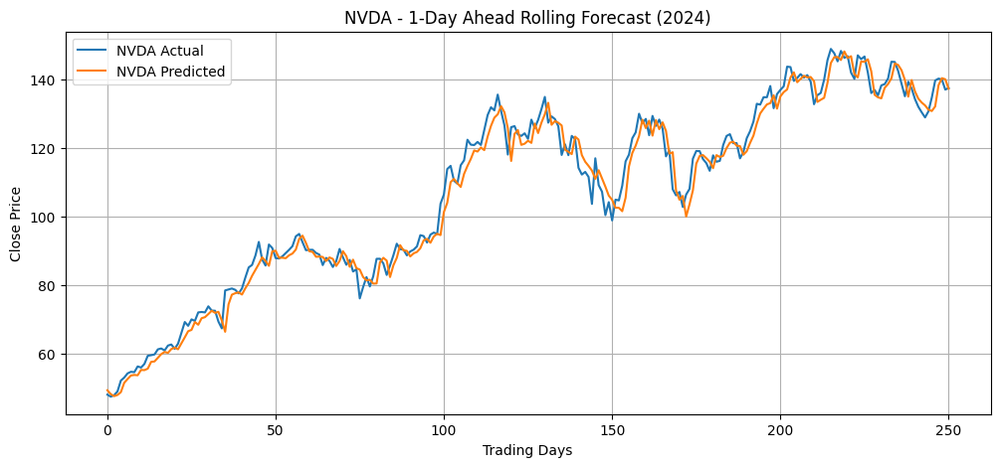


📊 SPY Evaluation:
  RMSE: 4.8237
  MAE : 3.7125
  R²  : 0.9840


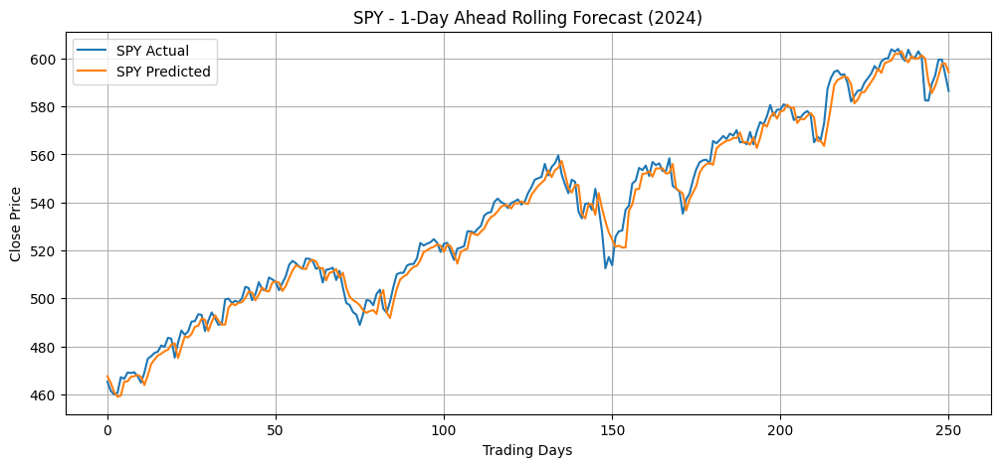

In [32]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.03,
    hidden_size=128,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

Higher LR slightly worse. Now try smaller hidden size.

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.0098
  MAE : 2.2700
  R²  : 0.9861


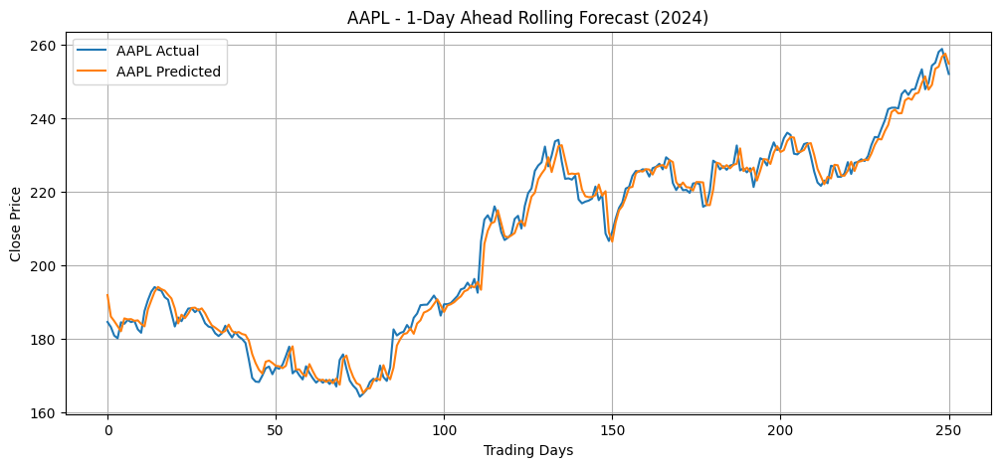


📊 JPM Evaluation:
  RMSE: 3.1338
  MAE : 2.0893
  R²  : 0.9800


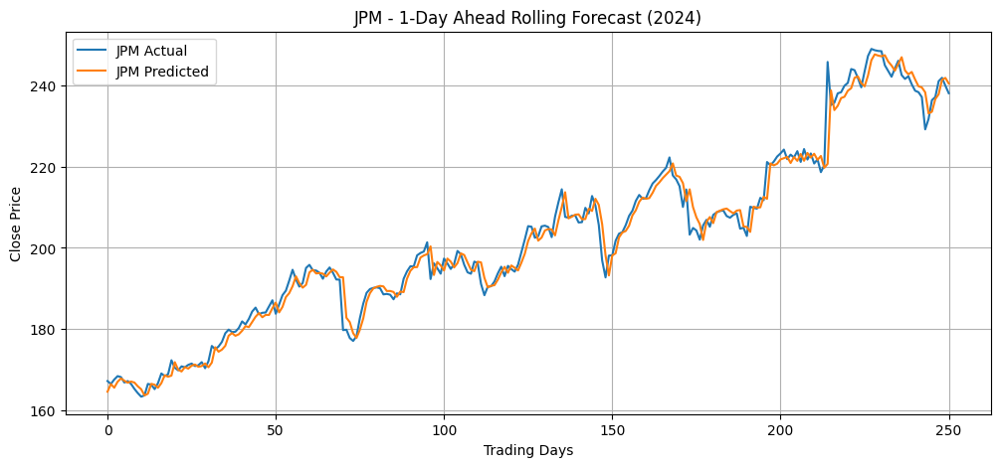


📊 NVDA Evaluation:
  RMSE: 3.5917
  MAE : 2.7416
  R²  : 0.9822


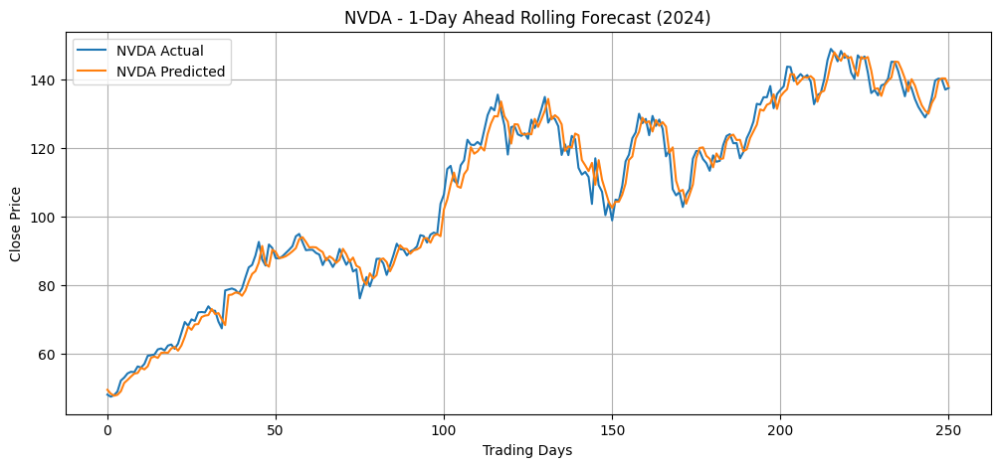


📊 SPY Evaluation:
  RMSE: 4.3657
  MAE : 3.2293
  R²  : 0.9869


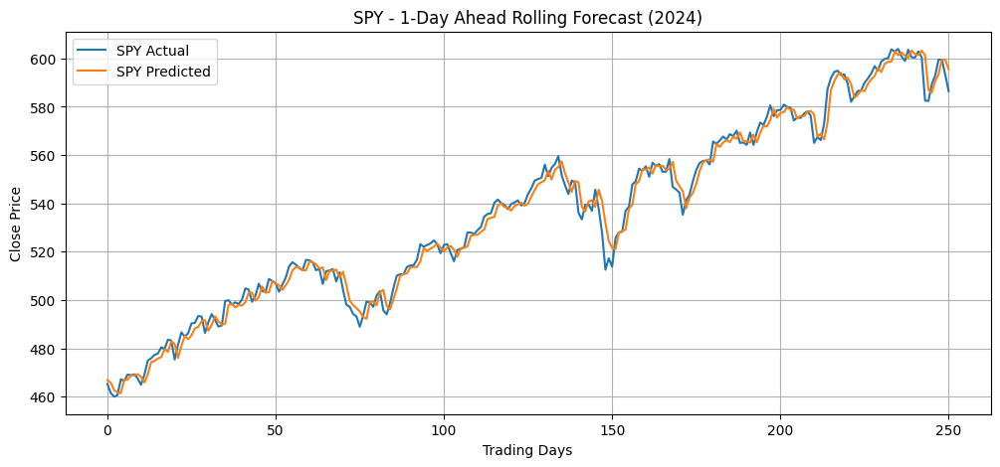

In [33]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

Smaller hidden layer size was better. Now try bigger dropout (0.2 vs 0.1)

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.0585
  MAE : 2.3019
  R²  : 0.9857


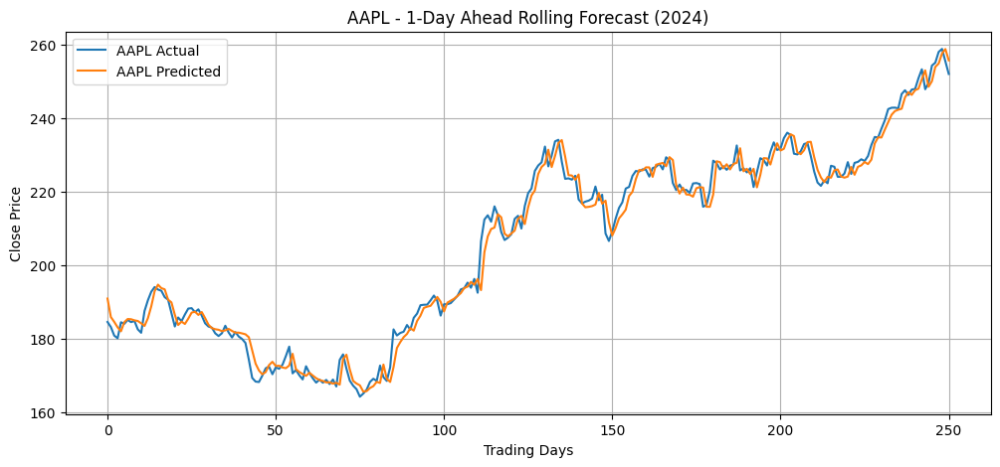


📊 JPM Evaluation:
  RMSE: 3.1305
  MAE : 2.0864
  R²  : 0.9800


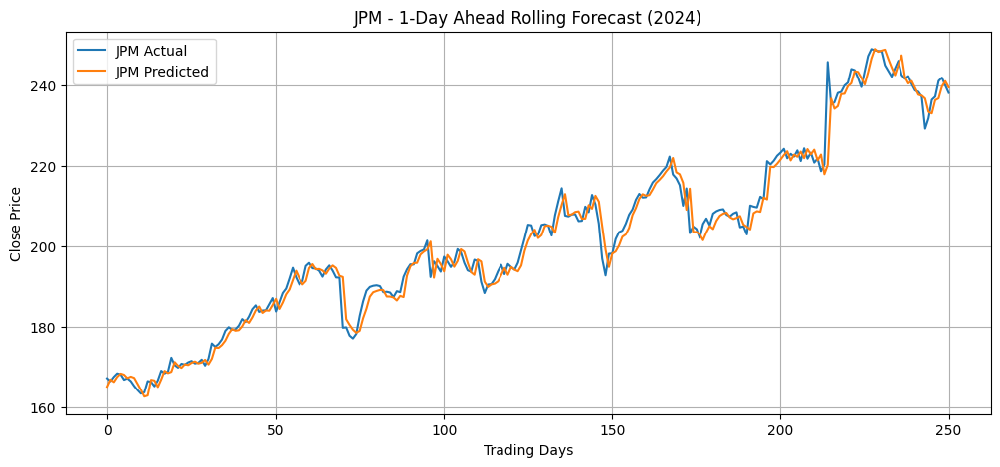


📊 NVDA Evaluation:
  RMSE: 3.7109
  MAE : 2.7873
  R²  : 0.9810


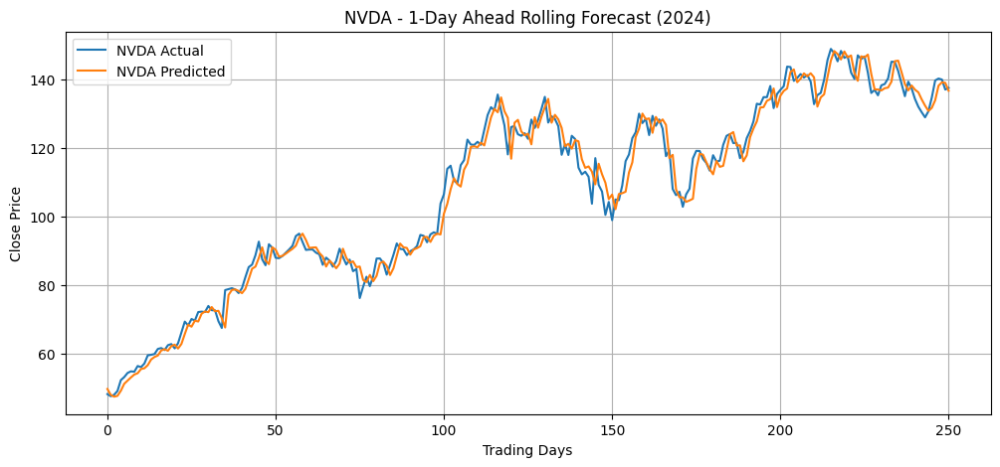


📊 SPY Evaluation:
  RMSE: 4.4738
  MAE : 3.2955
  R²  : 0.9862


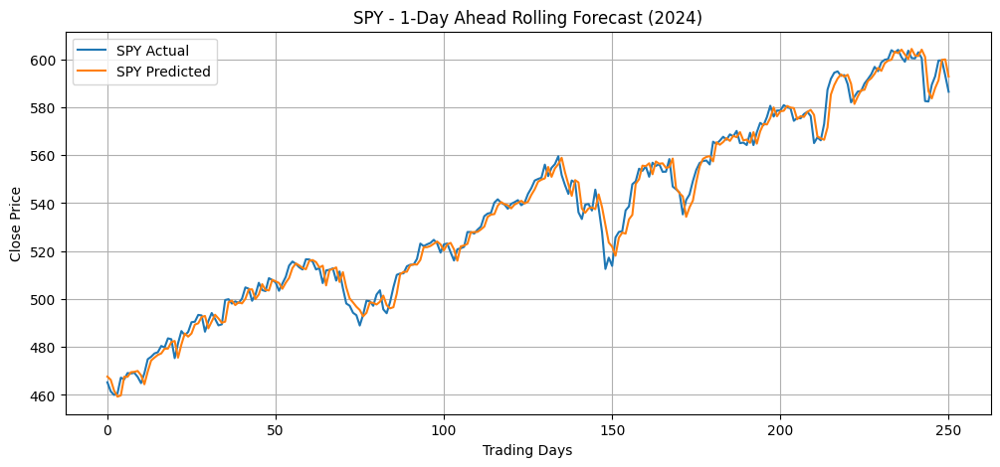

In [34]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.2,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

Higher dropout was slightly worse. Now try lower batch rate (32 vs 64).

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.0204
  MAE : 2.1993
  R²  : 0.9860


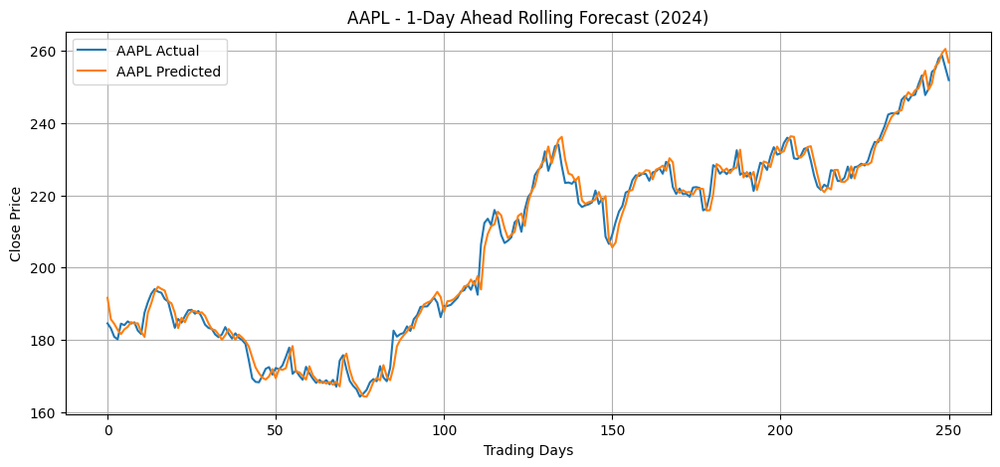


📊 JPM Evaluation:
  RMSE: 3.1411
  MAE : 2.0337
  R²  : 0.9799


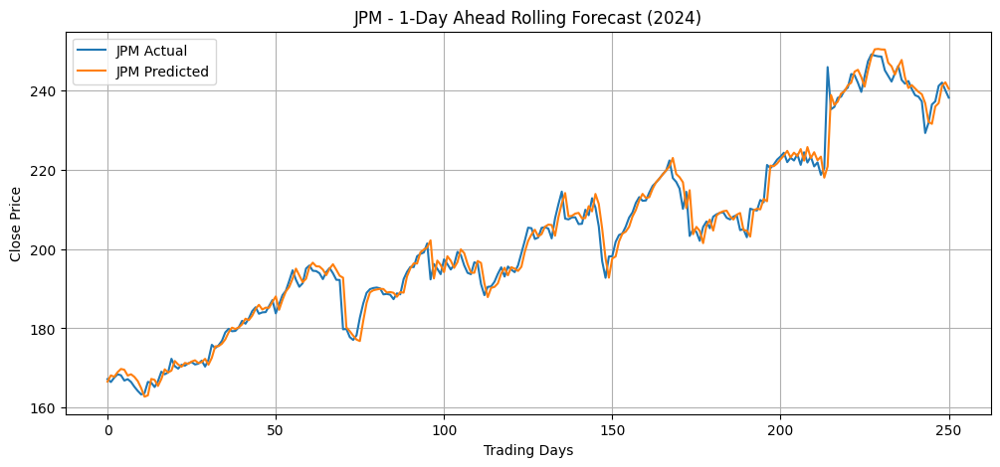


📊 NVDA Evaluation:
  RMSE: 3.5049
  MAE : 2.6674
  R²  : 0.9830


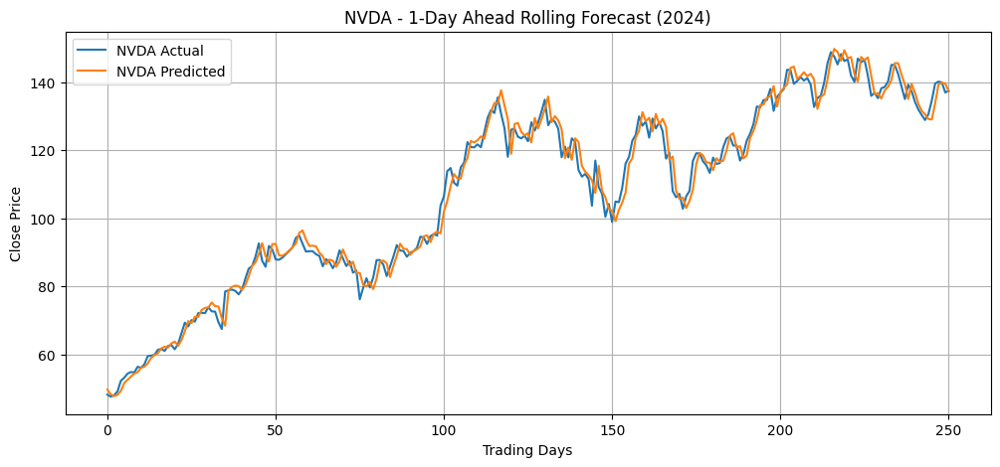


📊 SPY Evaluation:
  RMSE: 4.4123
  MAE : 3.2396
  R²  : 0.9866


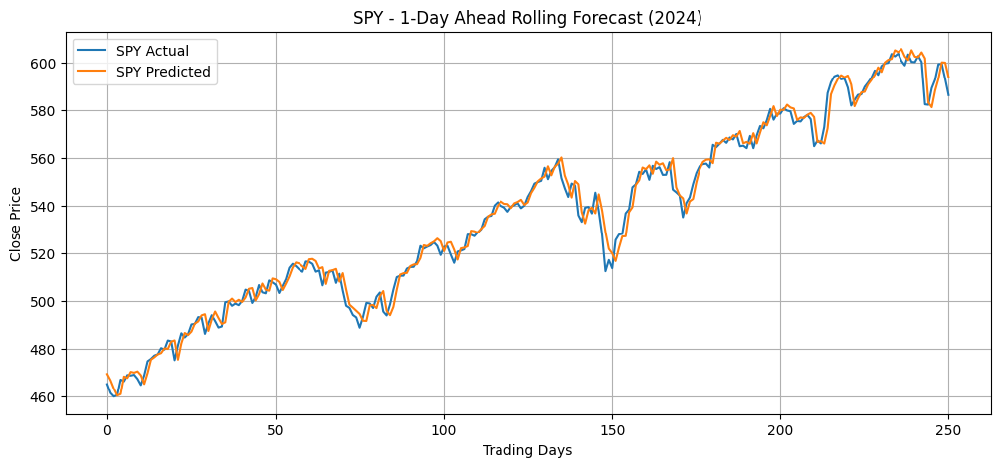

In [35]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

Batch size 32 very slightly worse. now try attention head =3

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.3249
  MAE : 2.5749
  R²  : 0.9831


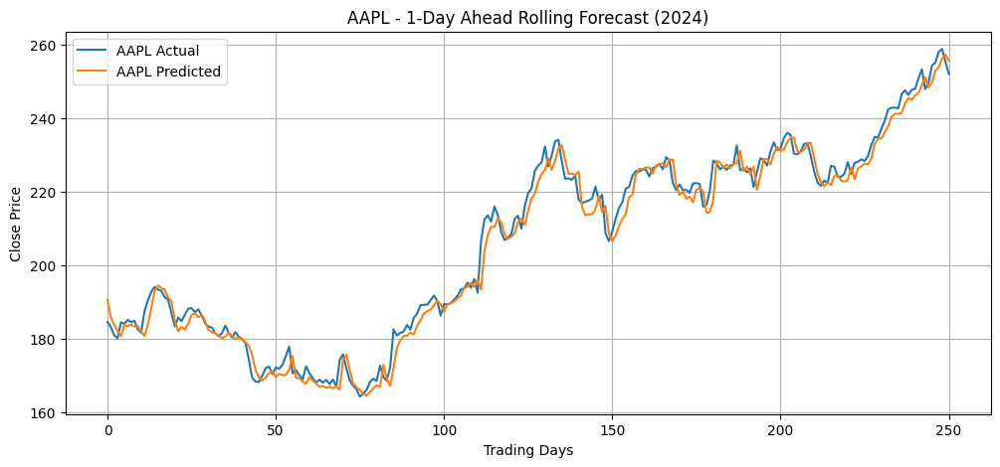


📊 JPM Evaluation:
  RMSE: 3.3277
  MAE : 2.3639
  R²  : 0.9774


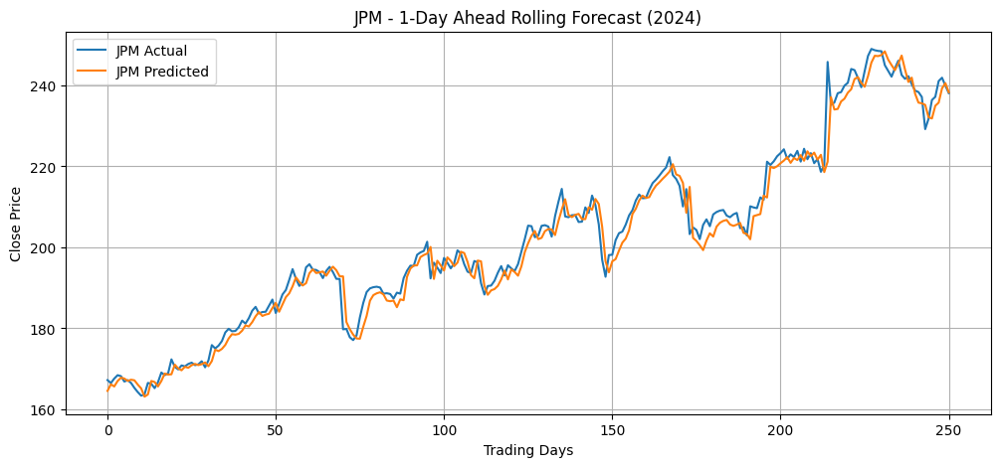


📊 NVDA Evaluation:
  RMSE: 3.9421
  MAE : 3.0620
  R²  : 0.9785


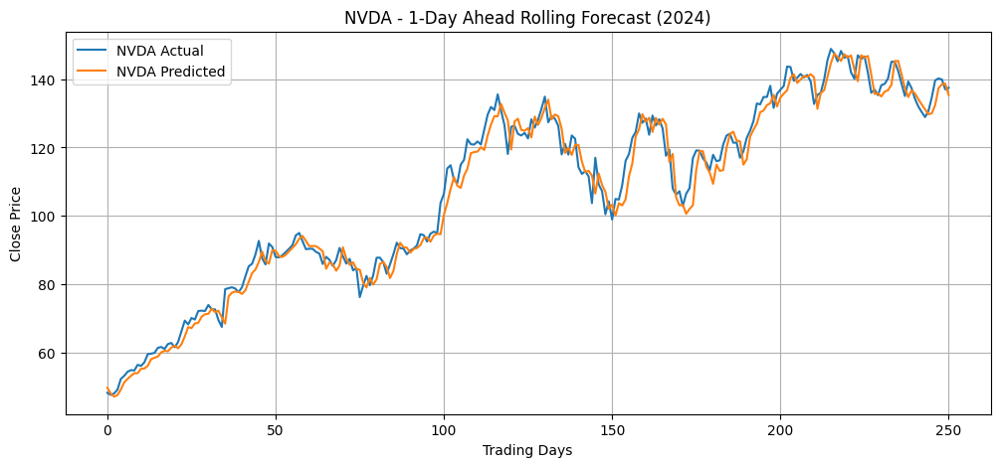


📊 SPY Evaluation:
  RMSE: 4.6916
  MAE : 3.4934
  R²  : 0.9848


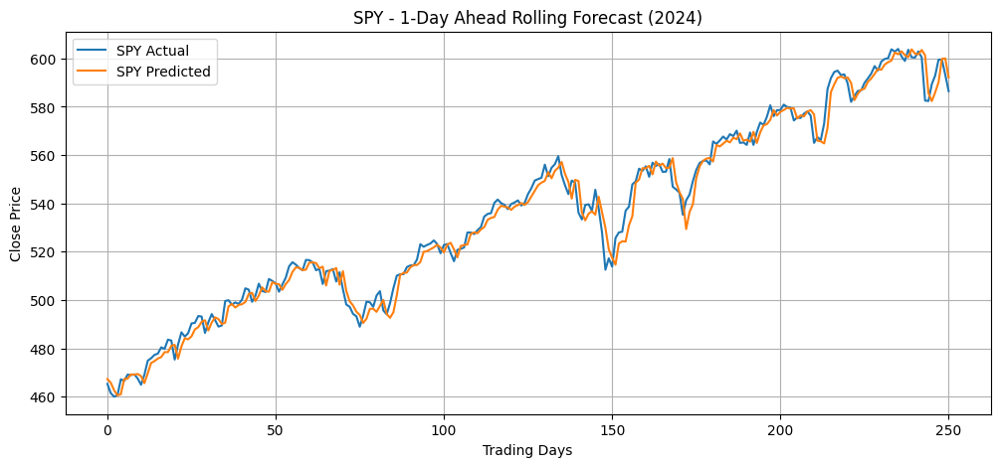

In [36]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=3,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

attention head 3 was . Try 1

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.3022
  MAE : 2.5096
  R²  : 0.9833


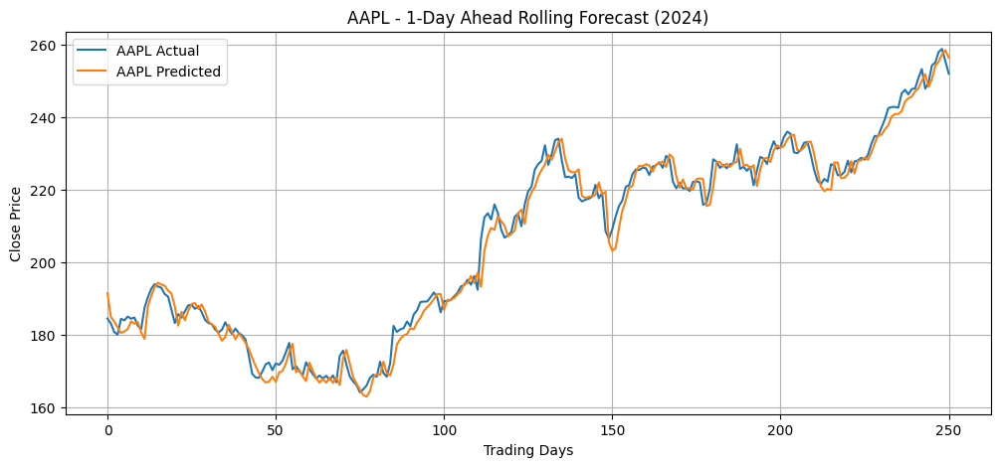


📊 JPM Evaluation:
  RMSE: 3.2085
  MAE : 2.1402
  R²  : 0.9790


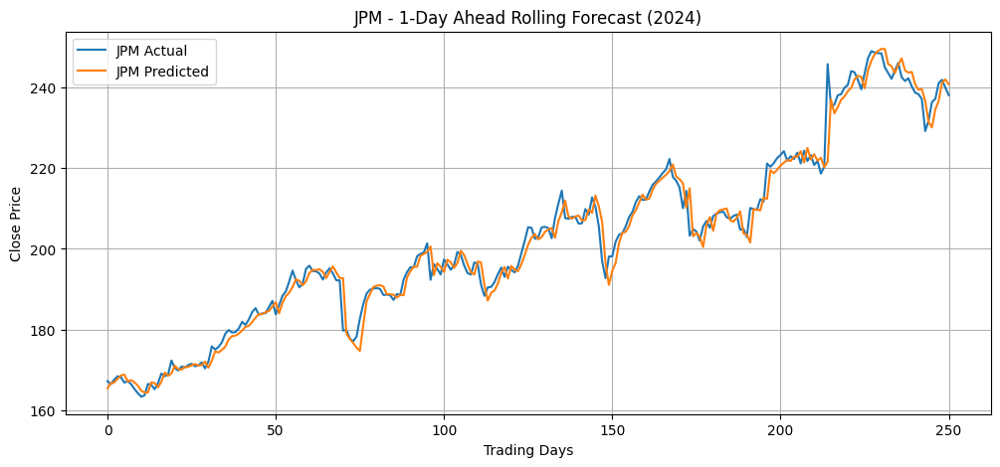


📊 NVDA Evaluation:
  RMSE: 3.7570
  MAE : 2.8837
  R²  : 0.9805


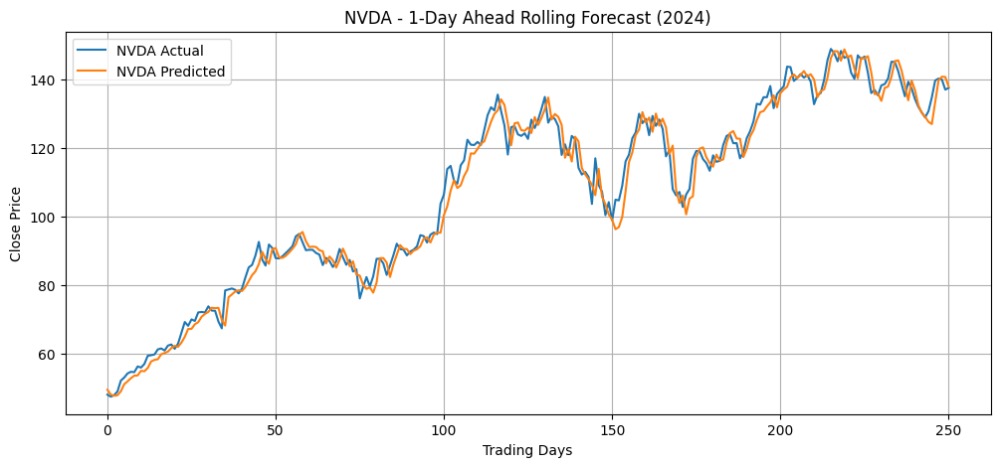


📊 SPY Evaluation:
  RMSE: 4.5238
  MAE : 3.3184
  R²  : 0.9859


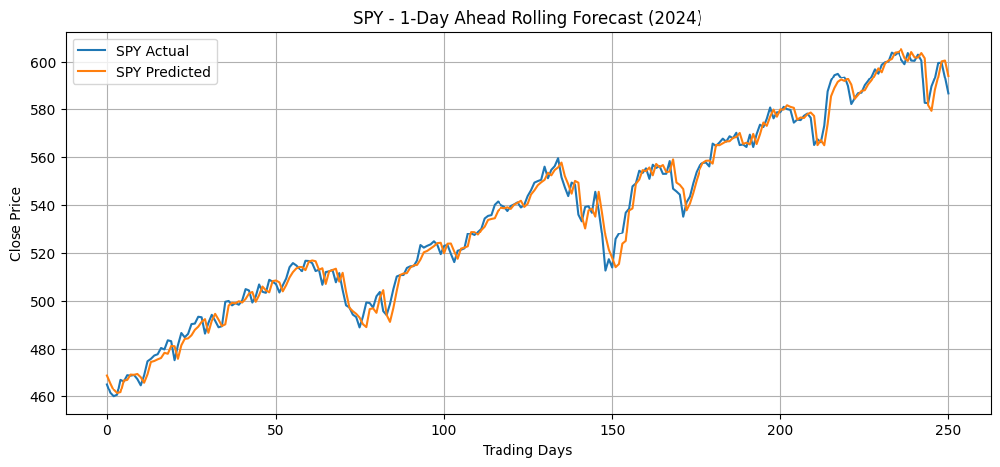

In [37]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=3,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)

    print(f"\n📊 {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

Worse. Probably worth just doing the test now.

# Final test:

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 221 K  | train
------------------------------------------------------------
221 K     Trainable params
0         Non-trainable params
221 K     Total params
0.886     Total estimated model params size (MB)
238       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 3.0048
  MAE : 2.2510
  R²  : 0.9862
  MAPE: 1.11%


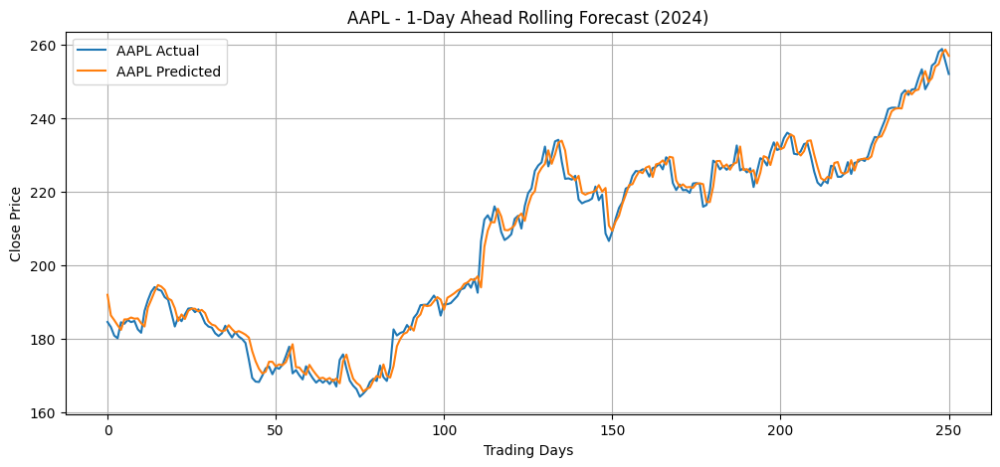


📊 JPM Evaluation:
  RMSE: 3.1483
  MAE : 2.0882
  R²  : 0.9798
  MAPE: 1.02%


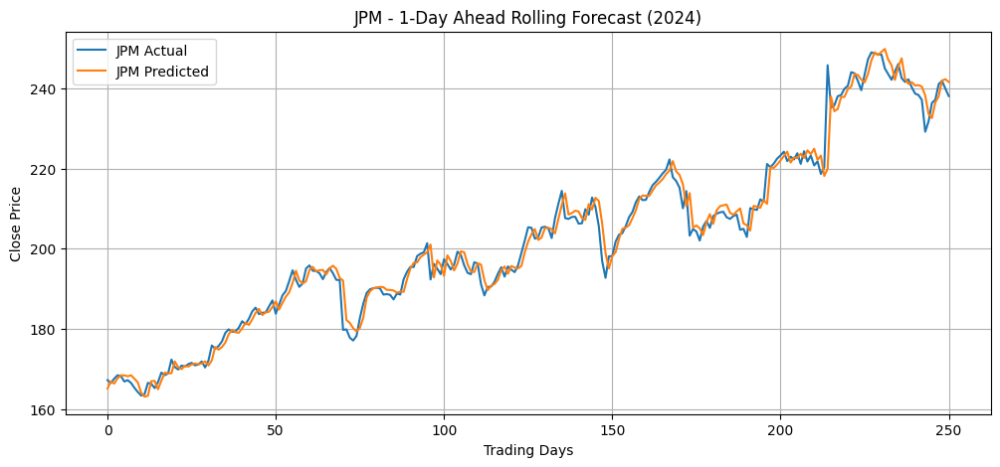


📊 NVDA Evaluation:
  RMSE: 3.6011
  MAE : 2.6864
  R²  : 0.9821
  MAPE: 2.52%


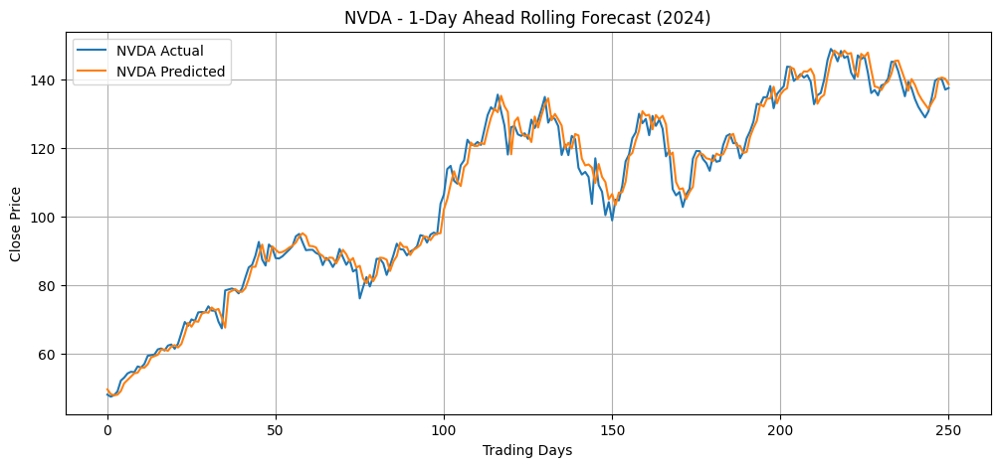


📊 SPY Evaluation:
  RMSE: 4.4123
  MAE : 3.2378
  R²  : 0.9866
  MAPE: 0.61%


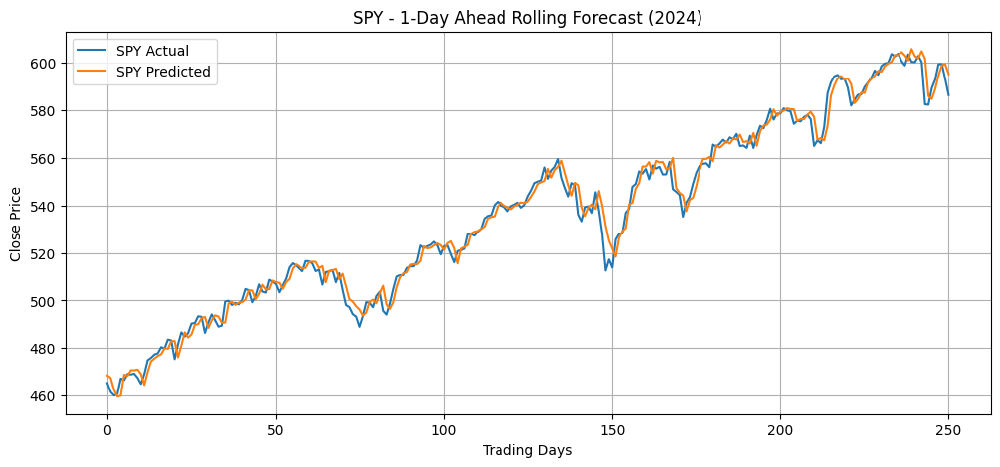

In [3]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2018-01-01') & (df['Date'] <= '2024-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2024-01-01"].copy()
test_df = df[df['Date'] >= "2023-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2024)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 221 K  | train
------------------------------------------------------------
221 K     Trainable params
0         Non-trainable params
221 K     Total params
0.886     Total estimated model params size (MB)
238       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 2.3274
  MAE : 1.7854
  R²  : 0.9737
  MAPE: 1.30%


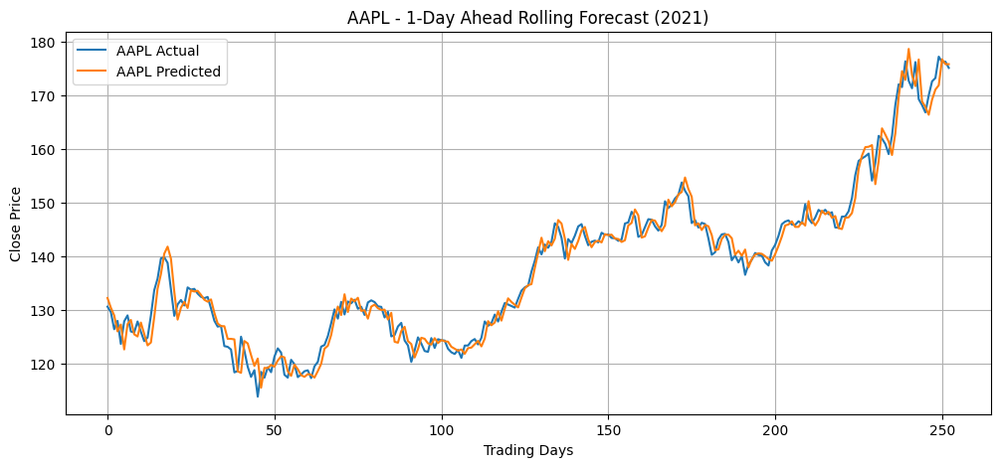


📊 JPM Evaluation:
  RMSE: 2.0012
  MAE : 1.5668
  R²  : 0.9568
  MAPE: 1.12%


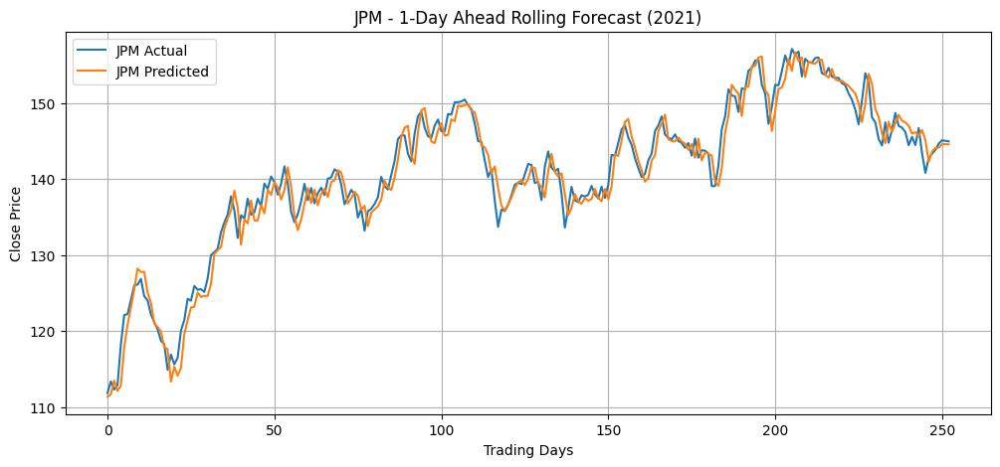


📊 NVDA Evaluation:
  RMSE: 0.6268
  MAE : 0.4266
  R²  : 0.9885
  MAPE: 2.14%


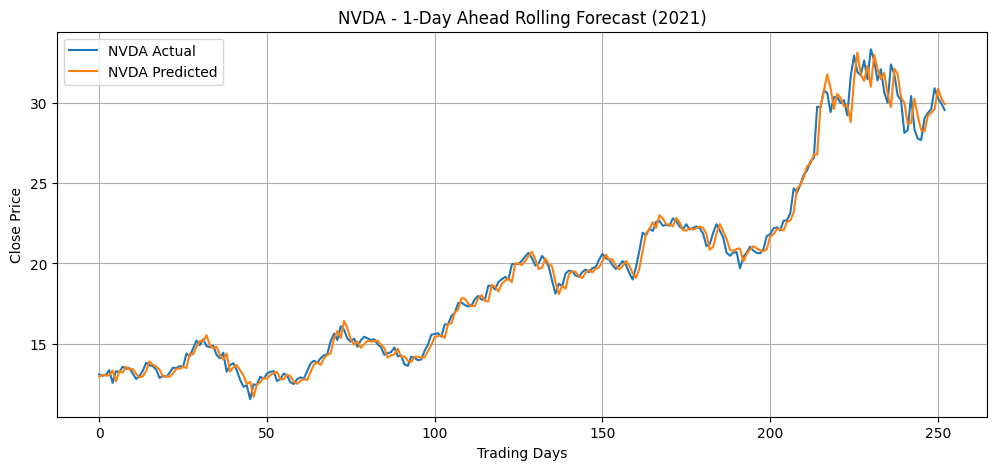


📊 SPY Evaluation:
  RMSE: 3.2848
  MAE : 2.5408
  R²  : 0.9869
  MAPE: 0.64%


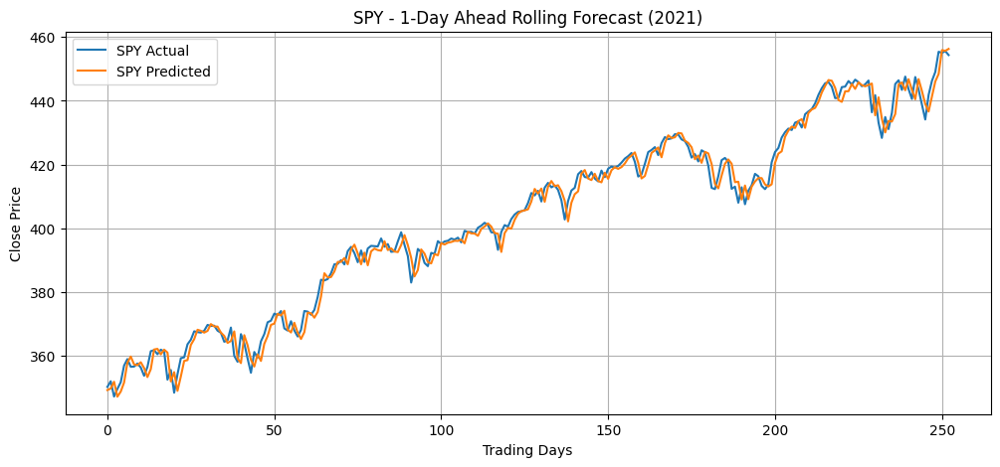

In [4]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2015-01-01') & (df['Date'] <= '2021-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2021-01-01"].copy()
test_df = df[df['Date'] >= "2020-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2021)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()

INFO:pytorch_lightning.utilities.rank_zero:💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                      | Params | Mode 
------------------------------------------------------------
0 | model | TemporalFusionTransformer | 221 K  | train
------------------------------------------------------------
221 K     Trainable params
0         Non-trainable params
221 K     Total params
0.886     Total estimated model params size (MB)
238       Modu

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]


📊 AAPL Evaluation:
  RMSE: 0.9910
  MAE : 0.6964
  R²  : 0.9601
  MAPE: 1.60%


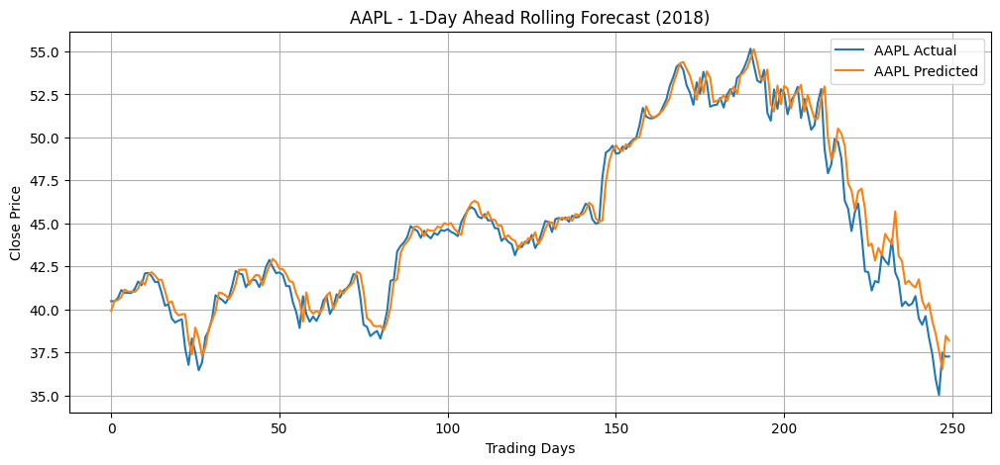


📊 JPM Evaluation:
  RMSE: 1.4345
  MAE : 1.0617
  R²  : 0.8572
  MAPE: 1.18%


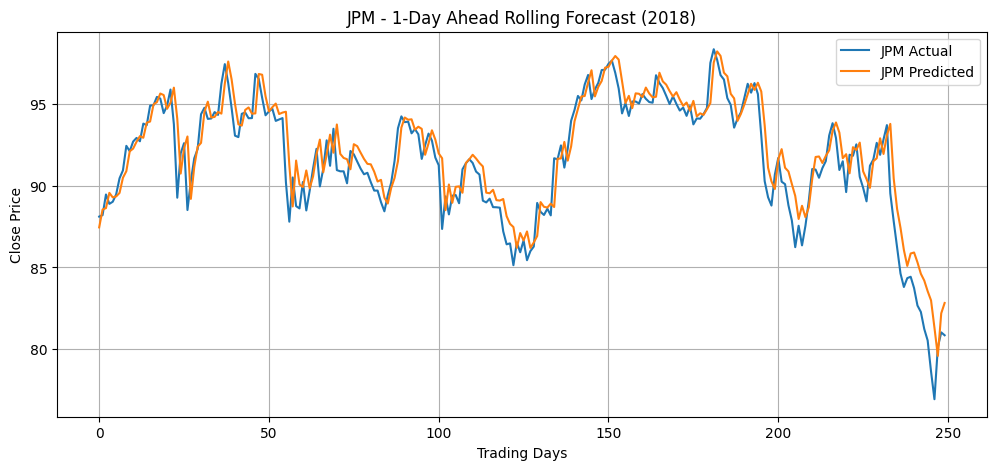


📊 NVDA Evaluation:
  RMSE: 0.2094
  MAE : 0.1436
  R²  : 0.9446
  MAPE: 2.80%


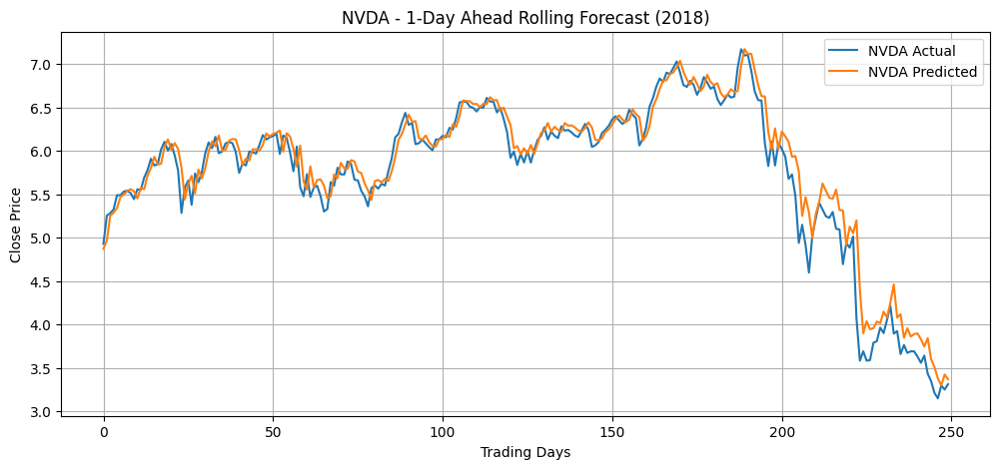


📊 SPY Evaluation:
  RMSE: 3.0009
  MAE : 2.0279
  R²  : 0.8896
  MAPE: 0.84%


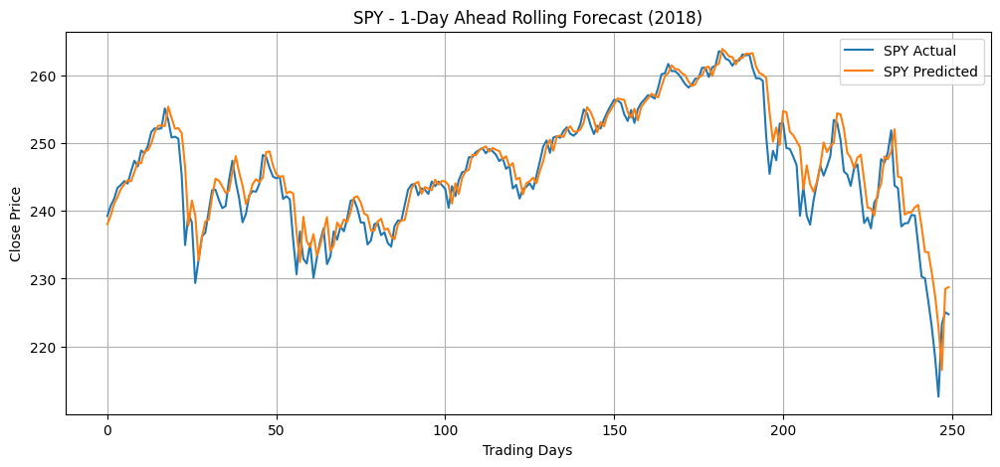

In [5]:
import pandas as pd
import numpy as np
import torch
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.metrics import SMAPE
from pytorch_lightning import Trainer, LightningModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from collections import defaultdict
import warnings
import logging
from ta.momentum import RSIIndicator
from ta.trend import MACD

warnings.filterwarnings("ignore")
logging.getLogger("lightning.pytorch.accelerators.cuda").setLevel(logging.WARNING)

# === Load and preprocess data for all stocks ===
def load_stock(file_path, stock_name):
    df = pd.read_csv(file_path, skiprows=3, header=None)
    df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
    df['group'] = stock_name
    df['RSI'] = RSIIndicator(df['Close']).rsi()
    df['MACD'] = MACD(df['Close']).macd()
    df['upper_shadow'] = df['High'] - df[['Open', 'Close']].max(axis=1)
    df['lower_shadow'] = df[['Open', 'Close']].min(axis=1) - df['Low']
    return df

aapl = load_stock("AAPL.csv", "AAPL")
jpm  = load_stock("JPM.csv", "JPM")
nvda = load_stock("NVDA.csv", "NVDA")
spy  = load_stock("SPY.csv",  "SPY")

df = pd.concat([jpm, nvda, spy, aapl], ignore_index=True)
df = df[(df['Date'] > '2012-01-01') & (df['Date'] <= '2018-12-31')]
df = df.sort_values(['group', 'Date'])
df['time_idx'] = df.groupby('group').cumcount()

# Split train/val and test (based on calendar year)
train_val_df = df[df['Date'] < "2018-01-01"].copy()
test_df = df[df['Date'] >= "2017-11-16"].copy()

# Recalculate time_idx in test_df based on prior max index
last_time_idx = train_val_df.groupby("group")["time_idx"].max().reset_index()
test_df = test_df.merge(last_time_idx, on="group", suffixes=("", "_last"))
test_df["time_idx"] = test_df.groupby("group").cumcount() + test_df["time_idx_last"] + 1
test_df.drop(columns=["time_idx_last"], inplace=True)

# === Define dataset parameters ===
max_encoder_length = 30
max_prediction_length = 1
training_cutoff = train_val_df["time_idx"].max() - 252  # leave last 252 days for validation

# === Training dataset ===
tft_dataset = TimeSeriesDataSet(
    train_val_df[train_val_df.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="Close",
    group_ids=["group"],
    max_encoder_length=max_encoder_length,
    max_prediction_length=max_prediction_length,
    time_varying_known_reals=["time_idx"],
    time_varying_unknown_reals=["Close", "RSI", "MACD", 'upper_shadow', 'lower_shadow'],
    static_categoricals=["group"],
    allow_missing_timesteps=True
)

# === Validation dataset (pre-2024 only) ===
val_df = train_val_df[(train_val_df.time_idx > (training_cutoff - max_encoder_length))]
validation = TimeSeriesDataSet.from_dataset(tft_dataset, val_df, stop_randomization=True)

train_loader = tft_dataset.to_dataloader(train=True, batch_size=64, num_workers=0)
val_loader = validation.to_dataloader(train=False, batch_size=64, num_workers=0)

# === Define LightningModule wrapper ===
class TFTLightningModule(LightningModule):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        out = self.model(x)
        y_pred = out[0]
        loss = self.model.loss(y_pred, y)
        self.log("val_loss", loss, prog_bar=True, batch_size=x['encoder_target'].shape[0])
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=self.model.hparams.learning_rate)

# === Train TFT model ===
tft = TemporalFusionTransformer.from_dataset(
    tft_dataset,
    learning_rate=0.01,
    hidden_size=64,
    attention_head_size=2,
    dropout=0.1,
    loss=SMAPE(),
    log_interval=10,
    reduce_on_plateau_patience=4,
).to("cuda")

module = TFTLightningModule(tft)

trainer = Trainer(
    max_epochs=20,
    gradient_clip_val=0.1,
    callbacks=[EarlyStopping(monitor="val_loss", patience=5, mode="min")],
    limit_train_batches=30,
    logger=TensorBoardLogger("lightning_logs")
)

trainer.fit(module, train_dataloaders=train_loader, val_dataloaders=val_loader)


# === Rolling prediction on 2024 test data ===
preds_by_group = defaultdict(list)
actuals_by_group = defaultdict(list)

for group in test_df["group"].unique():
    df_group = test_df[test_df["group"] == group].copy()
    df_group = df_group.reset_index(drop=True)
    df_group["time_idx"] = np.arange(len(df_group))  # reindex cleanly for this stock

    steps = len(df_group["time_idx"].unique()) - max_encoder_length - max_prediction_length

    for offset in range(steps):
        decoder_end_time = offset + max_encoder_length + max_prediction_length - 1
        data_slice = df_group[df_group.time_idx <= decoder_end_time].tail(max_encoder_length + max_prediction_length)

        if data_slice['time_idx'].nunique() < (max_encoder_length + max_prediction_length):
            continue

        try:
            predict_dataset = TimeSeriesDataSet.from_dataset(tft_dataset, data_slice, stop_randomization=True)
            predict_loader = predict_dataset.to_dataloader(train=False, batch_size=1, num_workers=0)

            prediction = tft.predict(predict_loader).cpu().numpy().flatten()[0]
            actual = data_slice.iloc[-1]["Close"]

            preds_by_group[group].append(prediction)
            actuals_by_group[group].append(actual)
        except Exception as e:
            print(f"Skipping {group} at offset {offset} due to error: {e}")


# === Evaluation & Plotting ===
for group in preds_by_group:
    preds = preds_by_group[group]
    acts = actuals_by_group[group]

    if len(preds) == 0 or len(acts) == 0:
        print(f"\nNot enough data to evaluate {group}. Skipping...")
        continue

    rmse = np.sqrt(mean_squared_error(acts, preds))
    mae = mean_absolute_error(acts, preds)
    r2 = r2_score(acts, preds)
    mape = np.mean(np.abs((np.array(acts) - np.array(preds)) / np.array(acts))) * 100

    print(f"\n {group} Evaluation:")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE : {mae:.4f}")
    print(f"  R²  : {r2:.4f}")
    print(f"  MAPE: {mape:.2f}%")

    plt.figure(figsize=(12, 5))
    plt.plot(acts, label=f"{group} Actual")
    plt.plot(preds, label=f"{group} Predicted")
    plt.title(f"{group} - 1-Day Ahead Rolling Forecast (2018)")
    plt.xlabel("Trading Days")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid()
    plt.show()